In [1]:
import math
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from collections import deque
import torch
from torch.nn import Linear
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from sklearn.metrics import confusion_matrix, pairwise_distances
from sklearn.manifold import TSNE
from itertools import chain
import time
import datetime
import pickle

from IPython.display import Javascript  # Restrict height of output cell.
display(Javascript('''google.colab.output.setIframeHeight(0, true, {maxHeight: 300})'''))

import warnings
warnings.simplefilter("ignore")

<IPython.core.display.Javascript object>

In [2]:
def graph_to_matrix(G,weighted=False,directed=False): # convert a graph object into a matrix
    matrix = np.zeros((len(G.nodes()),len(G.nodes())))
    for edge in G.edges(data=True):
        if weighted:
            matrix[edge[0],edge[1]] = edge[2]['weight']
        else:
            matrix[edge[0],edge[1]] = 1
        if not directed:
            matrix[edge[1],edge[0]] = matrix[edge[0],edge[1]] 
    return matrix
    
def matrix_to_graph(matrix): # convert an adjacency matrix into a graph object
    G = nx.Graph().to_directed()
    for i in range(matrix.shape[0]):
        G.add_node(i)
    for i in range(matrix.shape[0]):
        for j in range(matrix.shape[1]):
            if matrix[i,j] != 0:
                G.add_edge(i, j, weight=matrix[i,j])
    return G

def ErdosRenyiGraph(n,p):
    return nx.erdos_renyi_graph(n, p).to_directed(),False

def dRegularGraph(n,d):
    return nx.random_regular_graph(d, n).to_directed(),False

def randomAdjacencyMatrix(n,p,weighted=False,directed=False): #ErdosRenyi is unweighted & undirected
    # matrix is in dimension nxn (i.e. n is the number of nodes)
    # p is probability for having non-zero entries
    # values of non-zero entries are sampled in Unif[0,1) if graph is weighted
    matrix = (np.random.rand(n, n) < p).astype(int)
    np.fill_diagonal(matrix, 0)
    if weighted:
        matrix = matrix * np.random.rand(n, n)
    if not directed:
        for i in range(n):
            for j in range(n):
                matrix[j,i] = matrix[i,j]
    return matrix,directed

def geometricAdjacencyMatrix(n,d,r,metric='euclidean'):
    '''
    Valid values for metric are:
    From scikit-learn: [‘cityblock’, ‘cosine’, ‘euclidean’, ‘l1’, ‘l2’, ‘manhattan’]. These metrics support sparse matrix inputs. [‘nan_euclidean’] but it does not yet support sparse matrices.
    From scipy.spatial.distance: [‘braycurtis’, ‘canberra’, ‘chebyshev’, ‘correlation’, ‘dice’, ‘hamming’, ‘jaccard’, ‘kulsinski’, ‘mahalanobis’, ‘minkowski’, ‘rogerstanimoto’, ‘russellrao’, ‘seuclidean’, ‘sokalmichener’, ‘sokalsneath’, ‘sqeuclidean’, ‘yule’] See the documentation for scipy.spatial.distance for details on these metrics. These metrics do not support sparse matrix inputs.
    '''
    points = np.random.uniform(0, 1, size=(n, d))
    distance_matrix = (pairwise_distances(points, metric=metric) < r).astype(int)
    np.fill_diagonal(distance_matrix, 0)
    return distance_matrix,False

def ChungLuGraph(n,max_degree):
    degrees = np.random.choice(range(1,max_degree+1), n, replace=True)
    G = nx.Graph()
    for node, degree in enumerate(degrees):
        G.add_node(node, degree=degree)
    for u in G.nodes():
        for v in G.nodes():
            if u < v and np.random.rand() < G.nodes[u]['degree'] * G.nodes[v]['degree'] / (2 * sum(degrees)):
                    G.add_edge(u, v)
    return G.to_directed(),False

def gridGraph(nrows,ncols): # not random
    G = nx.Graph()
    for i in range(nrows):
        for j in range(ncols):
            G.add_node(i*ncols+j)
    for i in range(nrows):
        for j in range(ncols):
            if i < nrows - 1:
                G.add_edge(i*ncols+j, (i+1)*ncols+j)
            if j < ncols - 1:
                G.add_edge(i*ncols+j+1, i*ncols+j)
    return G.to_directed(),False

In [3]:
def closestSeed_networkx(G,u,S,return_path=False):
    closest_point = None
    smallest_distance = float('inf')
    shortest_path = []
    for s in S:
        path = nx.shortest_path(G, source=u, target=s, weight="weight")
        distance = sum(G[path[i]][path[i + 1]]["weight"] for i in range(len(path) - 1))
        if distance < smallest_distance:
            closest_point, smallest_distance, shortest_path = path[-1], distance, path            
    if not return_path:
        return closest_point, smallest_distance
    else:
        return closest_point, smallest_distance, shortest_path

#### Das Sarma & Bourgain ####

def closestSeedFromStartPoint(graph, start, target_set, return_path=False):
    # Works for weighted & unweighted, directed & undirected graphs 
    # Doesn't allow self-directed nodes

    closest_point, smallest_weight, shortest_path = None, float('inf'), []
    target_set = [x for x in target_set if x != start]
    if len(target_set) > 0:
        visited = set()  # To keep track of visited vertices (vertices in paths stored in queue)
        queue = deque([(start, 0, [])])  # Initialize the queue with the starting vertex, its path, and the total weight
        storage = deque() # To store nodes removed from queue

        while queue:
            vertex, weight, path = queue.popleft()  # Dequeue a vertex, its path, and the total weight
            storage.append((vertex, weight))
            if vertex not in target_set:
                for neighbor, edge_weight in enumerate(graph[vertex]):
                    if neighbor not in path and neighbor != vertex and edge_weight != 0:
                        new_weight = weight + edge_weight
                        if neighbor not in visited:
                            queue.append((neighbor, new_weight, path + [vertex]))
                            visited.add(neighbor)
                        else: # Replace the path from 'start' to 'neighbor' in queue or storage with a shorter one if found
                            weight_info = [(index,item[1]) for index,item in enumerate(list(queue)) if item[0] == neighbor]
                            if len(weight_info) != 0:
                                for index, w in weight_info:
                                    if new_weight < w:
                                        del queue[index]
                                        queue.append((neighbor, new_weight, path + [vertex]))
                            else:
                                weights = [item[1] for item in storage if item[0] == neighbor]
                                if len(weights) > 0 and new_weight < np.min(weights):
                                    queue.append((neighbor, new_weight, path + [vertex]))

            elif vertex in target_set:
                if closest_point == None:
                    closest_point, smallest_weight, shortest_path = vertex, weight, path + [vertex]
                else:
                    if weight < smallest_weight:
                        closest_point, smallest_weight, shortest_path = vertex, weight, path + [vertex]
                k = len(queue)
                for i in range(k):
                    if smallest_weight <= queue[k-1-i][1]:
                        queue.remove(queue[k-1-i]) # Remove all paths in queue which are longer than the current shortest from 'start' to a seed
    
    if return_path:
        return closest_point, smallest_weight, shortest_path
    else:
        return closest_point, smallest_weight

def closestSeedToEndPoint(graph, target, start_set, return_path=False): 
    # Works for weighted & unweighted, directed & undirected graphs 
    # Doesn't allow self-directed nodes

    closest_point, smallest_weight, shortest_path = None, float('inf'), []
    start_set = [x for x in start_set if x != target]
    if len(start_set) > 0:
        visited = set()  # To keep track of visited vertices (vertices in paths stored in queue)
        queue = deque()  # Initialize the queue with the starting vertex, its path, and the total weight
        for i in range(len(start_set)):
            queue.append((start_set[i], 0, []))
        storage = deque()

        while queue:
            vertex, weight, path = queue.popleft()  # Dequeue a vertex, its path, and the total weight
            storage.append((vertex, weight))
            if vertex != target:
                for neighbor, edge_weight in enumerate(graph[vertex]):
                    if neighbor not in path and neighbor not in start_set and neighbor != vertex and edge_weight != 0:
                        new_weight = weight + edge_weight
                        if neighbor not in visited:
                            queue.append((neighbor, new_weight, path + [vertex]))
                            visited.add(neighbor)
                        else: # Replace the path from a start node to 'neighbor' in queue with a shorter one if found
                            weight_info = [(index,item[1]) for index,item in enumerate(list(queue)) if item[0] == neighbor]
                            if len(weight_info) != 0:
                                for index, w in weight_info:
                                    if new_weight < w:
                                        del queue[index]
                                        queue.append((neighbor, new_weight, path + [vertex]))
                            else:
                                weights = [item[1] for item in storage if item[0] == neighbor]
                                if len(weights) > 0 and new_weight < np.min(weights):
                                    queue.append((neighbor, new_weight, path + [vertex]))
                                
            else:
                if closest_point == None:
                    closest_point, smallest_weight, shortest_path = vertex, weight, path + [vertex]
                else:
                    if weight < smallest_weight:
                        closest_point, smallest_weight, shortest_path = vertex, weight, path + [vertex]
                k = len(queue)
                for i in range(k):
                    if smallest_weight <= queue[k-1-i][1]:
                        queue.remove(queue[k-1-i]) # Remove all paths in queue which are longer than the current shortest from 'start' to a seed

    if return_path:
        return closest_point, smallest_weight, shortest_path
    else:
        return closest_point, smallest_weight

def offlineSample(G,u,node_to_sets=True):
    support = [n for n in range(G.shape[0]) if np.count_nonzero(G[n]) >= 2 and n != u] # u is removed from the support for sampling seed sets
    if len(support) == 0:
        return set()
    r = math.floor(np.log(len(support)))
    sample_sets = [np.random.choice(support,size=2**i,replace=False) for i in range(r+1)]
    if node_to_sets:
        closest_points = set([closestSeedFromStartPoint(G,u,S) for S in sample_sets])
    else:
        closest_points = set([closestSeedToEndPoint(G,u,S) for S in sample_sets])
    if (None,float('inf')) in closest_points:
        closest_points.remove((None,float('inf')))
    return closest_points,set(np.concatenate(sample_sets))

def offlineSketch(G,u,k,node_to_sets=True):
    closest_points,sample_sets = offlineSample(G,u,node_to_sets)
    for i in range(k):
        closest_points_new,sample_sets_new = offlineSample(G,u,node_to_sets)
        closest_points = closest_points.union(closest_points_new)
        sample_sets = sample_sets.union(sample_sets_new)
    return np.array(list(closest_points)),np.array(list(sample_sets))

def onlineShortestPath_Sarma(G,u,v,k,directed=False): ## upper bound
    if not directed:
        sketch_u,_ = offlineSketch(G,u,k)
        sketch_v,_ = offlineSketch(G,v,k)
    else:
        sketch_u,_ = offlineSketch(G,u,k)
    if sketch_u.shape[0] != 0 and sketch_v.shape[0] != 0:
        common_nodes = [w for w in sketch_u[:,0] if w in sketch_v[:,0]]
        while None in common_nodes:
            common_nodes.remove(None)
        min_dist = float('inf')
        for w in common_nodes:
            dist = sketch_u[sketch_u[:, 0] == w][0,1] + sketch_v[sketch_v[:, 0] == w][0,1]
            if dist < min_dist:
                min_dist = dist
        return min_dist
    else:
        return float('inf')

def onlineShortestPath_Bourgain(G,u,v,directed=False): ## lower bound
    support = [n for n in range(G.shape[0]) if np.count_nonzero(G[n]) >= 2 and n != u] # u is removed from the support for sampling seed sets
    r = math.floor(np.log(len(support)))
    sample_sets = [np.random.choice(support,size=2**i,replace=False) for i in range(r+1)]
    if directed:
        d_u_S = [closestSeedFromStartPoint(G,u,S)[1] for S in sample_sets]
        d_v_S = [closestSeedFromStartPoint(G,v,S)[1] for S in sample_sets]
        d_S_u = [closestSeedToEndPoint(G,u,S)[1] for S in sample_sets]
        d_S_v = [closestSeedToEndPoint(G,v,S)[1] for S in sample_sets]
        to_remove = [idx for idx,val in enumerate(list(zip(d_u_S,d_v_S))) if val[0] == float('inf') or val[1] == float('inf')]
        d_u_S = np.array([value for index, value in enumerate(d_u_S) if index not in to_remove])
        d_v_S = np.array([value for index, value in enumerate(d_v_S) if index not in to_remove])
        to_remove = [idx for idx,val in enumerate(list(zip(d_S_u,d_S_v))) if val[0] == float('inf') or val[1] == float('inf')]
        d_S_u = np.array([value for index, value in enumerate(d_S_u) if index not in to_remove])
        d_S_v = np.array([value for index, value in enumerate(d_S_v) if index not in to_remove])
        return max([0,np.max(d_S_v-d_S_u),np.max(d_u_S-d_v_S)])
    else:
        d_u_S = [closestSeedFromStartPoint(G,u,S)[1] for S in sample_sets]
        d_v_S = [closestSeedFromStartPoint(G,v,S)[1] for S in sample_sets]
        to_remove = [idx for idx,val in enumerate(list(zip(d_u_S,d_v_S))) if val[0] == float('inf') or val[1] == float('inf')]
        d_u_S = np.array([value for index, value in enumerate(d_u_S) if index not in to_remove])
        d_v_S = np.array([value for index, value in enumerate(d_v_S) if index not in to_remove])
        return np.max(np.abs(d_u_S-d_v_S))

def shortestDistance_allNodes_Sarma(G,u,k,directed=False):
    distances = np.zeros(G.shape[0])
    for v in range(G.shape[0]):
        if u != v:
            distances[v] = onlineShortestPath_Sarma(G,u,v,k,directed)
    return distances

def shortestDistance_allNodes_Bourgain(G,u,directed=False):
    distances = np.zeros(G.shape[0])
    for v in range(G.shape[0]):
        if u != v:
            distances[v] = onlineShortestPath_Bourgain(G,u,v,directed)
    return distances

def shortestDistance_allNodes_networkx(G,u):
    if isinstance(G, np.ndarray):
        G = matrix_to_graph(G)
    n_nodes = len(G.nodes())
    distances = np.zeros(n_nodes)
    for v in range(n_nodes):
        if u != v:
            if nx.has_path(G, u, v):
                distances[v] = nx.shortest_path_length(G, u, v)
            else:
                distances[v] = float('inf')       
    return distances

In [4]:
class MLP(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels1, hidden_channels2, hidden_channels3, out_channels, sigmoid = False, reLU = False):
        super(MLP, self).__init__()
        #torch.manual_seed(12345)
        self.name = 'mlp'
        self.lin1 = Linear(in_channels, hidden_channels1)
        self.lin2 = Linear(hidden_channels1, hidden_channels2)
        self.lin3 = Linear(hidden_channels2, hidden_channels3)
        self.lin4 = Linear(hidden_channels3, out_channels)
        #self.lin5 = Linear(hidden_channels4, hidden_channels5)
        #self.lin6 = Linear(hidden_channels5, out_channels)
        if sigmoid:
            self.sigmoid = torch.nn.Sigmoid()
        else:
            self.sigmoid = None
        if reLU:
            self.reLU = torch.nn.ReLU()
        else:
            self.reLU = None

    def forward(self, x):
        x = self.lin1(x)
        x = x.relu()
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.lin2(x)
        x = x.relu()
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.lin3(x)
        x = x.relu()
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.lin4(x)
        #x = x.relu()
        #x = F.dropout(x, p=0.5, training=self.training)
        #x = self.lin5(x)
        #x = x.relu()
        #x = F.dropout(x, p=0.5, training=self.training)
        #x = self.lin6(x)
        if self.sigmoid != None:
            x = self.sigmoid(x)
        if self.reLU != None:
            x = self.reLU(x)
        return x

class GCN(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels1, hidden_channels2, hidden_channels3, out_channels, sigmoid = False, reLU = False):
        super(GCN, self).__init__()
        #torch.manual_seed(1234567)
        self.name = 'gcn'
        self.conv1 = GCNConv(in_channels, hidden_channels1)
        self.conv2 = GCNConv(hidden_channels1, hidden_channels2)
        self.conv3 = GCNConv(hidden_channels2, hidden_channels3)
        self.conv4 = GCNConv(hidden_channels3, out_channels)
        #self.conv5 = GCNConv(hidden_channels4, hidden_channels5)
        #self.conv6 = GCNConv(hidden_channels5, out_channels)
        if sigmoid:
            self.sigmoid = torch.nn.Sigmoid()
        else:
            self.sigmoid = None

    def forward(self, x, edge_index):
        x = self.conv1(x, edge_index)
        x = x.relu()
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.conv2(x, edge_index)
        x = x.relu()
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.conv3(x, edge_index)
        x = x.relu()
        x = F.dropout(x, p=0.5, training=self.training)
        x = self.conv4(x, edge_index)
        #x = x.relu()
        #x = F.dropout(x, p=0.5, training=self.training)
        #x = self.conv5(x, edge_index)
        #x = x.relu()
        #x = F.dropout(x, p=0.5, training=self.training)
        #x = self.conv6(x, edge_index)
        if self.sigmoid == None:
            return x
        else:
            return self.sigmoid(x)

def build(n, model_type,criterion_type,optimizer_type,scheduler_type=None):
    if model_type == 'mlp':
        if criterion_type == 'bce':
            model = MLP(n,12,8,4,2,sigmoid = True)
        elif criterion_type in ['mse','l2','l1']: 
            model = MLP(n,12,8,4,1,reLU = True)
        else:
            model = MLP(n,12,8,4,2)
    elif model_type == 'gcn':
        if criterion_type == 'bce':
            model = GCN(n,12,8,4,2,sigmoid = True)
        elif criterion_type in ['mse','l2','l1']: 
            model = GCN(n,12,8,4,1,reLU = True)
        else:
            model = GCN(n,12,8,4,2)
    else:
        raise ValueError(
            "Model type not yet defined."
        )
    
    if criterion_type == 'ce':
        criterion = torch.nn.CrossEntropyLoss()
    elif criterion_type == 'bce':
        criterion = torch.nn.BCELoss()
    elif criterion_type in ['mse','l2']:
        criterion = torch.nn.MSELoss()
    elif criterion_type == 'l1':
        criterion = torch.nn.L1Loss()
    else:
        raise ValueError(
            "Criterion type not yet defined."
        )
    
    if optimizer_type == 'adam':
        optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=0.0001)
    elif optimizer_type == 'sgd':
        optimizer = torch.optim.SGD(model.parameters(), lr=0.01, weight_decay=0.0001, momentum=0.9)
    elif optimizer_type == 'rmsprop':
        optimizer = torch.optim.RMSprop(model.parameters(), lr=0.01, weight_decay=0.0001, alpha=0.99, eps=1e-8, momentum=0.9)
    elif optimizer_type == 'adagrad':
        optimizer = torch.optim.Adagrad(model.parameters(), lr=0.01, weight_decay=0.0001, lr_decay=0.0001)
    else:
        raise ValueError(
            "Optimizer type not yet defined."
        )
    
    if scheduler_type == None:
        scheduler = None
    else:
        if scheduler_type == 'step':
            scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)
        elif scheduler_type == 'reduce_on_plateau':
            scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.5, verbose=False)
        elif scheduler_type == 'exponential':
            scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.95)
        elif scheduler_type == 'cosine':
            scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10)
        elif scheduler_type == 'cyclic':
            if optimizer_type in ['sgd','rmsprop']:
                scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer, base_lr=0.001, max_lr=0.1, cycle_momentum=True)
            else:
                scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer, base_lr=0.001, max_lr=0.1, cycle_momentum=False)
        elif scheduler_type == 'cyclic-cosine':
            cycle_epochs = 5
            if optimizer_type in ['sgd','rmsprop']:
                scheduler_cyclic = torch.optim.lr_scheduler.CyclicLR(optimizer, base_lr=0.001, max_lr=0.1, step_size_up=cycle_epochs, cycle_momentum=True)
            else:
                scheduler_cyclic = torch.optim.lr_scheduler.CyclicLR(optimizer, base_lr=0.001, max_lr=0.1, step_size_up=cycle_epochs, cycle_momentum=False)
            scheduler_cosine = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=cycle_epochs * 2)
        else:
            raise ValueError(
                "Scheduler type not yet defined."
            )
        
    print(model)
    if scheduler_type == 'cyclic-cosine':
        return model,criterion,optimizer,[scheduler_cyclic,scheduler_cosine]
    else:
        return model,criterion,optimizer,[scheduler]

In [5]:
def test(gpu_bool,model,criterion,criterion_type,samples_x,samples_y,samples_edge_index=None):
    t_loss = 0
    total_samples = 0
    y_true = []
    y_pred = []
    model.eval()
    with torch.no_grad():
        if samples_edge_index == None:
            for x,y in list(zip(samples_x,samples_y)):
                if gpu_bool:
                    x = x.to('cuda:0')
                    y = y.to('cuda:0')
                out = model(x)  # Perform a single forward pass.
                if criterion_type == 'bce':
                    y = torch.stack((1-y, y)).T.to(torch.float32)
                    y_true.extend(y[:,1])
                else:
                    y_true.extend(y)
                t_loss += criterion(out, y)
                total_samples += 1
                pred = out.argmax(dim=1) #  Use the class with highest probability.
                y_pred.extend(pred)
        else:
            for x,y,edge_index in list(zip(samples_x,samples_y,samples_edge_index)):
                if gpu_bool:
                    x = x.to('cuda:0')
                    y = y.to('cuda:0')
                    edge_index = edge_index.to('cuda:0')
                out = model(x,edge_index)  # Perform a single forward pass.
                if criterion_type == 'bce':
                    y = torch.stack((1-y, y)).T.to(torch.float32)
                    y_true.extend(y[:,1])
                else:
                    y_true.extend(y)
                t_loss += criterion(out, y)
                total_samples += 1
                pred = out.argmax(dim=1) #  Use the class with highest probability.
                y_pred.extend(pred)
    t_loss = t_loss/total_samples
    t_loss = t_loss.cpu()
    y_true = [y.cpu() for y in y_true]
    y_pred = [y.cpu() for y in y_pred]
    if criterion_type in ['mse','l2']:
        return t_loss, np.mean((np.array(y_true) - np.array(y_pred)) ** 2), None, None
    elif criterion_type == 'l1':
        return t_loss, np.mean(np.abs(np.array(y_true) - np.array(y_pred))), None, None
    else:
        t_accuracy = sum(np.array(y_true) == np.array(y_pred))/len(y_true)
        cm = confusion_matrix(y_true, y_pred)
        tn, fp, fn, tp = cm.ravel()
        t_sensitivity = tp / (tp + fn)
        t_specificity = tn / (tn + fp)
        return t_loss, t_accuracy, t_sensitivity, t_specificity

def train(gpu_bool,model,criterion,optimizer,scheduler,criterion_type,scheduler_type,x_train,x_val,y_train,y_val,edge_index_train=None,edge_index_val=None):
    model.train()
    if edge_index_train == None:
        for x,y in list(zip(x_train,y_train)):
            optimizer.zero_grad()  # Clear gradients.
            if gpu_bool:
                x = x.to('cuda:0')
                y = y.to('cuda:0')
            out = model(x)  # Perform a single forward pass.
            if criterion_type == 'bce':
                y = torch.stack((1-y, y)).T.to(torch.float32)
            t_loss = criterion(out, y)  # Compute the loss solely based on the training nodes.
            t_loss.backward()  # Derive gradients
            optimizer.step()  # Update parameters based on gradients.
    else:
        for x,y,edge_index in list(zip(x_train,y_train,edge_index_train)):
            optimizer.zero_grad()  # Clear gradients.
            if gpu_bool:
                x = x.to('cuda:0')
                y = y.to('cuda:0')
                edge_index = edge_index.to('cuda:0')
            out = model(x,edge_index)  # Perform a single forward pass.
            if criterion_type == 'bce':
                y = torch.stack((1-y, y)).T.to(torch.float32)
            t_loss = criterion(out, y)  # Compute the loss solely based on the training nodes.
            t_loss.backward()  # Derive gradients
            optimizer.step()  # Update parameters based on gradients.

    train_loss, train_accuracy_or_error, train_sensitivity, train_specificity = test(gpu_bool,model,criterion,criterion_type,x_train,y_train,edge_index_train)
    v_loss, v_accuracy_or_error, v_sensitivity, v_specificity = test(gpu_bool,model,criterion,criterion_type,x_val,y_val,edge_index_val)

    if scheduler_type in ['step','exponential','cyclic','cosine']:
        scheduler[0].step()
    elif scheduler_type == 'reduce_on_plateau': 
        scheduler[0].step(v_loss)
    elif scheduler_type == 'cyclic-cosine':
        scheduler[0].step()
        scheduler[1].step()

    return train_loss,train_accuracy_or_error,train_sensitivity,train_specificity,v_loss,v_accuracy_or_error,v_sensitivity,v_specificity

def visualizeTNSE(h, color):
    z = TSNE(n_components=2).fit_transform(h.detach().numpy())
    plt.figure(figsize=(5,5))
    plt.xticks([])
    plt.yticks([])
    plt.scatter(z[:, 0], z[:, 1], s=70, c=color, cmap="")
    plt.show()

def run(samples,model_type,criterion_type,optimizer_type,scheduler_type,num_epochs,early_stopping_patience=None,visualize = False,save_model = False):   

    gpu_bool = torch.cuda.is_available()

    x_train = samples[0]
    x_val = samples[1]
    x_test = samples[2]
    y_train = samples[3]
    y_val = samples[4]
    y_test = samples[5]
    edge_index_train = samples[6]
    edge_index_val = samples[7]
    edge_index_test = samples[8]
    model,criterion,optimizer,scheduler = build(x_train[0].shape[0], model_type,criterion_type,optimizer_type,scheduler_type)

    if gpu_bool:
        model = model.to('cuda:0')
        
    if visualize:
        model.eval()
        if model_type == 'mlp':
            out = model(x_test[0])
        else:
            out = model(x_test[0],edge_index_test[0])
        visualizeTNSE(out, color=y_test[0])

    train_loss = []
    train_acc_or_error = []
    train_sen = []
    train_spec = []
    val_loss = []
    val_acc_or_error = []
    val_sen = []
    val_spec = []

    if early_stopping_patience != None:
        best_val_loss = float('inf')
        best_epoch = 0
        no_improvement_count = 0

    for epoch in range(1, num_epochs+1):
        if model_type == 'mlp':
            t_loss,t_acc_or_error,t_sen,t_spec, v_loss, v_acc_or_error, v_sen, v_spec = train(gpu_bool,model,criterion,optimizer,scheduler,criterion_type,scheduler_type,x_train,x_val,y_train,y_val)
        else:
            t_loss,t_acc_or_error,t_sen,t_spec, v_loss, v_acc_or_error, v_sen, v_spec = train(gpu_bool,model,criterion,optimizer,scheduler,criterion_type,optimizer_type,x_train,x_val,y_train,y_val,edge_index_train,edge_index_val)
        train_loss.append(t_loss)
        train_acc_or_error.append(t_acc_or_error)
        train_sen.append(t_sen)
        train_spec.append(t_spec)
        val_loss.append(v_loss)
        val_acc_or_error.append(v_acc_or_error)
        val_sen.append(v_sen)
        val_spec.append(v_spec)
        if epoch % 10 == 0:
            if criterion_type in ['mse','l2']:
                print(f'Epoch: {epoch:03d}, Training Loss: {t_loss:.4f}, Training MSE: {t_acc_or_error:.4f}, Validation Loss: {v_loss:.4f}, Validation MSE: {v_acc_or_error:.4f}')
            elif criterion_type == 'l1':
                print(f'Epoch: {epoch:03d}, Training Loss: {t_loss:.4f}, Training MAE: {t_acc_or_error:.4f}, Validation Loss: {v_loss:.4f}, Validation MAE: {v_acc_or_error:.4f}')
            else:
                print(f'Epoch: {epoch:03d}, Training Loss: {t_loss:.4f}, Training Accuracy: {t_acc_or_error:.4f}, Training Sensitivity: {t_sen:.4f}, Training Specificity: {t_spec:.4f}, Validation Loss: {v_loss:.4f}, Validation Accuracy: {v_acc_or_error:.4f}, Validation Sensitivity: {v_sen:.4f}, Validation Specificity: {v_spec:.4f}')

        if early_stopping_patience != None:
            if v_loss < best_val_loss:
                best_val_loss = v_loss
                best_epoch = epoch
                no_improvement_count = 0
                torch.save(model.state_dict(), 'best_model.pth')
            else:
                no_improvement_count += 1
            if no_improvement_count >= early_stopping_patience:
                model.load_state_dict(torch.load('best_model.pth'))
                if gpu_bool:
                    model = model.to('cuda:0')
                break

    if model_type == 'mlp':
        test_loss, test_acc_or_error, test_sen, test_spec = test(gpu_bool,model,criterion,criterion_type,x_test, y_test)
    else:
        test_loss, test_acc_or_error, test_sen, test_spec = test(gpu_bool,model,criterion,criterion_type,x_test, y_test, edge_index_test)
    
    if early_stopping_patience == None:
        if criterion_type in ['mse','l2']:
            print(f'Test Loss: {test_loss:03f}, Test MSE: {test_acc_or_error:03f}')
        elif criterion_type == 'l1':
            print(f'Test Loss: {test_loss:03f}, Test MAE: {test_acc_or_error:03f}')
        else:
            print(f'Test Loss: {test_loss:03f}, Test Accuracy: {test_acc_or_error:03f}, Test Sensitivity: {test_sen:03f}, Test Specificity: {test_spec:03f}')
    else:
        if criterion_type in ['mse','l2']:
            print(f'Best Epoch: {best_epoch:03d}, Test Loss: {test_loss:03f}, Test MSE: {test_acc_or_error:03f}')
        elif criterion_type == 'l1':
            print(f'Best Epoch: {best_epoch:03d}, Test Loss: {test_loss:03f}, Test MAE: {test_acc_or_error:03f}')
        else:
            print(f'Best Epoch: {best_epoch:03d}, Test Loss: {test_loss:03f}, Test Accuracy: {test_acc_or_error:03f}, Test Sensitivity: {test_sen:03f}, Test Specificity: {test_spec:03f}')

    x = range(1, len(train_loss)+1)
    if criterion_type in ['mse','l2','l1']:
        plt.plot(x, train_loss, color = '#1f77b4', label = 'training loss', alpha = 0.6)
        plt.plot(x, val_loss, color = '#ff7f0e', label = 'validation loss', alpha = 0.6)
        if criterion_type == 'l1':
            plt.plot(x, train_acc_or_error, color = '#2ca02c', label = 'training mae', alpha = 0.6)
            plt.plot(x, val_acc_or_error, color = '#d62728', label = 'validation mae', alpha = 0.6)
        else:
            plt.plot(x, train_acc_or_error, color = '#2ca02c', label = 'training mse', alpha = 0.6)
            plt.plot(x, val_acc_or_error, color = '#d62728', label = 'validation mse', alpha = 0.6)
        plt.xlabel("epoch")
        plt.ylabel("")
        plt.title("training results")
        plt.legend(loc = 'right',bbox_to_anchor=(1.45, 0.5))
        plt.show()
    else:
        plt.plot(x, train_loss, color = '#1f77b4', label = 'training loss', alpha = 0.6)
        plt.plot(x, train_acc_or_error, color = '#ff7f0e', label = 'training accuracy', alpha = 0.6)
        plt.plot(x, train_sen, color = '#2ca02c', label = 'training sensitivity', alpha = 0.6)
        plt.plot(x, train_spec, color = '#d62728', label = 'training specificity', alpha = 0.6)
        plt.plot(x, val_loss, color = '#9467bd', label = 'validation loss', alpha = 0.6)
        plt.plot(x, val_acc_or_error, color = '#8c564b', label = 'validation accuracy', alpha = 0.6)
        plt.plot(x, val_sen, color = '#e377c2', label = 'validation sensitivity', alpha = 0.6)
        plt.plot(x, val_spec, color = '#7f7f7f', label = 'validation specificity', alpha = 0.6)
        plt.xlabel("epoch")
        plt.ylabel("")
        plt.title("training results")
        plt.legend(loc = 'right',bbox_to_anchor=(1.45, 0.5))
        plt.show()

    if visualize:
        model.eval()
        if model_type == 'mlp':
            out = model(x_test[0])
        else:
            out = model(x_test[0],edge_index_test[0])
        visualizeTNSE(out, color=y_test[0])

    model = model.to('cpu')
    if save_model:
        current_datetime = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
        torch.save(model, f"model_{current_datetime}.pth")
    if criterion_type in ['mse','l2','l1']:
        if early_stopping_patience == None:
            return [model, train_acc_or_error[-1], val_acc_or_error[-1], test_acc_or_error]
        else:
            return [model, train_acc_or_error[best_epoch-1], val_acc_or_error[best_epoch-1], test_acc_or_error]
    else:
        if early_stopping_patience == None:
            return [model, train_acc_or_error[-1], train_sen[-1], train_spec[-1], val_acc_or_error[-1], val_sen[-1], val_spec[-1], test_acc_or_error, test_sen, test_spec]
        else:
            return [model, train_acc_or_error[best_epoch-1], train_sen[best_epoch-1], train_spec[best_epoch-1], val_acc_or_error[best_epoch-1], val_sen[best_epoch-1], val_spec[best_epoch-1], test_acc_or_error, test_sen, test_spec]



In [6]:
def predict(gpu_bool,model,samples_x,samples_edge_index=None):
    y_pred = np.zeros((len(samples_x),samples_x[0].shape[0]))
    if gpu_bool:
        model = model.to('cuda:0')
    model.eval()
    with torch.no_grad():
        if model.name == 'mlp':
            for i in range(len(samples_x)):
                if gpu_bool:
                    x = samples_x[i].to('cuda:0')
                else:
                    x = samples_x[i]
                out = model(x)  # Perform a single forward pass.
                y_pred[i] = out.argmax(dim=1).cpu() #  Use the class with highest probability.
        else:
            for i in range(len(samples_x)):
                if gpu_bool:
                    x = samples_x[i].to('cuda:0')
                    edge_index = samples_edge_index[i].to('cuda:0')
                else:
                    x = samples_x[i]
                    edge_index = samples_edge_index[i]
                out = model(x,edge_index)  # Perform a single forward pass.
                y_pred[i] = out.argmax(dim=1).cpu() #  Use the class with highest probability.
    model = model.to('cpu')
    return y_pred

def predict_allBatches(model,samples):
    gpu_bool = torch.cuda.is_available()
    y_pred_train = predict(gpu_bool, model, samples[0], samples[6])
    y_pred_val = predict(gpu_bool, model, samples[1], samples[7])
    y_pred_test = predict(gpu_bool, model, samples[2], samples[8])
    return y_pred_train,y_pred_val,y_pred_test

In [7]:
def evaluate_inner(x_samples,true_distances,y_actual,y_pred,title,classification=True):

    if classification:

        graph_size = true_distances.shape[1]

        ## Calculate the proportion of points selected from the sample.
        ratio1 = np.mean(y_pred,axis=1)

        ## Check if any disconnected node is in actual sketch.
        true_distances[true_distances == np.inf] = -1 ## convert inf into a large number for the sake of calculations
        M = np.max(true_distances) * 10
        true_distances[true_distances == -1] = M
        y_actual = torch.stack(y_actual).detach().numpy()
        dump_actual = y_actual*true_distances
        n_dump_actual_equal_M = np.sum((dump_actual == M).astype(int),axis=1)
        ratio2 = n_dump_actual_equal_M/np.sum(y_actual,axis=1) ## nan means empty sketch
        #ratio2[np.isnan(ratio2)] = -1

        ## Check if any disconnected node is chosen.
        dump = y_pred*true_distances
        n_true_distances_equal_M = np.sum((true_distances == M).astype(int),axis=1)
        n_dump_equal_M = np.sum((dump == M).astype(int),axis=1)
        n_selected = np.sum(y_pred,axis=1)
        n_selected[n_selected == 0] = 0.0001
        ratio3 = n_dump_equal_M/n_selected ## nan means no nodes have been selected, ratio1 = 0
        #ratio3[np.isnan(ratio3)] = -1

        ## Seed node and neighbors -> 1. Others -> 0
        seed_or_neighbors = np.zeros_like(true_distances)
        _,seeds = np.where(true_distances == 0) ## number of seeds = number of samples because we selected one seed from each sample
        seed_disconnected = np.zeros(seed_or_neighbors.shape[0])
        for i in range(len(seeds)):
            seed = seeds[i]
            seed_or_neighbors[i] = x_samples[i].detach().numpy()[seed]
            seed_disconnected[i] = sum((seed_or_neighbors[i]>0).astype(int))>0
            seed_or_neighbors[i,seed] = 1
        seed_or_neighbors_selected = seed_or_neighbors*y_pred

        ## Is seed node not disconnected from the remaining?
        seed_disconnected = seed_disconnected.astype(int)

        ## Have seed node and its neighbors been chosen?
        ratio4 = np.sum(seed_or_neighbors_selected,axis=1)/np.sum(seed_or_neighbors,axis=1)

        ## How many of the chosen nodes are seed node and its neighbors?
        ratio5 = np.sum(seed_or_neighbors_selected,axis=1)/n_selected ## nan means no nodes have been selected, ratio1 = 0
        #ratio5[np.isnan(ratio5)] = -1

        ## Check if the chosen nodes are closer than random selection.
        sum_distance_selected = np.sum(dump,axis=1)
        term0 = np.mean(true_distances,axis=1)
        term0[term0 == 0] = 0.0001
        ratio6 = sum_distance_selected/n_selected/term0 ## nan means no nodes have been selected, ratio1 = 0
        #ratio6[np.isnan(ratio6)] = -1

        ## Same as ratio3 but excludes disconnected nodes with inf distance to the seed node.
        n_selected[n_selected == 0.0001] = 0
        term1 = n_selected-n_dump_equal_M
        term1[term1 == 0] = 0.0001
        term2 = np.sum(true_distances,axis=1)-n_true_distances_equal_M*M
        term2[term2 == 0] = 0.0001
        ratio7 = (sum_distance_selected-n_dump_equal_M*M)/term1/term2*(graph_size-n_true_distances_equal_M)
        #ratio7[np.isnan(ratio7)] = -1
        ## nan means no nodes have been selected (ratio1 = 0) or selected nodes are all disconnected from seed node (inf distance)

        plt.figure(figsize=(10, 5))
        plt.plot(range(len(ratio1)), ratio1, color = '#1f77b4', label = 'ratio 1: size of selected community to size of sample ratio',alpha = 0.6)
        plt.plot(range(len(ratio1)), ratio2, color = '#ff7f0e', label = 'ratio 2: proportion of disconnected nodes in actual sketch',alpha = 0.6)
        plt.plot(range(len(ratio1)), ratio3, color = '#2ca02c', label = 'ratio 3: proportion of disconnected nodes in the chosen community',alpha = 0.6)
        plt.plot(range(len(ratio1)), ratio4, color = '#d62728', label = 'ratio 4: proportion of seed node and its neighbors that are selected',alpha = 0.6)
        plt.plot(range(len(ratio1)), ratio5, color = '#9467bd', label = 'ratio 5: proportion of selected nodes that are seed node or its neighbors',alpha = 0.6)
        plt.plot(range(len(ratio1)), ratio6, color = '#8c564b', label = 'ratio 6: mean distance of chosen nodes to seed node divided by mean distance of all nodes to seed node',alpha = 0.6)
        plt.plot(range(len(ratio1)), ratio7, color = '#e377c2', label = 'ratio 7: same as ratio 6 but excludes disconnected nodes',alpha = 0.6)
        plt.scatter(range(len(ratio1)), seed_disconnected, color = 'k', marker='x', label = 'is seed node not disconnected from the remaining nodes in graph? 1 = True, 0 = False',alpha = 0.6)
        plt.xlabel("sample index")
        plt.ylabel("")
        plt.title(title)
        plt.legend(loc = 'lower center',bbox_to_anchor=(0.48, -0.6))
        plt.show()

        true_distances[true_distances == M] = np.inf
        return [np.mean(ratio1),np.mean(ratio2),np.mean(ratio3),np.mean(ratio4),np.mean(ratio5),np.mean(ratio6),np.mean(ratio7)]
        
    else:
        
        ## Calculate prediction to true distance ratio.
        true_distances[true_distances == np.inf] = -1 ## convert inf into a large number for the sake of calculations
        y_pred[y_pred == np.inf] = -1
        M = max(np.max(true_distances),np.max(y_pred))*10
        true_distances[true_distances == -1] = M
        true_distances[true_distances == 0] = 0.0001 ## to avoid ratio = x/0
        y_pred[y_pred == -1] = M
        ratio = (y_pred/true_distances).flatten()
        
        if len(np.unique(ratio)) == 1:
            print('Prediction to true distance ratio is '+str(ratio[0])+' for all samples in '+title+'.')
        else:
            plt.hist(ratio,density=False)
            plt.xlabel("prediction to true distance ratio")
            plt.ylabel("frequency")
            plt.title(title)
            plt.show()
            print('mean ratio = ',np.mean(ratio))

        true_distances[true_distances == M] = np.inf
        true_distances[true_distances == 0.0001] = 0
        y_pred[y_pred == M] = np.inf

        return [np.mean(ratio)]
    
def evaluate(model,samples,classification = True):
    y_pred_train,y_pred_val,y_pred_test = predict_allBatches(model,samples)
    stats = []
    stats.append(evaluate_inner(samples[0],samples[9],samples[3],y_pred_train,'training data',classification))
    stats.append(evaluate_inner(samples[1],samples[10],samples[4],y_pred_val,'validation data',classification))
    stats.append(evaluate_inner(samples[2],samples[11],samples[5],y_pred_test,'test data',classification))
    return np.array(stats)

### Revised

In [8]:
def generateSamples_shortestPath_inner(n_samples,max_n_samples_per_graph,function,*args,**kwargs): ## max_n_samples_per_graph <= n
    samples_x = []
    samples_y = []
    samples_edge_index = []
    object,directed = function(*args,**kwargs)
    if isinstance(object, np.ndarray):
        matrix_type = object
        object = matrix_to_graph(object)
    else:
        matrix_type = graph_to_matrix(object)
    k = len(object.nodes())
    i = 0
    while i<n_samples:
        components = list(nx.strongly_connected_components(object))
        connected_components = [c for c in components if len(c) > 1] ## only consider components with >= 2 nodes
        components_len = np.array([len(c) for c in connected_components])
        components_weights = components_len/np.sum(components_len)
        if len(connected_components) > 0:
            j = 0
            selected_pairs = []
            while i<n_samples and j<max_n_samples_per_graph: 
                selected_component = np.random.choice(connected_components, p=components_weights) ## select components with probability ~ its size
                nodes = list(np.random.choice(list(selected_component), size=2, replace=False))
                if nodes not in selected_pairs and [nodes[1],nodes[0]] not in selected_pairs: ## avoid the same nodes to be selected again
                    path = nx.shortest_path(object, nodes[0], nodes[1], weight="weight")
                    #print('Ground truth shortest path:',path)
                    samples_x.append(torch.tensor(matrix_type.astype(np.float32), requires_grad=True))
                    samples_y.append(torch.tensor([int(node in path) for node in range(0,k)]).to(torch.int64))
                    samples_edge_index.append(torch.tensor(np.array(list(object.edges())).T).to(torch.int64))
                    i += 1
                j += 1
        else:
            object,directed = function(*args,**kwargs)
            if isinstance(object, np.ndarray):
                matrix_type = object
                object = matrix_to_graph(object)
            else:
                matrix_type = graph_to_matrix(object)
    return samples_x, samples_y, samples_edge_index

def generateSamples_shortestPath(n_train,n_val,n_test,max_n_samples_per_graph,function,*args,**kwargs):
    x_train, y_train, edge_index_train = generateSamples_shortestPath_inner(n_train,max_n_samples_per_graph,function,*args,**kwargs)
    x_val, y_val, edge_index_val = generateSamples_shortestPath_inner(n_val,max_n_samples_per_graph,function,*args,**kwargs)
    x_test, y_test, edge_index_test = generateSamples_shortestPath_inner(n_test,max_n_samples_per_graph,function,*args,**kwargs)
    return [x_train, x_val, x_test, y_train, y_val, y_test, edge_index_train,edge_index_val,edge_index_test]

In [9]:
def generateSamples_sketch_classification_inner(n_samples,max_n_samples_per_graph,k,function,*args,**kwargs):
    samples_x = []
    samples_y = []
    samples_edge_index = []
    object,directed = function(*args,**kwargs)
    if isinstance(object, np.ndarray):
        matrix_type = object
        object = matrix_to_graph(object)
    else:
        matrix_type = graph_to_matrix(object)
    k = len(object.nodes())
    true_distances = np.zeros((n_samples,k))
    i = 0
    while i<n_samples:
        components = list(nx.strongly_connected_components(object))
        connected_components = [c for c in components if len(c) > 1] ## only consider components with >= 2 nodes
        components_len = np.array([len(c) for c in connected_components])
        components_weights = components_len/np.sum(components_len)
        if len(connected_components) > 0:
            j = 0
            while i<n_samples and j<max_n_samples_per_graph:
                n_err = 0
                while True:
                    try:
                        selected_component = np.random.choice(connected_components, p=components_weights) ## select components with probability ~ its size
                        node = np.random.choice(list(selected_component))
                        sketch,sample_sets = offlineSketch(matrix_type,node,k)
                        if sketch.shape[0] != 0:
                            true_distances[i] = shortestDistance_allNodes_networkx(object,node)
                            #samples_x.append(torch.tensor(matrix_type.astype(np.float32), requires_grad=True))
                            samples_x.append(torch.tensor(np.diag(np.array([int(node in sample_sets) for node in range(0,k)])).astype(np.float32), requires_grad=True))
                            sketch = np.append(sketch[:,0],node)
                            samples_y.append(torch.tensor([int(node in sketch) for node in range(0,k)]).to(torch.int64))
                            samples_edge_index.append(torch.tensor(np.array(list(object.edges())).T).to(torch.int64))
                            i += 1
                        j += 1
                        break
                    except:
                        n_err += 1
                        if n_err == 100:
                            j = max_n_samples_per_graph
                            break
                            # if i == 0:
                            #     raise ValueError(
                            #         "Did not succesfully generate any sample."
                            #     )
                            # else:
                            #     raise ValueError(
                            #         "Took too long to generate the full set of samples."
                            #     )
                        continue
        else:
            object,directed = function(*args,**kwargs)
            if isinstance(object, np.ndarray):
                matrix_type = object
                object = matrix_to_graph(object)
            else:
                matrix_type = graph_to_matrix(object)
    return samples_x, samples_y, samples_edge_index, true_distances

def generateSamples_sketch_classification(n_train,n_val,n_test,max_n_samples_per_graph,k,function,*args,**kwargs):
    x_train, y_train, edge_index_train, true_distances_train = generateSamples_sketch_classification_inner(n_train,max_n_samples_per_graph,k,function,*args,**kwargs)
    x_val, y_val, edge_index_val, true_distances_val = generateSamples_sketch_classification_inner(n_val,max_n_samples_per_graph,k,function,*args,**kwargs)
    x_test, y_test, edge_index_test,true_distances_test = generateSamples_sketch_classification_inner(n_test,max_n_samples_per_graph,k,function,*args,**kwargs)
    return [x_train, x_val, x_test, y_train, y_val, y_test, edge_index_train,edge_index_val,edge_index_test,true_distances_train,true_distances_val,true_distances_test]

In [10]:
def generateSamples_sketch_regression_inner(n_samples,max_n_samples_per_graph,k,function,*args,**kwargs):
    samples_x = []
    samples_y = []
    samples_edge_index = []
    object,directed = function(*args,**kwargs)
    if isinstance(object, np.ndarray):
        matrix_type = object
        object = matrix_to_graph(object)
    else:
        matrix_type = graph_to_matrix(object)
    k = len(object.nodes())
    true_distances = np.zeros((n_samples,k))
    i = 0
    while i<n_samples:
        components = list(nx.strongly_connected_components(object))
        connected_components = [c for c in components if len(c) > 1] ## only consider components with >= 2 nodes
        components_len = np.array([len(c) for c in connected_components])
        components_weights = components_len/np.sum(components_len)
        if len(connected_components) > 0:
            j = 0
            while i<n_samples and j<max_n_samples_per_graph:
                n_err = 0
                while True:
                    try:
                        selected_component = np.random.choice(connected_components, p=components_weights) ## select components with probability ~ its size
                        node = np.random.choice(list(selected_component))
                        sketch,sample_sets = offlineSketch(matrix_type,node,k)
                        if sketch.shape[0] != 0:
                            true_distances[i] = shortestDistance_allNodes_networkx(object,node)
                            #samples_x.append(torch.tensor(matrix_type.astype(np.float32), requires_grad=True))
                            samples_x.append(torch.tensor(np.diag(np.array([int(node in sample_sets) for node in range(0,k)])).astype(np.float32), requires_grad=True))
                            y = np.zeros(k)
                            for n in range(sketch.shape[0]):
                                y[int(sketch[n,0])] = sketch[n,1]
                            samples_y.append(torch.tensor(y).to(torch.float32))
                            samples_edge_index.append(torch.tensor(np.array(list(object.edges())).T).to(torch.int64))
                            i += 1
                        j += 1
                        break
                    except:
                        n_err += 1
                        if n_err == 100:
                            j = max_n_samples_per_graph
                            break
                            # if i == 0:
                            #     raise ValueError(
                            #         "Did not succesfully generate any sample."
                            #     )
                            # else:
                            #     raise ValueError(
                            #         "Took too long to generate the full set of samples."
                            #     )
                        continue  
        else:
            object,directed = function(*args,**kwargs)
            if isinstance(object, np.ndarray):
                matrix_type = object
                object = matrix_to_graph(object)
            else:
                matrix_type = graph_to_matrix(object)
    return samples_x, samples_y, samples_edge_index, true_distances

def generateSamples_sketch_regression(n_train,n_val,n_test,max_n_samples_per_graph,k,function,*args,**kwargs):
    x_train, y_train, edge_index_train, true_distances_train= generateSamples_sketch_regression_inner(n_train,max_n_samples_per_graph,k,function,*args,**kwargs)
    x_val, y_val, edge_index_val, true_distances_val = generateSamples_sketch_regression_inner(n_val,max_n_samples_per_graph,k,function,*args,**kwargs)
    x_test, y_test, edge_index_test, true_distances_test = generateSamples_sketch_regression_inner(n_test,max_n_samples_per_graph,k,function,*args,**kwargs)
    return [x_train, x_val, x_test, y_train, y_val, y_test, edge_index_train,edge_index_val,edge_index_test,true_distances_train,true_distances_val,true_distances_test]

15 1.0 3 5 bce


0.6797611713409424
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.4327, Training Accuracy: 0.7757, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.5469, Validation Accuracy: 0.7000, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.4268, Training Accuracy: 0.7757, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.6168, Validation Accuracy: 0.7000, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.4254, Training Accuracy: 0.7757, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.6400, Validation Accuracy: 0.7000, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.4176, Training Accuracy: 0.7757, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validatio

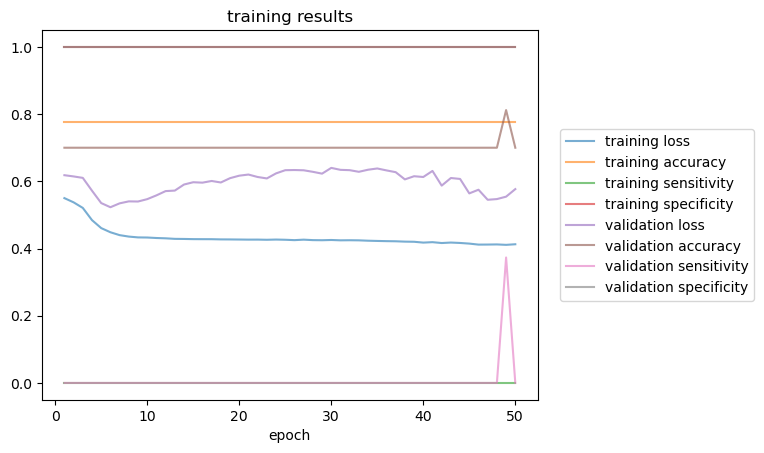

15 1.4906778224671577 3 5 bce
0.8492741584777832
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.4948, Training Accuracy: 0.7439, Training Sensitivity: 1.0000, Training Specificity: 0.4385, Validation Loss: 0.8697, Validation Accuracy: 0.6560, Validation Sensitivity: 0.7357, Validation Specificity: 0.3943
Epoch: 020, Training Loss: 0.3912, Training Accuracy: 0.7489, Training Sensitivity: 0.9635, Training Specificity: 0.4931, Validation Loss: 0.6527, Validation Accuracy: 0.7120, Validation Sensitivity: 0.7183, Validation Specificity: 0.6914
Epoch: 030, Training Loss: 0.3745, Training Accuracy: 0.7648, Training Sensitivity: 0.9635, Training Specificity: 0.5279, Validation Loss: 0.6535, Validation Accuracy: 0.7640, Validation Sensitivity: 0.7878, Validation Specificity: 0.6857
Epoch: 040, Training Loss: 0.3710, Training Accuracy: 0.7964, Training Sensitivity: 0.9409, Training 

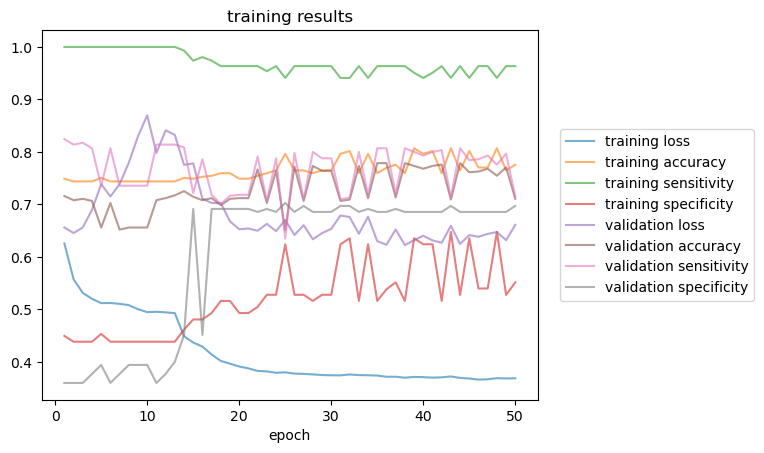

15 1.9813556449343155 3 5 bce
0.8808736801147461
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3490, Training Accuracy: 0.8291, Training Sensitivity: 0.9476, Training Specificity: 0.6874, Validation Loss: 0.6920, Validation Accuracy: 0.5480, Validation Sensitivity: 0.4508, Validation Specificity: 0.7962
Epoch: 020, Training Loss: 0.3219, Training Accuracy: 0.8555, Training Sensitivity: 0.9476, Training Specificity: 0.7453, Validation Loss: 0.7251, Validation Accuracy: 0.5560, Validation Sensitivity: 0.4620, Validation Specificity: 0.7962
Epoch: 030, Training Loss: 0.3131, Training Accuracy: 0.8263, Training Sensitivity: 0.9660, Training Specificity: 0.6593, Validation Loss: 0.7083, Validation Accuracy: 0.5773, Validation Sensitivity: 0.5065, Validation Specificity: 0.7583
Epoch: 040, Training Loss: 0.3115, Training Accuracy: 0.9151, Training Sensitivity: 0.9234, Training 

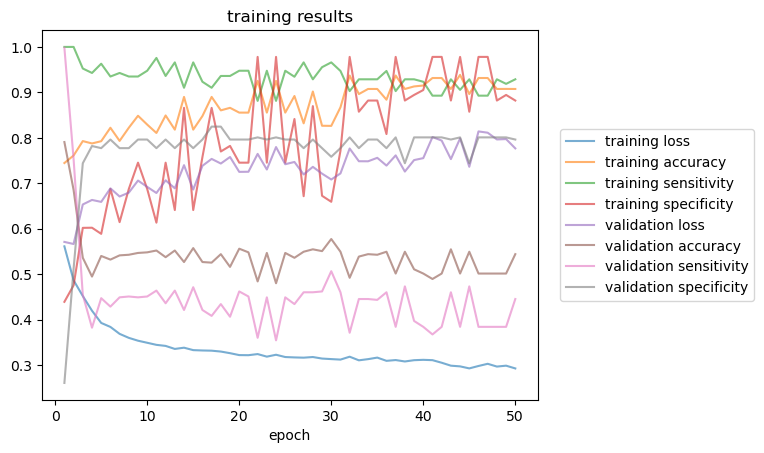

15 2.4720334674014737 3 5 bce
0.8445339202880859
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2671, Training Accuracy: 0.9504, Training Sensitivity: 0.9534, Training Specificity: 0.9468, Validation Loss: 0.4875, Validation Accuracy: 0.7867, Validation Sensitivity: 0.6933, Validation Specificity: 0.9617
Epoch: 020, Training Loss: 0.2506, Training Accuracy: 0.9321, Training Sensitivity: 0.9771, Training Specificity: 0.8792, Validation Loss: 0.4630, Validation Accuracy: 0.8280, Validation Sensitivity: 0.7669, Validation Specificity: 0.9425
Epoch: 030, Training Loss: 0.2462, Training Accuracy: 0.9483, Training Sensitivity: 0.9633, Training Specificity: 0.9306, Validation Loss: 0.4735, Validation Accuracy: 0.7920, Validation Sensitivity: 0.7014, Validation Specificity: 0.9617
Epoch: 040, Training Loss: 0.2450, Training Accuracy: 0.9361, Training Sensitivity: 0.9633, Training 

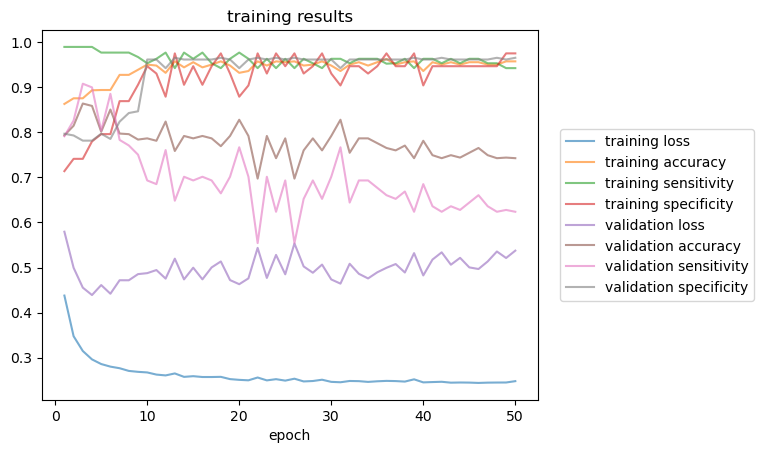

15 2.962711289868631 3 5 bce
1.205498218536377
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3275, Training Accuracy: 0.9111, Training Sensitivity: 0.9938, Training Specificity: 0.4006, Validation Loss: 0.5213, Validation Accuracy: 0.8240, Validation Sensitivity: 1.0000, Validation Specificity: 0.2747
Epoch: 020, Training Loss: 0.3246, Training Accuracy: 0.9111, Training Sensitivity: 0.9938, Training Specificity: 0.4006, Validation Loss: 0.5234, Validation Accuracy: 0.8240, Validation Sensitivity: 1.0000, Validation Specificity: 0.2747
Epoch: 030, Training Loss: 0.3264, Training Accuracy: 0.8681, Training Sensitivity: 1.0000, Training Specificity: 0.0545, Validation Loss: 0.5286, Validation Accuracy: 0.8240, Validation Sensitivity: 1.0000, Validation Specificity: 0.2747
Epoch: 040, Training Loss: 0.3246, Training Accuracy: 0.9060, Training Sensitivity: 0.9938, Training Sp

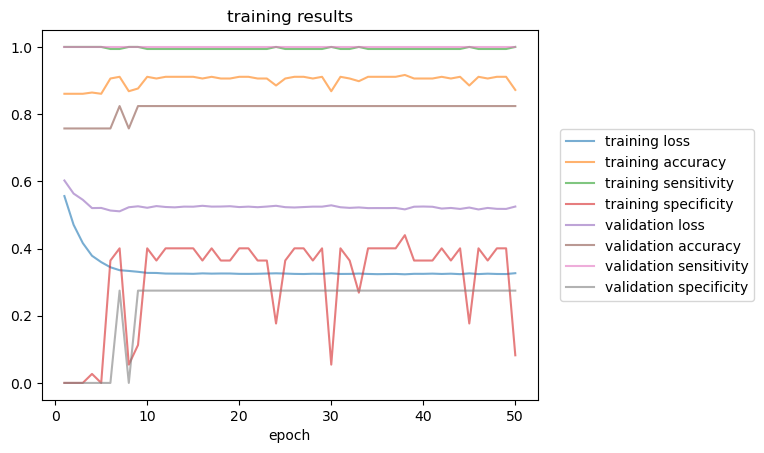

15 3.453389112335789 3 5 bce
1.3408186435699463
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2954, Training Accuracy: 0.9117, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4235, Validation Accuracy: 0.8573, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.2912, Training Accuracy: 0.9117, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4640, Validation Accuracy: 0.8573, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.2787, Training Accuracy: 0.9117, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.6401, Validation Accuracy: 0.8573, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.2621, Training Accuracy: 0.9117, Training Sensitivity: 1.0000, Training S

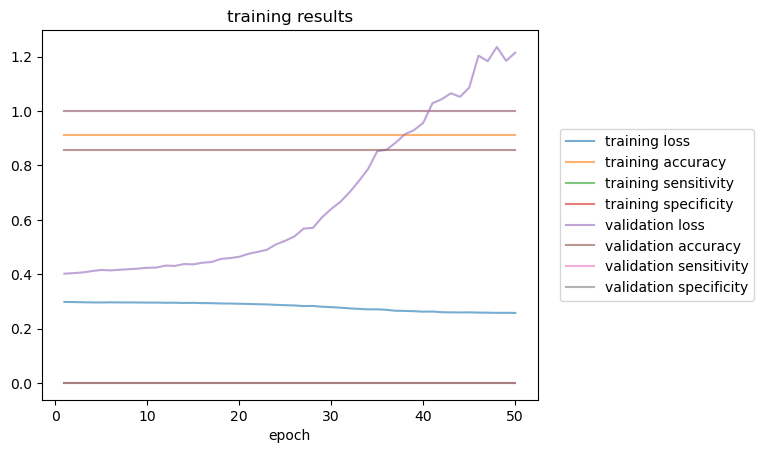

15 3.944066934802947 3 5 bce
1.315551996231079
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2531, Training Accuracy: 0.9375, Training Sensitivity: 0.9946, Training Specificity: 0.6892, Validation Loss: 0.3260, Validation Accuracy: 0.8840, Validation Sensitivity: 1.0000, Validation Specificity: 0.3916
Epoch: 020, Training Loss: 0.2524, Training Accuracy: 0.9375, Training Sensitivity: 0.9946, Training Specificity: 0.6892, Validation Loss: 0.3415, Validation Accuracy: 0.8840, Validation Sensitivity: 1.0000, Validation Specificity: 0.3916
Epoch: 030, Training Loss: 0.2516, Training Accuracy: 0.9335, Training Sensitivity: 0.9946, Training Specificity: 0.6679, Validation Loss: 0.3439, Validation Accuracy: 0.8840, Validation Sensitivity: 1.0000, Validation Specificity: 0.3916
Epoch: 040, Training Loss: 0.2525, Training Accuracy: 0.9375, Training Sensitivity: 0.9946, Training Sp

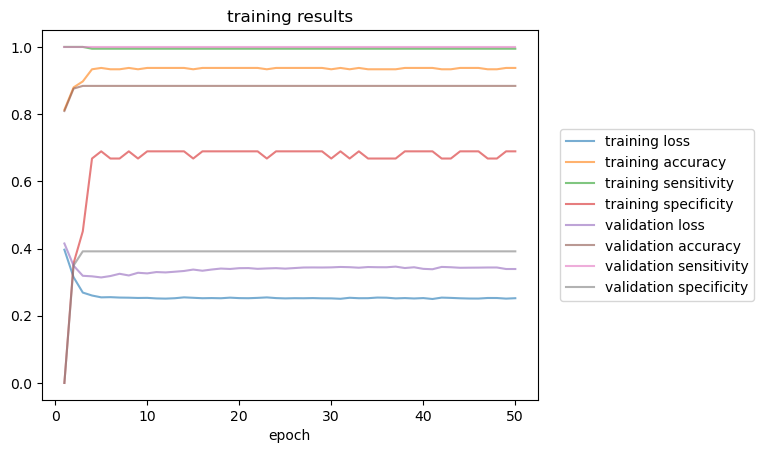

15 4.434744757270105 3 5 bce
1.336571455001831
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3391, Training Accuracy: 0.8619, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4679, Validation Accuracy: 0.8080, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3327, Training Accuracy: 0.8619, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4980, Validation Accuracy: 0.8080, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3300, Training Accuracy: 0.8619, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.5008, Validation Accuracy: 0.8080, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3291, Training Accuracy: 0.8619, Training Sensitivity: 1.0000, Training Sp

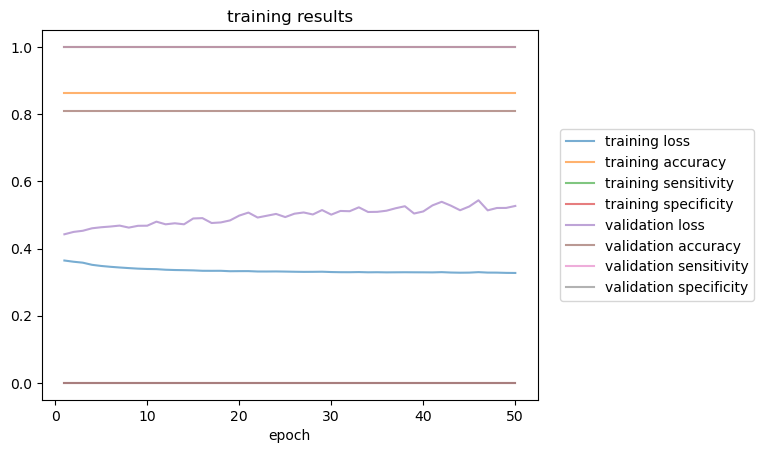

15 4.925422579737262 3 5 bce
1.5066161155700684
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2979, Training Accuracy: 0.9089, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4927, Validation Accuracy: 0.8133, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.2987, Training Accuracy: 0.9089, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.5214, Validation Accuracy: 0.8133, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.2968, Training Accuracy: 0.9089, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.5690, Validation Accuracy: 0.8133, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.2945, Training Accuracy: 0.9089, Training Sensitivity: 1.0000, Training S

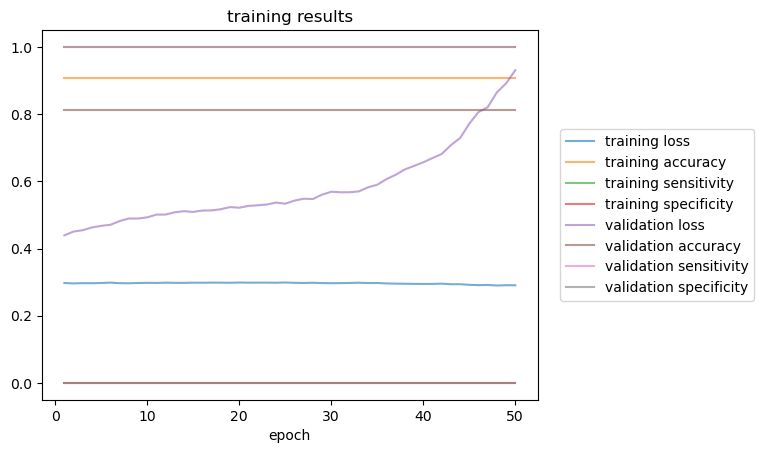

15 5.41610040220442 3 5 bce
1.682035207748413
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.4028, Training Accuracy: 0.8612, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3153, Validation Accuracy: 0.9093, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.4028, Training Accuracy: 0.8612, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3149, Validation Accuracy: 0.9093, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.4028, Training Accuracy: 0.8612, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3149, Validation Accuracy: 0.9093, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.4011, Training Accuracy: 0.8612, Training Sensitivity: 1.0000, Training Spe

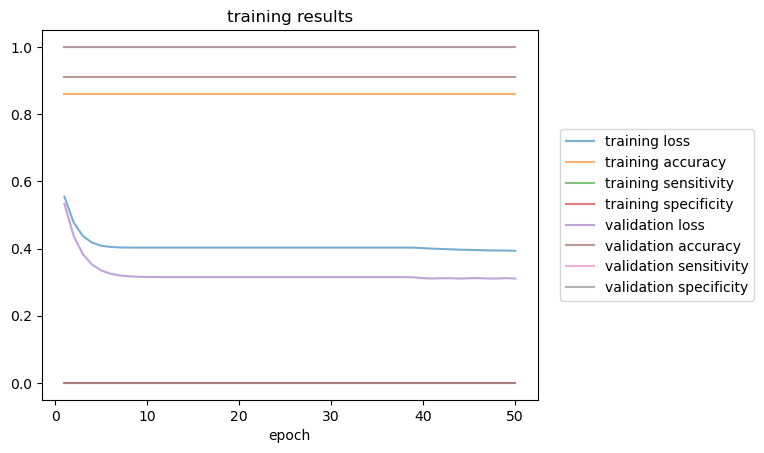

20 1.0 3 5 bce
1.0513057708740234
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.1264, Training Accuracy: 0.9500, Training Sensitivity: 0.5000, Training Specificity: 1.0000, Validation Loss: 1.2108, Validation Accuracy: 0.8750, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.1251, Training Accuracy: 0.9500, Training Sensitivity: 0.5000, Training Specificity: 1.0000, Validation Loss: 1.4015, Validation Accuracy: 0.8750, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.1214, Training Accuracy: 0.9500, Training Sensitivity: 0.5000, Training Specificity: 1.0000, Validation Loss: 1.4048, Validation Accuracy: 0.8750, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.1219, Training Accuracy: 0.9500, Training Sensitivity: 0.5000, Training Specificity: 1.

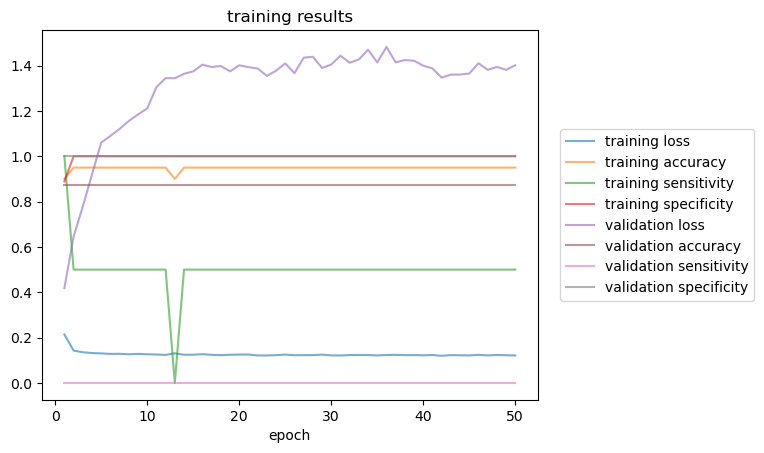

20 1.5546071719008867 3 5 bce
1.1951448917388916
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.1489, Training Accuracy: 0.9400, Training Sensitivity: 0.9110, Training Specificity: 0.9567, Validation Loss: 0.8682, Validation Accuracy: 0.5940, Validation Sensitivity: 0.3178, Validation Specificity: 0.6793
Epoch: 020, Training Loss: 0.1388, Training Accuracy: 0.9501, Training Sensitivity: 0.8740, Training Specificity: 0.9939, Validation Loss: 0.8446, Validation Accuracy: 0.6190, Validation Sensitivity: 0.3644, Validation Specificity: 0.6976
Epoch: 030, Training Loss: 0.1307, Training Accuracy: 0.9554, Training Sensitivity: 0.9263, Training Specificity: 0.9721, Validation Loss: 0.8678, Validation Accuracy: 0.6190, Validation Sensitivity: 0.3644, Validation Specificity: 0.6976
Epoch: 040, Training Loss: 0.1353, Training Accuracy: 0.9491, Training Sensitivity: 0.8705, Training 

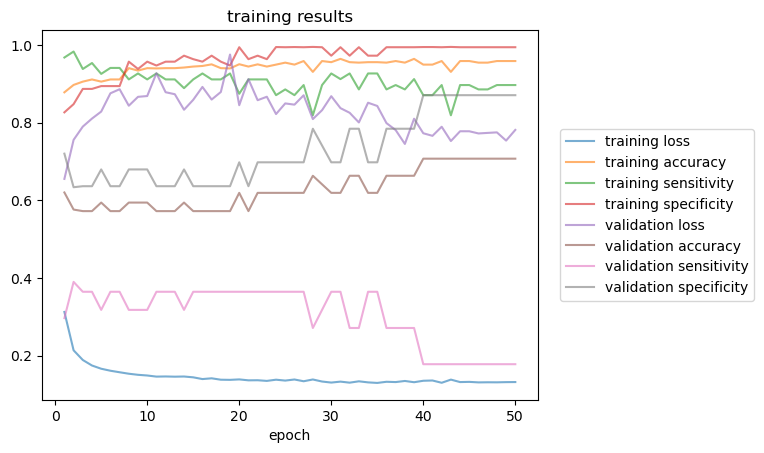

20 2.1092143438017734 3 5 bce
1.674830675125122
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2906, Training Accuracy: 0.9274, Training Sensitivity: 0.9883, Training Specificity: 0.7993, Validation Loss: 0.5781, Validation Accuracy: 0.7390, Validation Sensitivity: 0.8444, Validation Specificity: 0.6276
Epoch: 020, Training Loss: 0.2741, Training Accuracy: 0.9355, Training Sensitivity: 0.9883, Training Specificity: 0.8244, Validation Loss: 0.6375, Validation Accuracy: 0.7400, Validation Sensitivity: 0.8463, Validation Specificity: 0.6276
Epoch: 030, Training Loss: 0.2649, Training Accuracy: 0.9528, Training Sensitivity: 0.9841, Training Specificity: 0.8871, Validation Loss: 0.6443, Validation Accuracy: 0.7510, Validation Sensitivity: 0.8696, Validation Specificity: 0.6255
Epoch: 040, Training Loss: 0.2590, Training Accuracy: 0.9561, Training Sensitivity: 0.9841, Training S

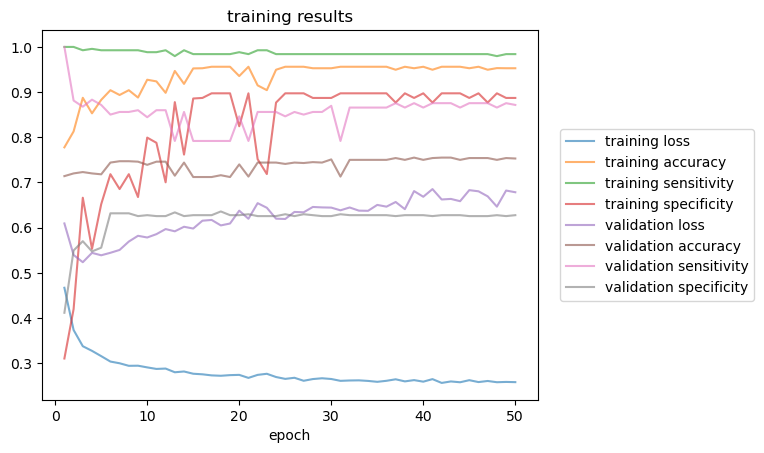

20 2.6638215157026606 3 5 bce
2.1118204593658447
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3176, Training Accuracy: 0.8811, Training Sensitivity: 1.0000, Training Specificity: 0.1283, Validation Loss: 0.5756, Validation Accuracy: 0.7530, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3140, Training Accuracy: 0.9083, Training Sensitivity: 0.9979, Training Specificity: 0.3409, Validation Loss: 0.6207, Validation Accuracy: 0.7530, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3114, Training Accuracy: 0.9083, Training Sensitivity: 0.9979, Training Specificity: 0.3409, Validation Loss: 0.6646, Validation Accuracy: 0.7530, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3098, Training Accuracy: 0.9083, Training Sensitivity: 0.9979, Training 

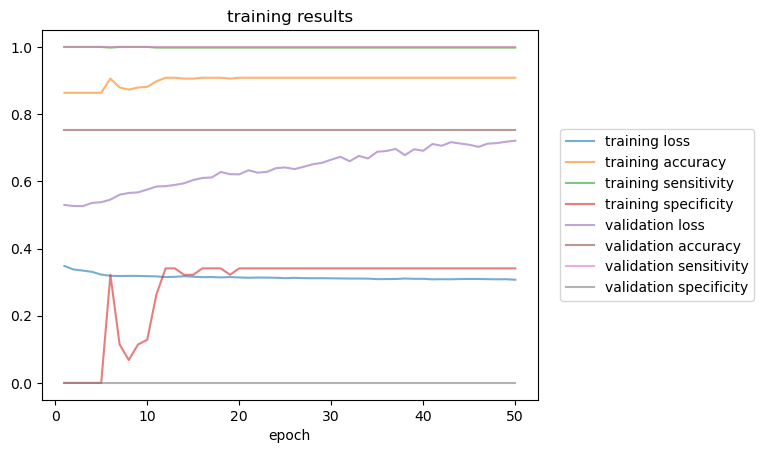

20 3.2184286876035473 3 5 bce
2.3020379543304443
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3401, Training Accuracy: 0.8686, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.5471, Validation Accuracy: 0.7450, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3389, Training Accuracy: 0.8686, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.5625, Validation Accuracy: 0.7450, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3380, Training Accuracy: 0.8686, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.5799, Validation Accuracy: 0.7450, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3363, Training Accuracy: 0.8686, Training Sensitivity: 1.0000, Training 

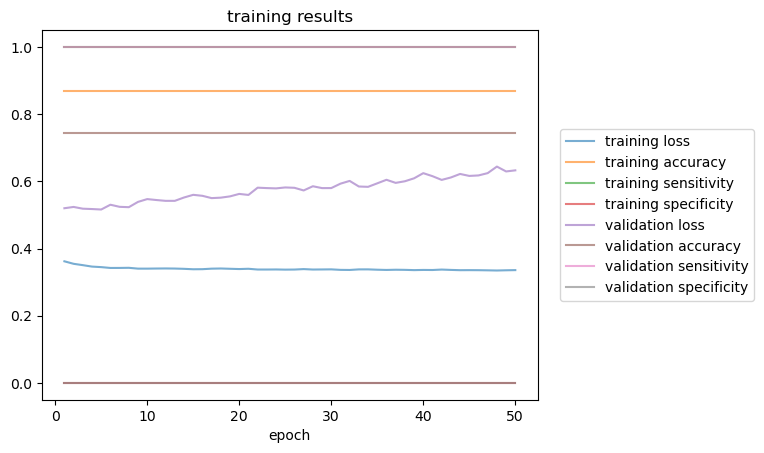

20 3.773035859504434 3 5 bce
2.4261112213134766
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3466, Training Accuracy: 0.8633, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3741, Validation Accuracy: 0.8670, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3378, Training Accuracy: 0.8731, Training Sensitivity: 1.0000, Training Specificity: 0.0717, Validation Loss: 0.3757, Validation Accuracy: 0.8670, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3365, Training Accuracy: 0.8650, Training Sensitivity: 1.0000, Training Specificity: 0.0124, Validation Loss: 0.3785, Validation Accuracy: 0.8670, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3354, Training Accuracy: 0.8942, Training Sensitivity: 0.9965, Training S

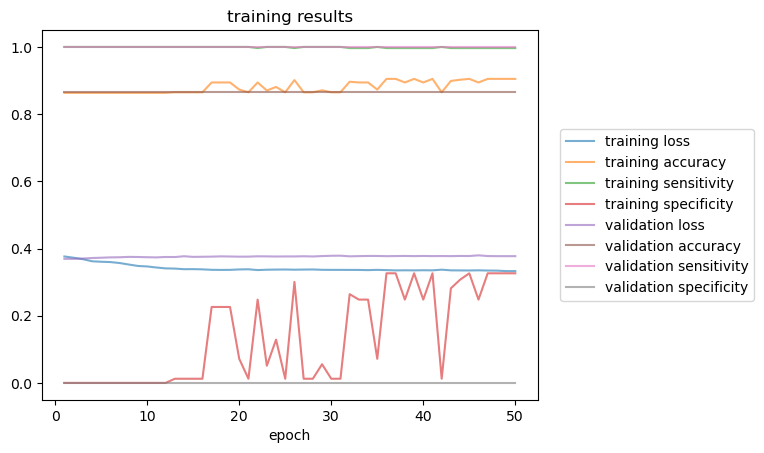

20 4.327643031405321 3 5 bce
2.525458812713623
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2782, Training Accuracy: 0.9182, Training Sensitivity: 1.0000, Training Specificity: 0.3794, Validation Loss: 0.3433, Validation Accuracy: 0.8760, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.2764, Training Accuracy: 0.9182, Training Sensitivity: 1.0000, Training Specificity: 0.3794, Validation Loss: 0.3418, Validation Accuracy: 0.8760, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.2760, Training Accuracy: 0.9182, Training Sensitivity: 1.0000, Training Specificity: 0.3794, Validation Loss: 0.3430, Validation Accuracy: 0.8760, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.2748, Training Accuracy: 0.9182, Training Sensitivity: 1.0000, Training Sp

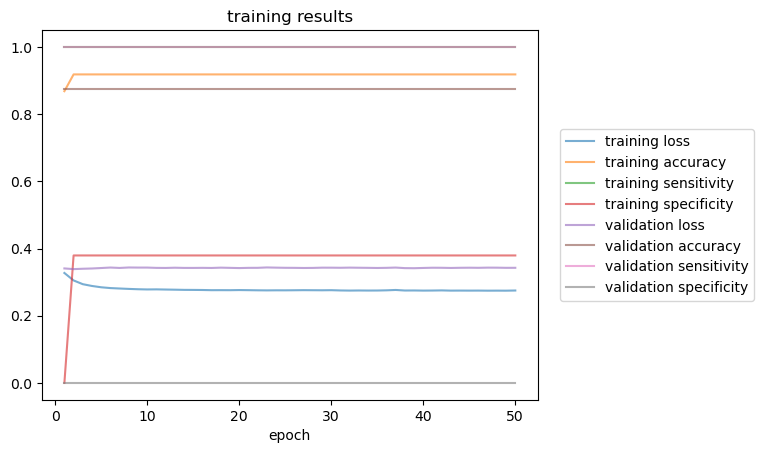

20 4.882250203306208 3 5 bce
2.510122060775757
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3180, Training Accuracy: 0.9000, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.5831, Validation Accuracy: 0.7480, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3176, Training Accuracy: 0.9000, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.6177, Validation Accuracy: 0.7480, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3153, Training Accuracy: 0.9000, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.6411, Validation Accuracy: 0.7480, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3089, Training Accuracy: 0.9000, Training Sensitivity: 1.0000, Training Sp

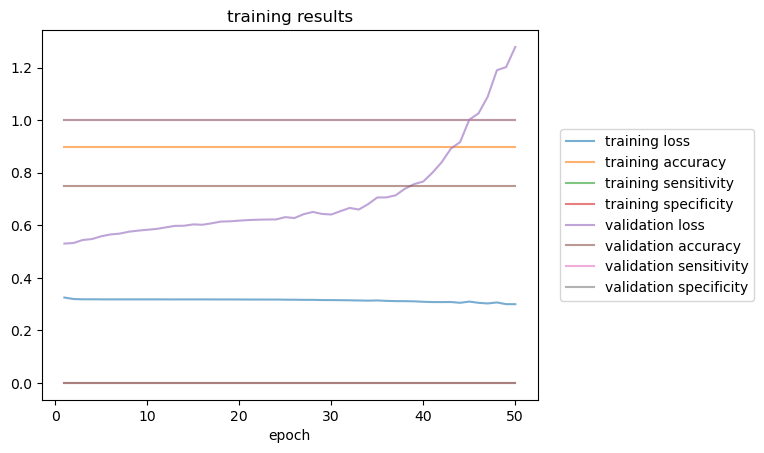

20 5.436857375207095 3 5 bce
3.4426674842834473
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3019, Training Accuracy: 0.9066, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.2835, Validation Accuracy: 0.9170, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3030, Training Accuracy: 0.9066, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.2841, Validation Accuracy: 0.9170, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3033, Training Accuracy: 0.9066, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.2847, Validation Accuracy: 0.9170, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3032, Training Accuracy: 0.9066, Training Sensitivity: 1.0000, Training S

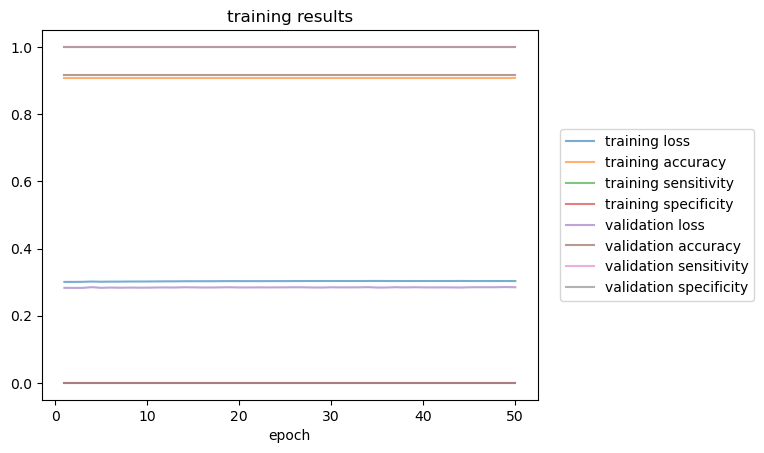

20 5.991464547107982 3 5 bce
3.228618860244751
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3248, Training Accuracy: 0.9114, Training Sensitivity: 0.9969, Training Specificity: 0.3473, Validation Loss: 0.3244, Validation Accuracy: 0.9000, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3169, Training Accuracy: 0.9114, Training Sensitivity: 0.9969, Training Specificity: 0.3473, Validation Loss: 0.3199, Validation Accuracy: 0.9000, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3152, Training Accuracy: 0.9114, Training Sensitivity: 0.9969, Training Specificity: 0.3473, Validation Loss: 0.3198, Validation Accuracy: 0.9000, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3168, Training Accuracy: 0.9114, Training Sensitivity: 0.9969, Training Sp

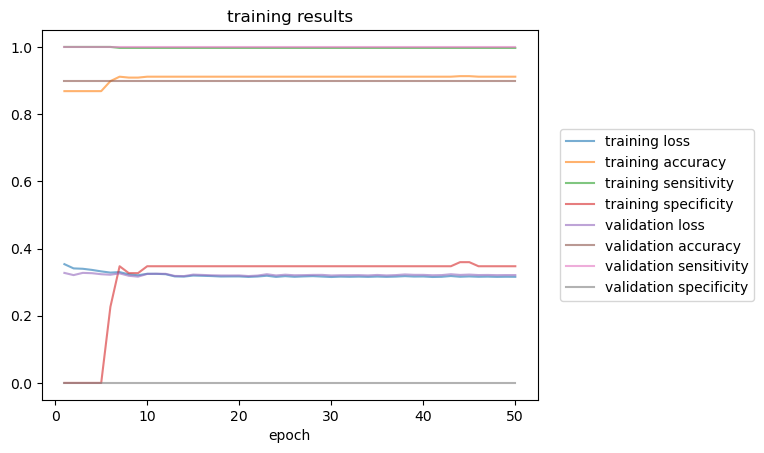

25 1.0 3 5 bce
1.9781510829925537
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.1650, Training Accuracy: 0.8988, Training Sensitivity: 1.0000, Training Specificity: 0.8825, Validation Loss: 4.0843, Validation Accuracy: 0.5864, Validation Sensitivity: 0.1608, Validation Specificity: 0.8562
Epoch: 020, Training Loss: 0.1650, Training Accuracy: 0.8988, Training Sensitivity: 1.0000, Training Specificity: 0.8825, Validation Loss: 7.4842, Validation Accuracy: 0.5864, Validation Sensitivity: 0.1608, Validation Specificity: 0.8562
Epoch: 030, Training Loss: 0.1647, Training Accuracy: 0.8988, Training Sensitivity: 1.0000, Training Specificity: 0.8825, Validation Loss: 4.0599, Validation Accuracy: 0.5864, Validation Sensitivity: 0.1608, Validation Specificity: 0.8562
Epoch: 040, Training Loss: 0.1650, Training Accuracy: 0.8988, Training Sensitivity: 1.0000, Training Specificity: 0.

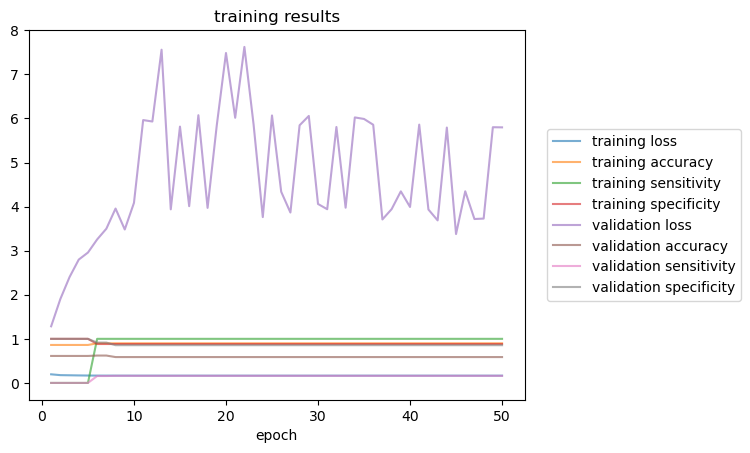

25 1.6041946277484889 3 5 bce
2.0447442531585693
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2248, Training Accuracy: 0.9582, Training Sensitivity: 0.9570, Training Specificity: 0.9594, Validation Loss: 0.3646, Validation Accuracy: 0.8536, Validation Sensitivity: 0.7473, Validation Specificity: 0.9415
Epoch: 020, Training Loss: 0.1999, Training Accuracy: 0.9622, Training Sensitivity: 0.9531, Training Specificity: 0.9722, Validation Loss: 0.3448, Validation Accuracy: 0.8536, Validation Sensitivity: 0.7544, Validation Specificity: 0.9357
Epoch: 030, Training Loss: 0.1981, Training Accuracy: 0.9626, Training Sensitivity: 0.9570, Training Specificity: 0.9686, Validation Loss: 0.3147, Validation Accuracy: 0.8632, Validation Sensitivity: 0.7756, Validation Specificity: 0.9357
Epoch: 040, Training Loss: 0.1934, Training Accuracy: 0.9622, Training Sensitivity: 0.9531, Training 

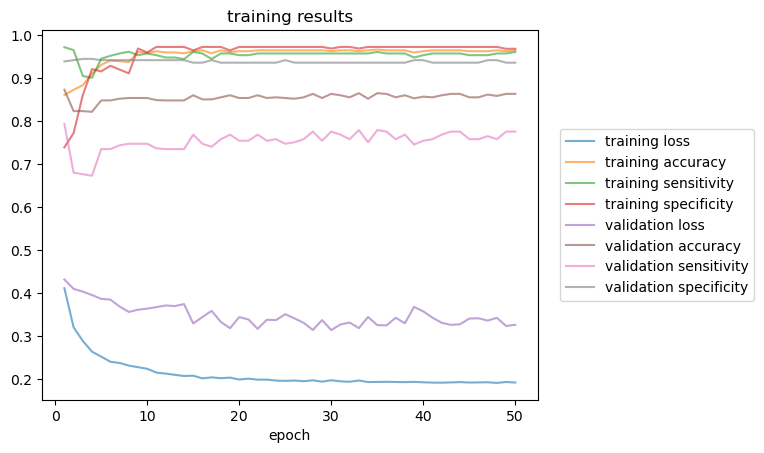

25 2.2083892554969777 3 5 bce
2.6028175354003906
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3683, Training Accuracy: 0.8606, Training Sensitivity: 0.9349, Training Specificity: 0.6675, Validation Loss: 0.7845, Validation Accuracy: 0.4752, Validation Sensitivity: 0.2403, Validation Specificity: 0.7985
Epoch: 020, Training Loss: 0.3600, Training Accuracy: 0.9051, Training Sensitivity: 0.9351, Training Specificity: 0.8271, Validation Loss: 0.8271, Validation Accuracy: 0.5296, Validation Sensitivity: 0.2251, Validation Specificity: 0.9487
Epoch: 030, Training Loss: 0.3522, Training Accuracy: 0.9065, Training Sensitivity: 0.9370, Training Specificity: 0.8271, Validation Loss: 0.8544, Validation Accuracy: 0.5048, Validation Sensitivity: 0.1754, Validation Specificity: 0.9582
Epoch: 040, Training Loss: 0.3511, Training Accuracy: 0.9085, Training Sensitivity: 0.9379, Training 

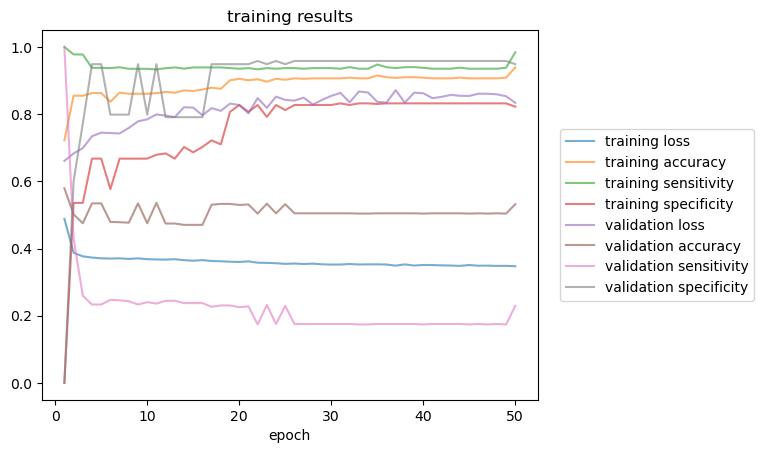

25 2.812583883245467 3 5 bce
2.744222640991211
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2777, Training Accuracy: 0.9415, Training Sensitivity: 0.9859, Training Specificity: 0.8254, Validation Loss: 0.4556, Validation Accuracy: 0.8016, Validation Sensitivity: 0.8904, Validation Specificity: 0.5216
Epoch: 020, Training Loss: 0.2693, Training Accuracy: 0.9437, Training Sensitivity: 0.9811, Training Specificity: 0.8457, Validation Loss: 0.4617, Validation Accuracy: 0.8048, Validation Sensitivity: 0.8946, Validation Specificity: 0.5216
Epoch: 030, Training Loss: 0.2635, Training Accuracy: 0.9470, Training Sensitivity: 0.9859, Training Specificity: 0.8454, Validation Loss: 0.4548, Validation Accuracy: 0.8088, Validation Sensitivity: 0.8999, Validation Specificity: 0.5216
Epoch: 040, Training Loss: 0.2618, Training Accuracy: 0.9475, Training Sensitivity: 0.9865, Training Sp

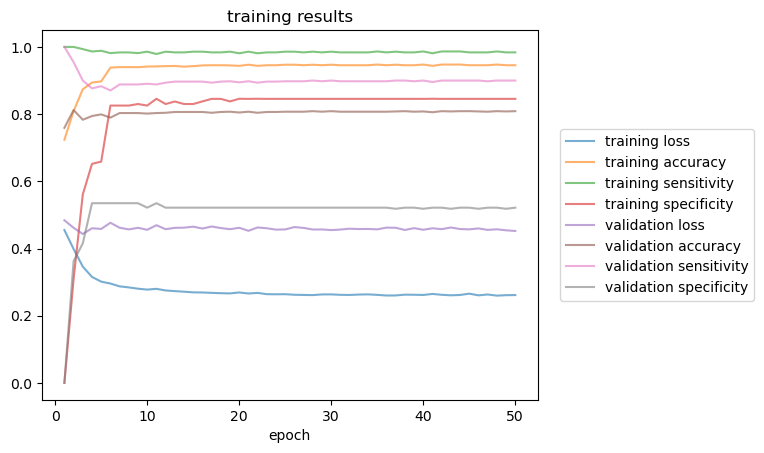

25 3.416778510993956 3 5 bce
4.070100545883179
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3308, Training Accuracy: 0.8726, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4875, Validation Accuracy: 0.7856, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3246, Training Accuracy: 0.8726, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4902, Validation Accuracy: 0.7856, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3221, Training Accuracy: 0.8726, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.5081, Validation Accuracy: 0.7856, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3206, Training Accuracy: 0.8726, Training Sensitivity: 1.0000, Training Sp

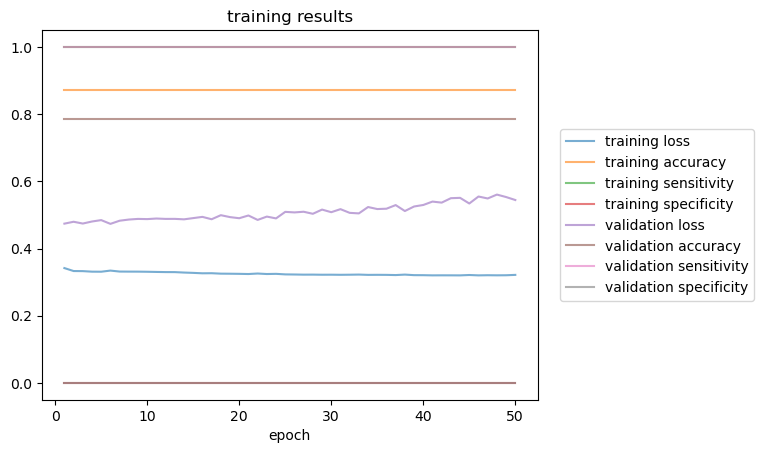

25 4.020973138742445 3 5 bce
3.9647843837738037
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3288, Training Accuracy: 0.8824, Training Sensitivity: 1.0000, Training Specificity: 0.2538, Validation Loss: 0.3076, Validation Accuracy: 0.9080, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3186, Training Accuracy: 0.8860, Training Sensitivity: 1.0000, Training Specificity: 0.2766, Validation Loss: 0.3087, Validation Accuracy: 0.9080, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3163, Training Accuracy: 0.9146, Training Sensitivity: 0.9983, Training Specificity: 0.4675, Validation Loss: 0.3175, Validation Accuracy: 0.9080, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3159, Training Accuracy: 0.9003, Training Sensitivity: 1.0000, Training S

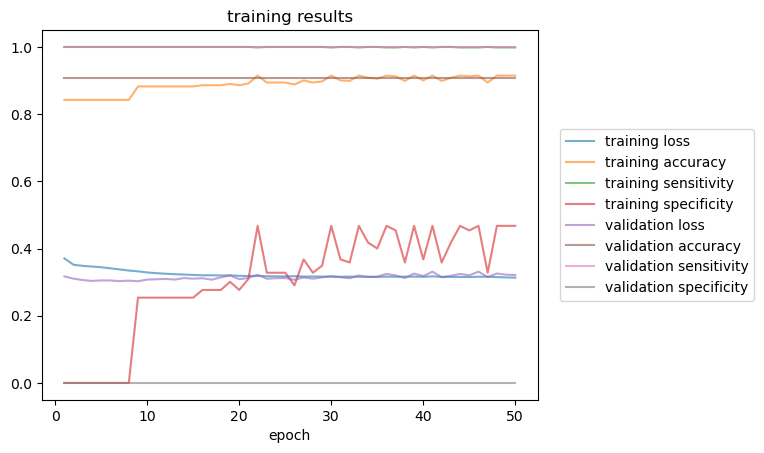

25 4.625167766490934 3 5 bce
4.46178412437439
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3375, Training Accuracy: 0.8426, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3418, Validation Accuracy: 0.8960, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3263, Training Accuracy: 0.8942, Training Sensitivity: 0.9980, Training Specificity: 0.3381, Validation Loss: 0.3383, Validation Accuracy: 0.8960, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3249, Training Accuracy: 0.9092, Training Sensitivity: 0.9959, Training Specificity: 0.4448, Validation Loss: 0.3391, Validation Accuracy: 0.8960, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3231, Training Accuracy: 0.9127, Training Sensitivity: 0.9959, Training Spe

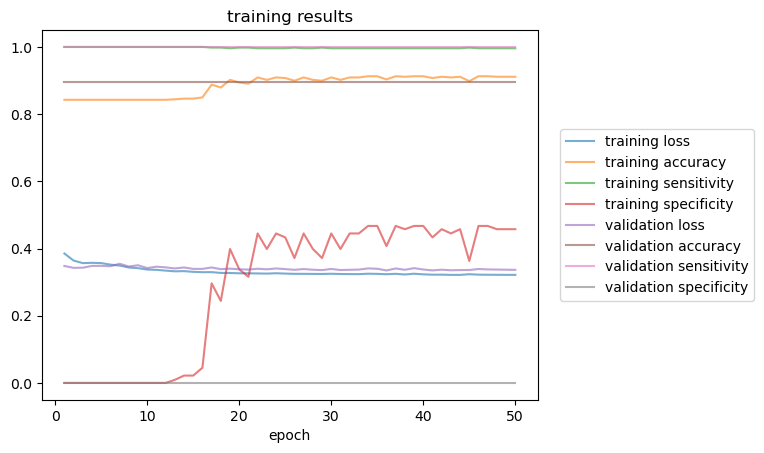

25 5.2293623942394225 3 5 bce
5.657050609588623
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3261, Training Accuracy: 0.8977, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3422, Validation Accuracy: 0.8896, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3268, Training Accuracy: 0.8977, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3426, Validation Accuracy: 0.8896, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3268, Training Accuracy: 0.8977, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3423, Validation Accuracy: 0.8896, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3264, Training Accuracy: 0.8977, Training Sensitivity: 1.0000, Training S

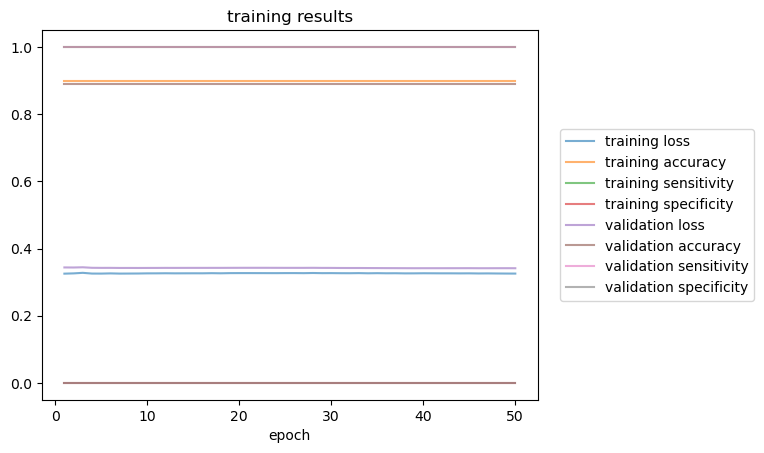

25 5.833557021987912 3 5 bce
5.05562949180603
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2961, Training Accuracy: 0.9098, Training Sensitivity: 1.0000, Training Specificity: 0.3073, Validation Loss: 0.3317, Validation Accuracy: 0.8936, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.2953, Training Accuracy: 0.9098, Training Sensitivity: 1.0000, Training Specificity: 0.3073, Validation Loss: 0.3325, Validation Accuracy: 0.8936, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.2963, Training Accuracy: 0.9098, Training Sensitivity: 1.0000, Training Specificity: 0.3073, Validation Loss: 0.3345, Validation Accuracy: 0.8936, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.2945, Training Accuracy: 0.9098, Training Sensitivity: 1.0000, Training Spe

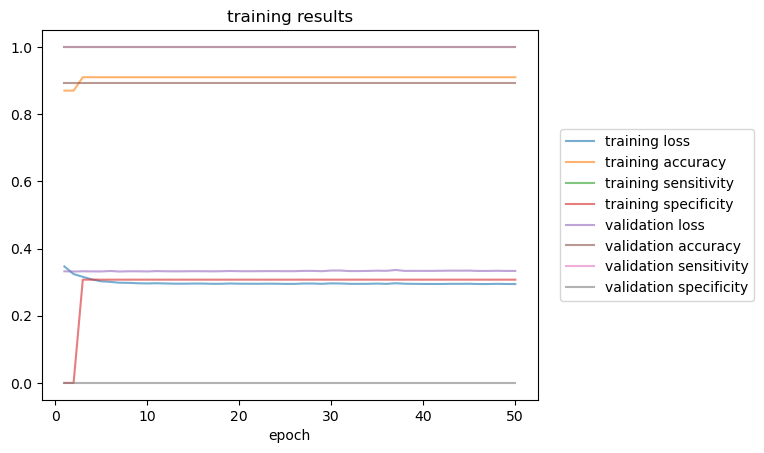

25 6.437751649736401 3 5 bce
5.592200517654419
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3231, Training Accuracy: 0.8986, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3241, Validation Accuracy: 0.8984, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3239, Training Accuracy: 0.8986, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3248, Validation Accuracy: 0.8984, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3247, Training Accuracy: 0.8986, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3259, Validation Accuracy: 0.8984, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3236, Training Accuracy: 0.8986, Training Sensitivity: 1.0000, Training Sp

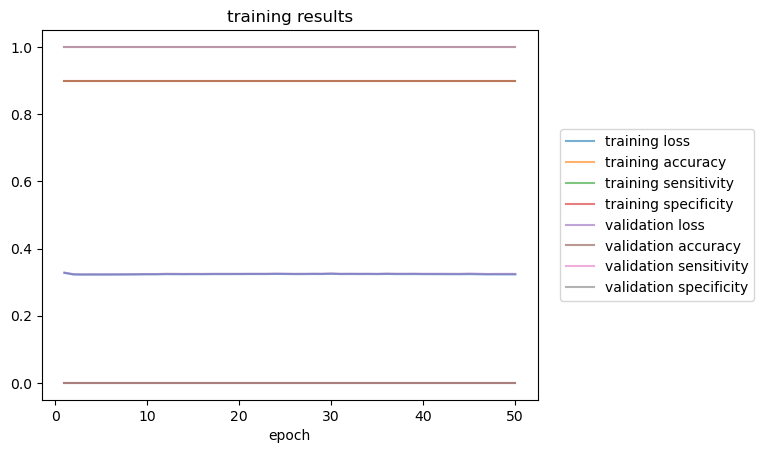

30 1.0 3 5 bce
2.8203341960906982
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.4129, Training Accuracy: 0.7626, Training Sensitivity: 0.9794, Training Specificity: 0.6492, Validation Loss: 0.8229, Validation Accuracy: 0.7827, Validation Sensitivity: 0.2081, Validation Specificity: 0.8819
Epoch: 020, Training Loss: 0.4114, Training Accuracy: 0.7626, Training Sensitivity: 0.9794, Training Specificity: 0.6492, Validation Loss: 1.0605, Validation Accuracy: 0.7400, Validation Sensitivity: 0.2715, Validation Specificity: 0.8210
Epoch: 030, Training Loss: 0.4108, Training Accuracy: 0.7626, Training Sensitivity: 0.9794, Training Specificity: 0.6492, Validation Loss: 1.1042, Validation Accuracy: 0.7827, Validation Sensitivity: 0.2081, Validation Specificity: 0.8819
Epoch: 040, Training Loss: 0.3729, Training Accuracy: 0.7754, Training Sensitivity: 0.9742, Training Specificity: 0.

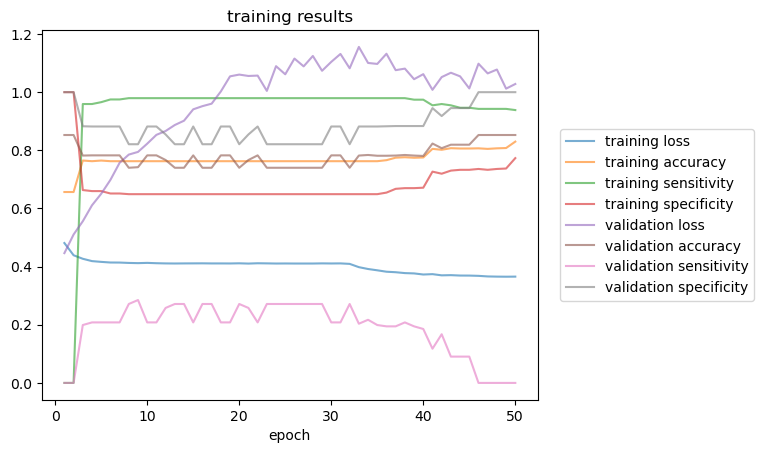

30 1.6447105292582567 3 5 bce
2.900268077850342
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.4714, Training Accuracy: 0.8396, Training Sensitivity: 0.8286, Training Specificity: 0.8467, Validation Loss: 0.7645, Validation Accuracy: 0.5833, Validation Sensitivity: 0.1125, Validation Specificity: 0.9975
Epoch: 020, Training Loss: 0.4518, Training Accuracy: 0.8423, Training Sensitivity: 0.8385, Training Specificity: 0.8447, Validation Loss: 0.7672, Validation Accuracy: 0.5620, Validation Sensitivity: 0.1909, Validation Specificity: 0.8885
Epoch: 030, Training Loss: 0.4421, Training Accuracy: 0.8381, Training Sensitivity: 0.8278, Training Specificity: 0.8447, Validation Loss: 0.7827, Validation Accuracy: 0.5620, Validation Sensitivity: 0.1909, Validation Specificity: 0.8885
Epoch: 040, Training Loss: 0.4384, Training Accuracy: 0.8369, Training Sensitivity: 0.8249, Training S

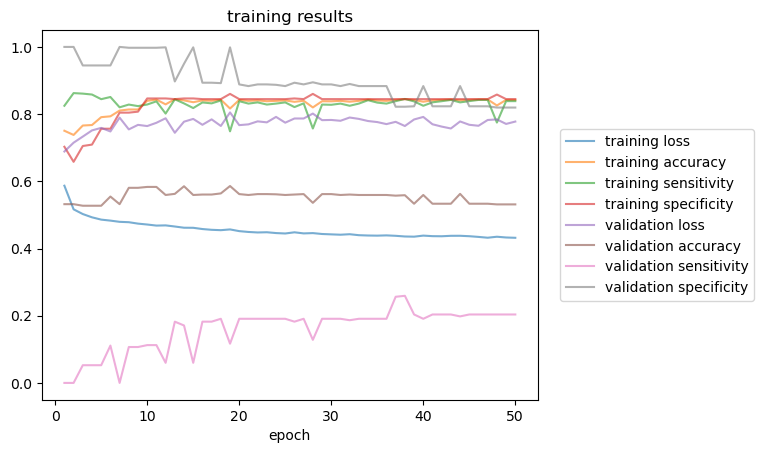

30 2.2894210585165133 3 5 bce
3.98897647857666
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3265, Training Accuracy: 0.9051, Training Sensitivity: 0.9666, Training Specificity: 0.7638, Validation Loss: 0.4040, Validation Accuracy: 0.8887, Validation Sensitivity: 0.9904, Validation Specificity: 0.6549
Epoch: 020, Training Loss: 0.3084, Training Accuracy: 0.9436, Training Sensitivity: 0.9820, Training Specificity: 0.8554, Validation Loss: 0.4090, Validation Accuracy: 0.8587, Validation Sensitivity: 0.9923, Validation Specificity: 0.5516
Epoch: 030, Training Loss: 0.3103, Training Accuracy: 0.9297, Training Sensitivity: 0.9613, Training Specificity: 0.8570, Validation Loss: 0.4132, Validation Accuracy: 0.8600, Validation Sensitivity: 0.9914, Validation Specificity: 0.5582
Epoch: 040, Training Loss: 0.2972, Training Accuracy: 0.9445, Training Sensitivity: 0.9833, Training Sp

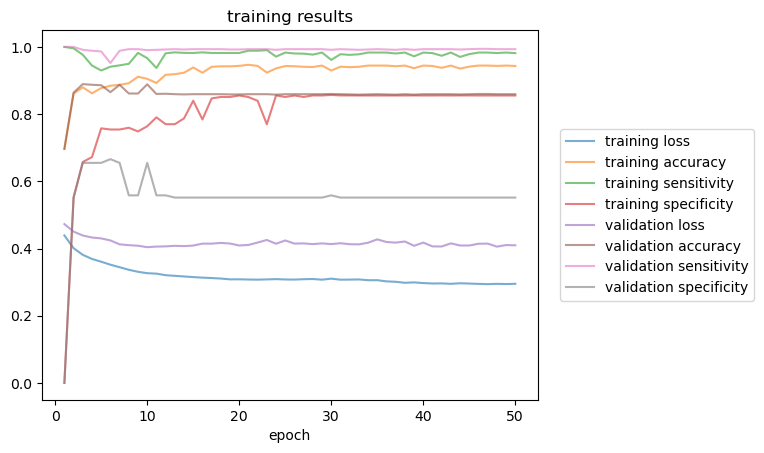

30 2.9341315877747705 3 5 bce
4.443629503250122
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3135, Training Accuracy: 0.9081, Training Sensitivity: 0.9966, Training Specificity: 0.6017, Validation Loss: 0.3268, Validation Accuracy: 0.8907, Validation Sensitivity: 0.9991, Validation Specificity: 0.5583
Epoch: 020, Training Loss: 0.3038, Training Accuracy: 0.9321, Training Sensitivity: 0.9947, Training Specificity: 0.7154, Validation Loss: 0.3251, Validation Accuracy: 0.8873, Validation Sensitivity: 0.9894, Validation Specificity: 0.5745
Epoch: 030, Training Loss: 0.3041, Training Accuracy: 0.9321, Training Sensitivity: 0.9947, Training Specificity: 0.7154, Validation Loss: 0.3225, Validation Accuracy: 0.8940, Validation Sensitivity: 0.9929, Validation Specificity: 0.5908
Epoch: 040, Training Loss: 0.3019, Training Accuracy: 0.9312, Training Sensitivity: 0.9947, Training S

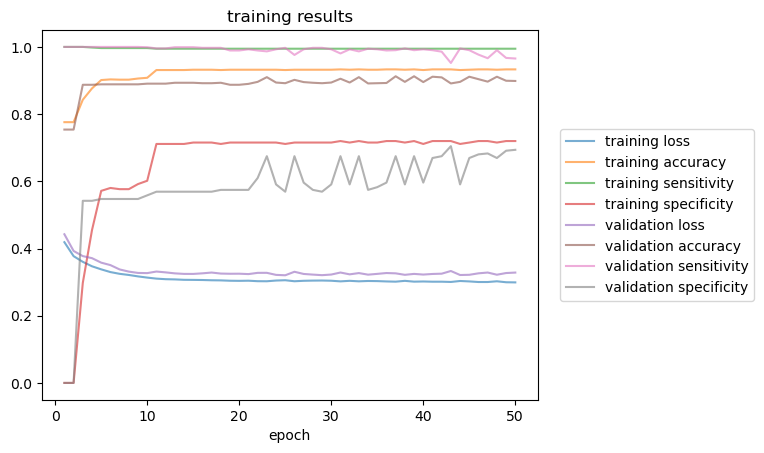

30 3.578842117033027 3 5 bce
6.123720407485962
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3375, Training Accuracy: 0.8742, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4087, Validation Accuracy: 0.8460, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3322, Training Accuracy: 0.8742, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4151, Validation Accuracy: 0.8460, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3303, Training Accuracy: 0.8751, Training Sensitivity: 1.0000, Training Specificity: 0.0074, Validation Loss: 0.4247, Validation Accuracy: 0.8460, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3291, Training Accuracy: 0.8776, Training Sensitivity: 1.0000, Training Sp

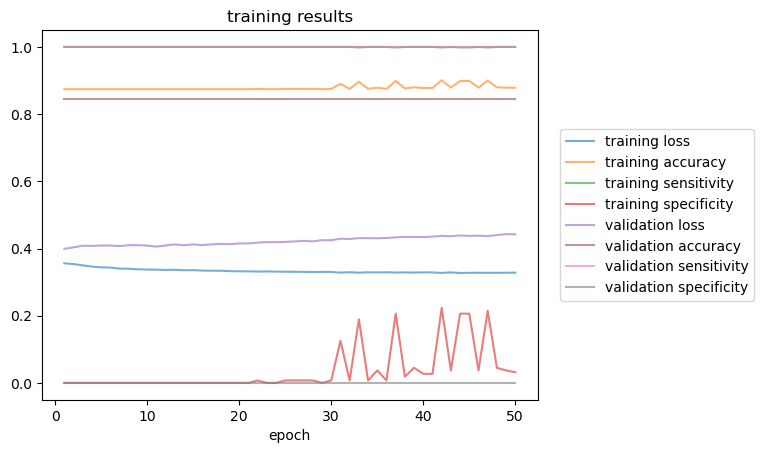

30 4.223552646291283 3 5 bce
5.741016387939453
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2671, Training Accuracy: 0.9269, Training Sensitivity: 0.9983, Training Specificity: 0.6459, Validation Loss: 0.3457, Validation Accuracy: 0.8887, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.2666, Training Accuracy: 0.9269, Training Sensitivity: 0.9983, Training Specificity: 0.6459, Validation Loss: 0.3459, Validation Accuracy: 0.8887, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.2651, Training Accuracy: 0.9281, Training Sensitivity: 0.9983, Training Specificity: 0.6515, Validation Loss: 0.3458, Validation Accuracy: 0.8887, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.2660, Training Accuracy: 0.9269, Training Sensitivity: 0.9983, Training Sp

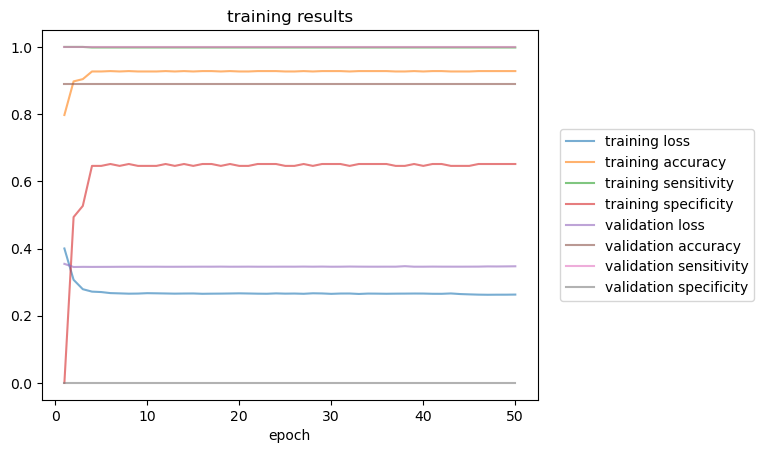

30 4.868263175549541 3 5 bce
7.039422512054443
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3477, Training Accuracy: 0.8741, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3455, Validation Accuracy: 0.8907, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3421, Training Accuracy: 0.8741, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3447, Validation Accuracy: 0.8907, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3378, Training Accuracy: 0.8741, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3446, Validation Accuracy: 0.8907, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3319, Training Accuracy: 0.8741, Training Sensitivity: 1.0000, Training Sp

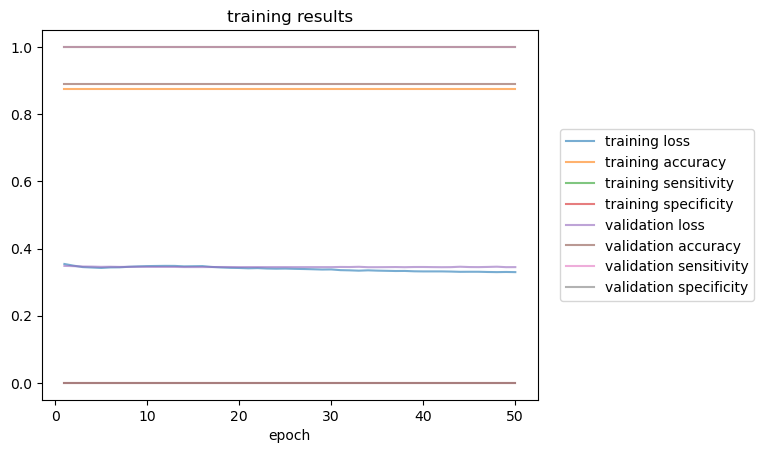

30 5.512973704807798 3 5 bce
7.588680267333984
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3204, Training Accuracy: 0.8988, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3213, Validation Accuracy: 0.9000, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3216, Training Accuracy: 0.8988, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3223, Validation Accuracy: 0.9000, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3210, Training Accuracy: 0.8988, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3223, Validation Accuracy: 0.9000, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3196, Training Accuracy: 0.8988, Training Sensitivity: 1.0000, Training Sp

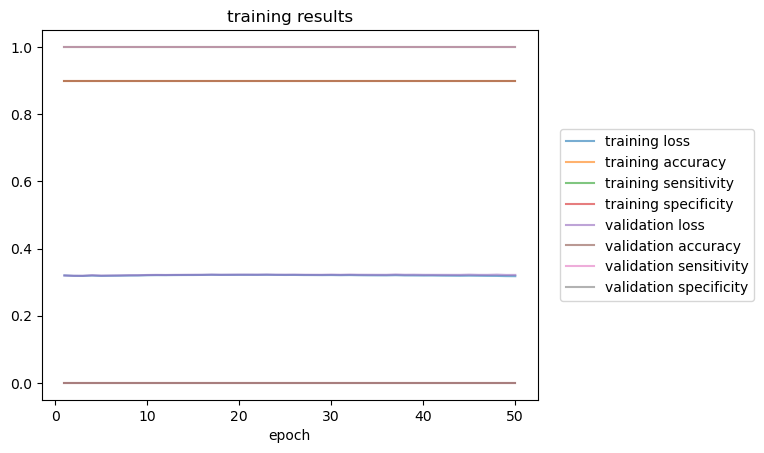

30 6.157684234066054 3 5 bce
7.976655721664429
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3292, Training Accuracy: 0.8948, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3111, Validation Accuracy: 0.9053, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3290, Training Accuracy: 0.8948, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3102, Validation Accuracy: 0.9053, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3291, Training Accuracy: 0.8948, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3116, Validation Accuracy: 0.9053, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3289, Training Accuracy: 0.8948, Training Sensitivity: 1.0000, Training Sp

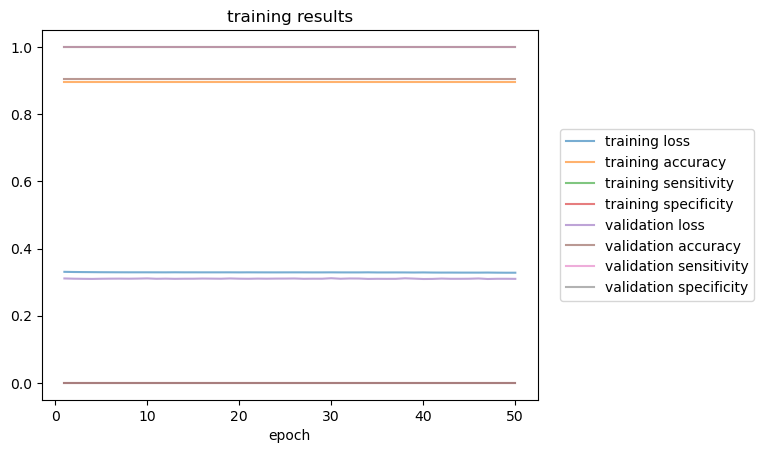

30 6.802394763324311 3 5 bce
9.492352724075317
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3289, Training Accuracy: 0.8960, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3430, Validation Accuracy: 0.8893, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3291, Training Accuracy: 0.8960, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3439, Validation Accuracy: 0.8893, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3292, Training Accuracy: 0.8960, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3445, Validation Accuracy: 0.8893, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3292, Training Accuracy: 0.8960, Training Sensitivity: 1.0000, Training Sp

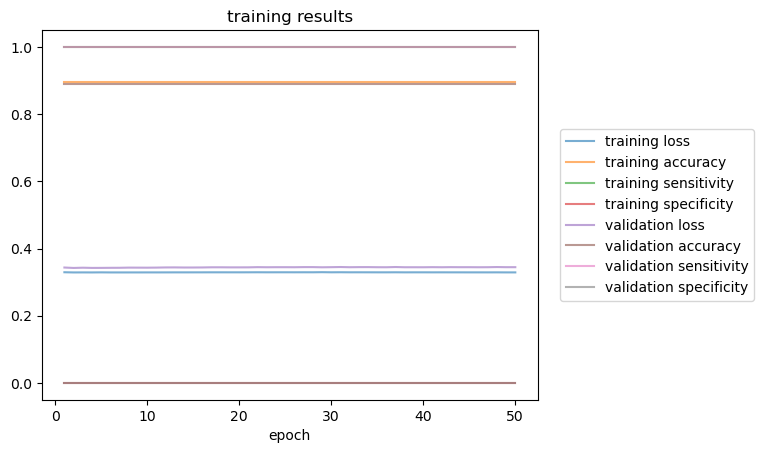

35 1.0 3 5 bce
3.3339643478393555
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3065, Training Accuracy: 0.8781, Training Sensitivity: 0.6886, Training Specificity: 0.9411, Validation Loss: 0.3098, Validation Accuracy: 0.8971, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.2986, Training Accuracy: 0.8701, Training Sensitivity: 0.6566, Training Specificity: 0.9411, Validation Loss: 0.3246, Validation Accuracy: 0.8971, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.2969, Training Accuracy: 0.8590, Training Sensitivity: 0.5903, Training Specificity: 0.9485, Validation Loss: 0.3565, Validation Accuracy: 0.8971, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.2939, Training Accuracy: 0.8654, Training Sensitivity: 0.6156, Training Specificity: 0.

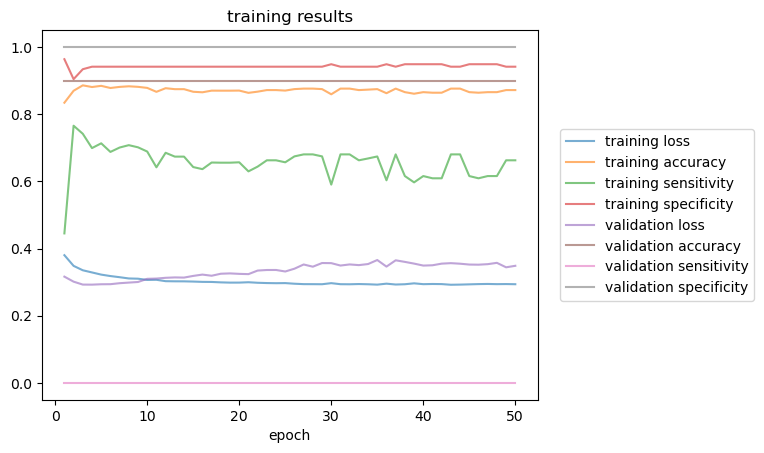

35 1.6789662358865365 3 5 bce
4.641732215881348
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2453, Training Accuracy: 0.9371, Training Sensitivity: 0.9622, Training Specificity: 0.9133, Validation Loss: 1.1521, Validation Accuracy: 0.5446, Validation Sensitivity: 0.3284, Validation Specificity: 0.8889
Epoch: 020, Training Loss: 0.2210, Training Accuracy: 0.9681, Training Sensitivity: 0.9533, Training Specificity: 0.9821, Validation Loss: 1.1926, Validation Accuracy: 0.5674, Validation Sensitivity: 0.3684, Validation Specificity: 0.8844
Epoch: 030, Training Loss: 0.2112, Training Accuracy: 0.9665, Training Sensitivity: 0.9500, Training Specificity: 0.9821, Validation Loss: 1.1839, Validation Accuracy: 0.5686, Validation Sensitivity: 0.3702, Validation Specificity: 0.8844
Epoch: 040, Training Loss: 0.1999, Training Accuracy: 0.9696, Training Sensitivity: 0.9564, Training S

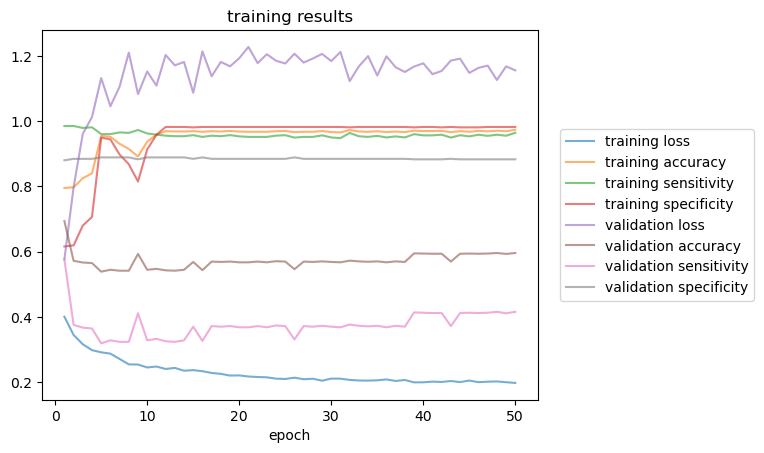

35 2.357932471773073 3 5 bce
5.472424030303955
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2377, Training Accuracy: 0.9409, Training Sensitivity: 0.9483, Training Specificity: 0.9282, Validation Loss: 0.5161, Validation Accuracy: 0.7817, Validation Sensitivity: 0.8103, Validation Specificity: 0.7146
Epoch: 020, Training Loss: 0.2236, Training Accuracy: 0.9411, Training Sensitivity: 0.9472, Training Specificity: 0.9305, Validation Loss: 0.5181, Validation Accuracy: 0.7737, Validation Sensitivity: 0.7940, Validation Specificity: 0.7261
Epoch: 030, Training Loss: 0.2203, Training Accuracy: 0.9397, Training Sensitivity: 0.9472, Training Specificity: 0.9266, Validation Loss: 0.4986, Validation Accuracy: 0.7794, Validation Sensitivity: 0.8021, Validation Specificity: 0.7261
Epoch: 040, Training Loss: 0.2219, Training Accuracy: 0.9411, Training Sensitivity: 0.9472, Training Sp

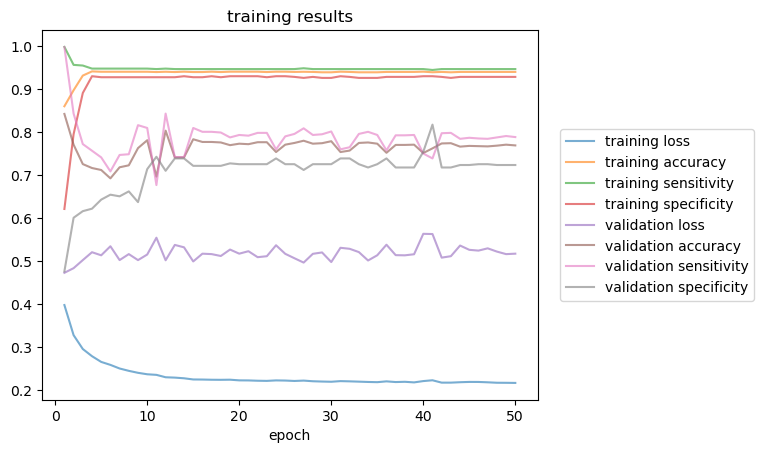

35 3.036898707659609 3 5 bce
6.255138874053955
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2530, Training Accuracy: 0.9347, Training Sensitivity: 0.9954, Training Specificity: 0.7303, Validation Loss: 0.5998, Validation Accuracy: 0.7217, Validation Sensitivity: 0.9720, Validation Specificity: 0.3260
Epoch: 020, Training Loss: 0.2509, Training Accuracy: 0.9347, Training Sensitivity: 0.9954, Training Specificity: 0.7303, Validation Loss: 0.6263, Validation Accuracy: 0.7223, Validation Sensitivity: 0.9711, Validation Specificity: 0.3289
Epoch: 030, Training Loss: 0.2507, Training Accuracy: 0.9347, Training Sensitivity: 0.9954, Training Specificity: 0.7303, Validation Loss: 0.6449, Validation Accuracy: 0.7029, Validation Sensitivity: 0.9860, Validation Specificity: 0.2552
Epoch: 040, Training Loss: 0.2503, Training Accuracy: 0.9347, Training Sensitivity: 0.9954, Training Sp

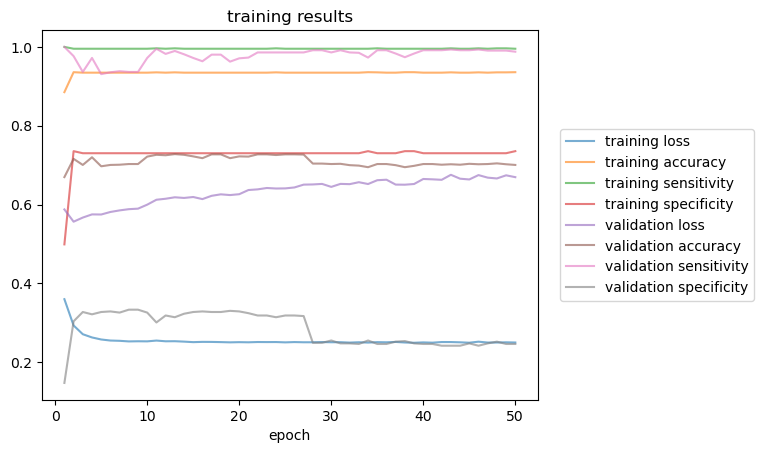

35 3.7158649435461455 3 5 bce
8.582287788391113
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3344, Training Accuracy: 0.8590, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3076, Validation Accuracy: 0.9057, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3301, Training Accuracy: 0.8590, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3108, Validation Accuracy: 0.9057, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3288, Training Accuracy: 0.8590, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3080, Validation Accuracy: 0.9057, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3263, Training Accuracy: 0.8598, Training Sensitivity: 1.0000, Training S

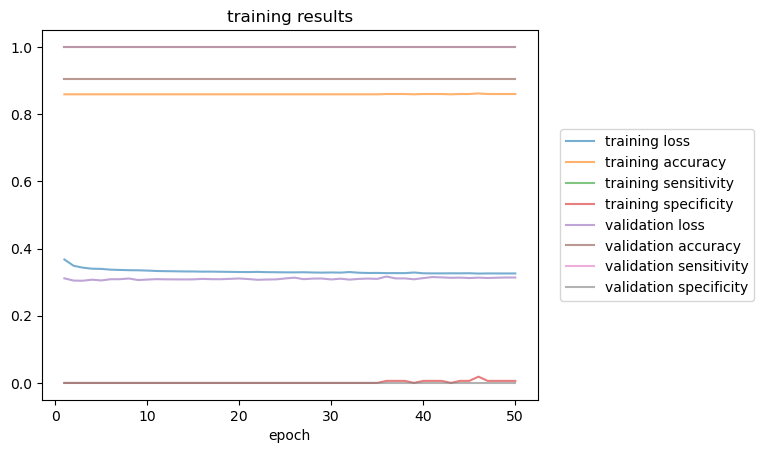

35 4.394831179432682 3 5 bce
9.24368929862976
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3350, Training Accuracy: 0.9040, Training Sensitivity: 0.9982, Training Specificity: 0.3615, Validation Loss: 0.4390, Validation Accuracy: 0.8080, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3320, Training Accuracy: 0.9046, Training Sensitivity: 0.9982, Training Specificity: 0.3654, Validation Loss: 0.4365, Validation Accuracy: 0.8371, Validation Sensitivity: 1.0000, Validation Specificity: 0.1518
Epoch: 030, Training Loss: 0.3316, Training Accuracy: 0.9040, Training Sensitivity: 0.9982, Training Specificity: 0.3615, Validation Loss: 0.4361, Validation Accuracy: 0.8366, Validation Sensitivity: 1.0000, Validation Specificity: 0.1488
Epoch: 040, Training Loss: 0.3268, Training Accuracy: 0.9046, Training Sensitivity: 0.9982, Training Spe

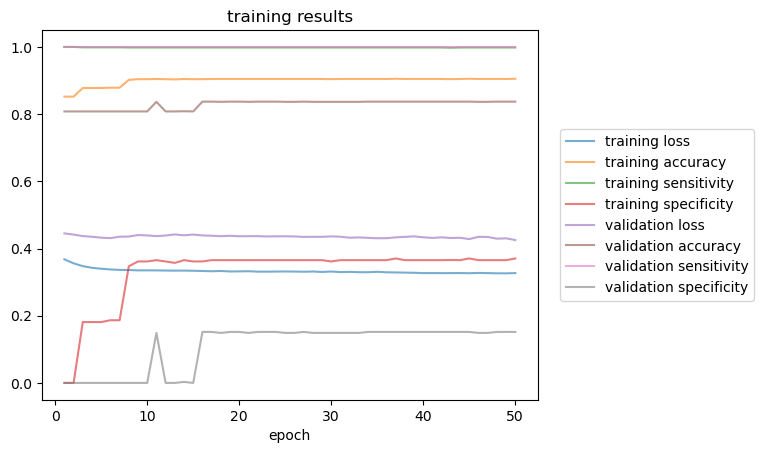

35 5.073797415319218 3 5 bce
10.288005828857422
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3416, Training Accuracy: 0.8771, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3656, Validation Accuracy: 0.8634, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3405, Training Accuracy: 0.8771, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3669, Validation Accuracy: 0.8634, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3392, Training Accuracy: 0.8771, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3661, Validation Accuracy: 0.8634, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3374, Training Accuracy: 0.8771, Training Sensitivity: 1.0000, Training S

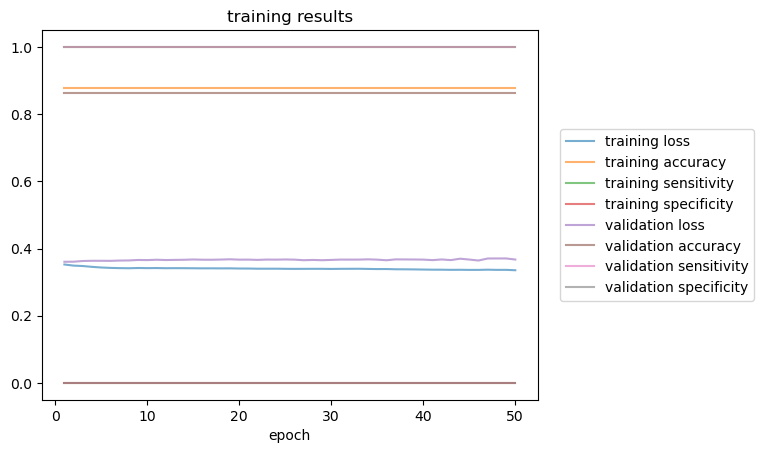

35 5.752763651205755 3 5 bce
10.87598204612732
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3172, Training Accuracy: 0.9023, Training Sensitivity: 1.0000, Training Specificity: 0.2263, Validation Loss: 0.3695, Validation Accuracy: 0.8663, Validation Sensitivity: 1.0000, Validation Specificity: 0.0168
Epoch: 020, Training Loss: 0.3151, Training Accuracy: 0.9023, Training Sensitivity: 1.0000, Training Specificity: 0.2263, Validation Loss: 0.3707, Validation Accuracy: 0.8663, Validation Sensitivity: 1.0000, Validation Specificity: 0.0168
Epoch: 030, Training Loss: 0.3144, Training Accuracy: 0.9023, Training Sensitivity: 1.0000, Training Specificity: 0.2263, Validation Loss: 0.3738, Validation Accuracy: 0.8640, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3163, Training Accuracy: 0.9023, Training Sensitivity: 1.0000, Training Sp

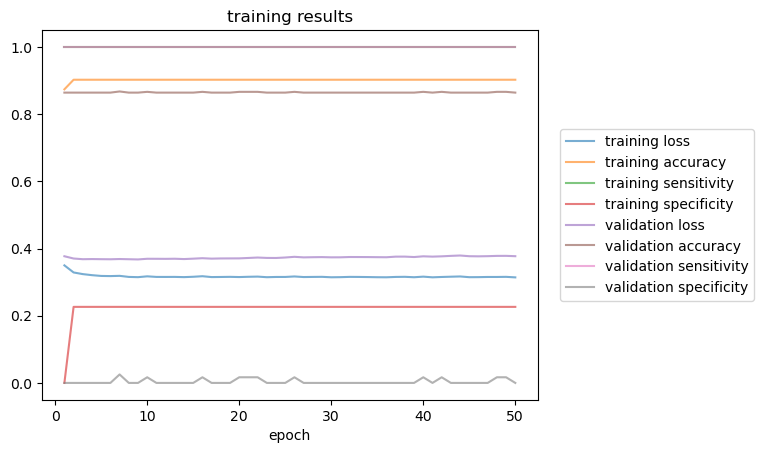

35 6.431729887092291 3 5 bce
11.281810760498047
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3367, Training Accuracy: 0.8751, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3201, Validation Accuracy: 0.8989, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3324, Training Accuracy: 0.8751, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3192, Validation Accuracy: 0.8989, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3312, Training Accuracy: 0.8751, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3197, Validation Accuracy: 0.8989, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3300, Training Accuracy: 0.8751, Training Sensitivity: 1.0000, Training S

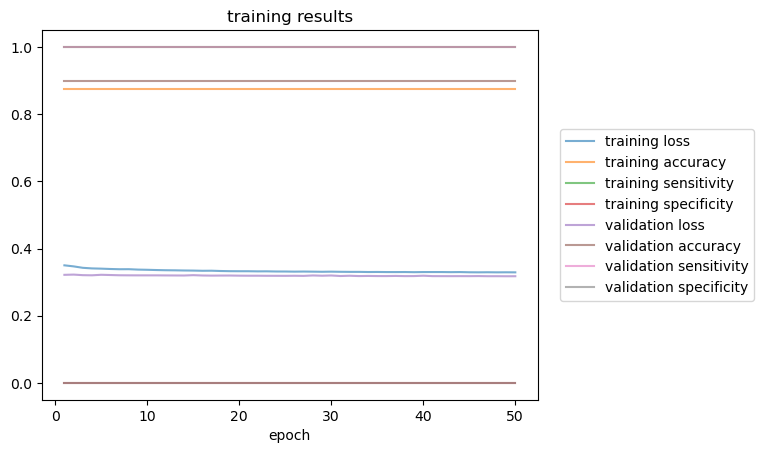

35 7.110696122978827 3 5 bce
12.813817501068115
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3249, Training Accuracy: 0.8976, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3232, Validation Accuracy: 0.8983, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3249, Training Accuracy: 0.8976, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3245, Validation Accuracy: 0.8983, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3246, Training Accuracy: 0.8976, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3249, Validation Accuracy: 0.8983, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3242, Training Accuracy: 0.8976, Training Sensitivity: 1.0000, Training S

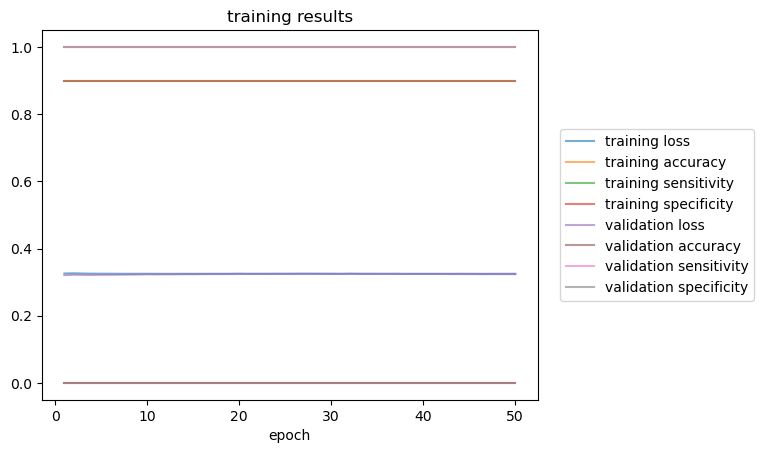

40 1.0 3 5 bce
3.7161388397216797
GCN(
  (conv1): GCNConv(40, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3073, Training Accuracy: 0.8415, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.3693, Validation Accuracy: 0.9165, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.3048, Training Accuracy: 0.8415, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.4180, Validation Accuracy: 0.9165, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.3039, Training Accuracy: 0.8415, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.4530, Validation Accuracy: 0.9165, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.3037, Training Accuracy: 0.8415, Training Sensitivity: 0.0000, Training Specificity: 1.

In [11]:
n_train = 500
n_val = 50
n_test = 50
n_epochs = 50
early_stopping_patience = None
t = 10
for max_n_samples_per_graph in [5]:
    for k in [3,5]:
        for n in [15,20,25,30,35,40,50]:
            results = []
            lamb = np.linspace(1,np.log(n)*2,t)
            for i in range(t):
                print(n,lamb[i],k,max_n_samples_per_graph,'bce')
                t1 = time.time()
                samples = generateSamples_sketch_classification(n_train,n_val,n_test,max_n_samples_per_graph,k,ErdosRenyiGraph,n,lamb[i]/n)
                t2 = time.time()
                print(t2-t1)
                outputs = run(samples,'gcn','bce','adam','cyclic-cosine',n_epochs,early_stopping_patience)
                results.append(outputs[1:])
            with open('ERresults_sketch_n'+str(n)+'_k'+str(k)+'_'+str(max_n_samples_per_graph)+'.pkl', 'wb') as file:
                pickle.dump(np.array(results), file)

In [ ]:
n_train = 500
n_val = 50
n_test = 50
n_epochs = 50
early_stopping_patience = None
t = 10
for max_n_samples_per_graph in [5]:
    for k in [5]:
        for n in [45,60]:
            results = []
            lamb = np.linspace(1,np.log(n)*2,t)
            for i in range(t):
                print(n,lamb[i],k,max_n_samples_per_graph,'bce')
                t1 = time.time()
                samples = generateSamples_sketch_classification(n_train,n_val,n_test,max_n_samples_per_graph,k,ErdosRenyiGraph,n,lamb[i]/n)
                t2 = time.time()
                print(t2-t1)
                outputs = run(samples,'gcn','bce','adam','cyclic-cosine',n_epochs,early_stopping_patience)
                results.append(outputs[1:])
            with open('ERresults_sketch_n'+str(n)+'_k'+str(k)+'_'+str(max_n_samples_per_graph)+'.pkl', 'wb') as file:
                pickle.dump(np.array(results), file)

In [ ]:
n_train = 500
n_val = 50
n_test = 50
n_epochs = 50
early_stopping_patience = None
t = 10
for max_n_samples_per_graph in [3]:
    for k in [3]:
        for n in [15,25,35,45,55]:
            results = []
            lamb = np.linspace(1,np.log(n)*2,t)
            for i in range(t):
                print(n,lamb[i],k,max_n_samples_per_graph,'mse')
                t1 = time.time()
                samples = generateSamples_sketch_regression(n_train,n_val,n_test,max_n_samples_per_graph,k,ErdosRenyiGraph,n,lamb[i]/n)
                t2 = time.time()
                print(t2-t1)
                outputs = run(samples,'gcn','mse','adam','cyclic-cosine',n_epochs,early_stopping_patience)
                results.append(outputs[1:])
            with open('ERresults_sketch_regression_n'+str(n)+'_k'+str(k)+'_'+str(max_n_samples_per_graph)+'.pkl', 'wb') as file:
                pickle.dump(np.array(results), file)

55 1.0 1 5 bce
7.701007604598999
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2855, Training Accuracy: 0.8162, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.4527, Validation Accuracy: 0.9349, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.2856, Training Accuracy: 0.8162, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.5328, Validation Accuracy: 0.9349, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.2857, Training Accuracy: 0.8162, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.7982, Validation Accuracy: 0.9349, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.2855, Training Accuracy: 0.8162, Training Sensitivity: 0.0000, Training Specificity: 1.0

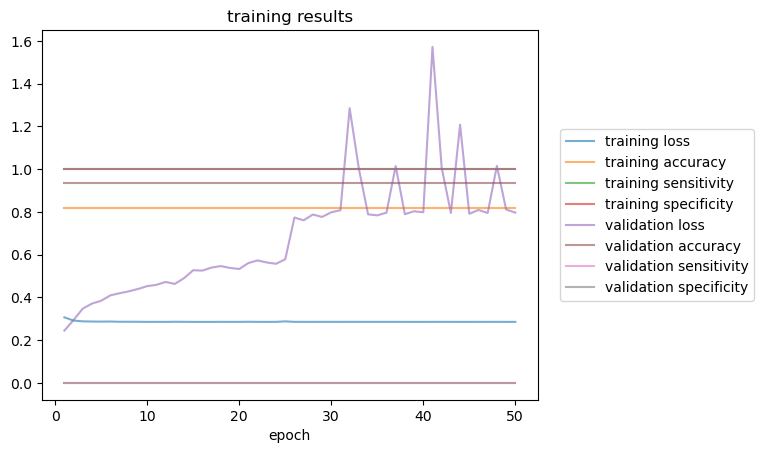

55 1.7794073744961048 1 5 bce
14.854159593582153
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2912, Training Accuracy: 0.9444, Training Sensitivity: 0.9401, Training Specificity: 0.9499, Validation Loss: 0.3543, Validation Accuracy: 0.8425, Validation Sensitivity: 0.8495, Validation Specificity: 0.8377
Epoch: 020, Training Loss: 0.2711, Training Accuracy: 0.9465, Training Sensitivity: 0.9449, Training Specificity: 0.9485, Validation Loss: 0.3976, Validation Accuracy: 0.8913, Validation Sensitivity: 0.9357, Validation Specificity: 0.8600
Epoch: 030, Training Loss: 0.2657, Training Accuracy: 0.9338, Training Sensitivity: 0.9182, Training Specificity: 0.9541, Validation Loss: 0.4297, Validation Accuracy: 0.8916, Validation Sensitivity: 0.9366, Validation Specificity: 0.8600
Epoch: 040, Training Loss: 0.2639, Training Accuracy: 0.9215, Training Sensitivity: 0.8922, Training 

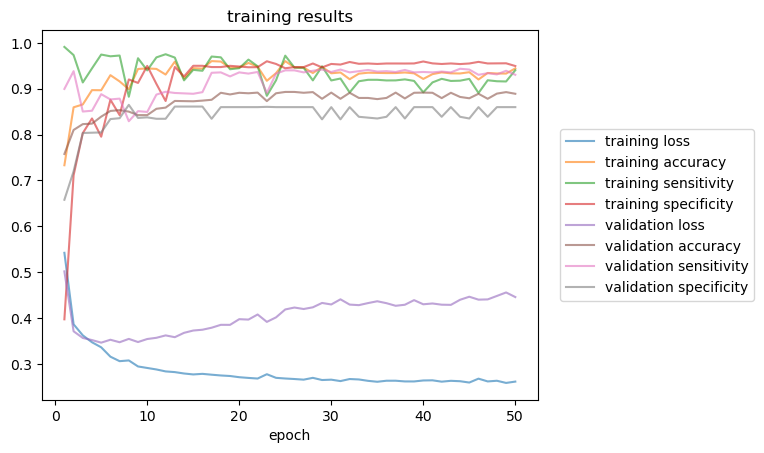

55 2.5588147489922095 1 5 bce
16.646555423736572
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2459, Training Accuracy: 0.9333, Training Sensitivity: 0.9413, Training Specificity: 0.9191, Validation Loss: 0.6363, Validation Accuracy: 0.7782, Validation Sensitivity: 0.8268, Validation Specificity: 0.6107
Epoch: 020, Training Loss: 0.2358, Training Accuracy: 0.9459, Training Sensitivity: 0.9639, Training Specificity: 0.9137, Validation Loss: 0.6577, Validation Accuracy: 0.7731, Validation Sensitivity: 0.8207, Validation Specificity: 0.6090
Epoch: 030, Training Loss: 0.2336, Training Accuracy: 0.9467, Training Sensitivity: 0.9656, Training Specificity: 0.9130, Validation Loss: 0.6856, Validation Accuracy: 0.7545, Validation Sensitivity: 0.8193, Validation Specificity: 0.5315
Epoch: 040, Training Loss: 0.2235, Training Accuracy: 0.9472, Training Sensitivity: 0.9662, Training 

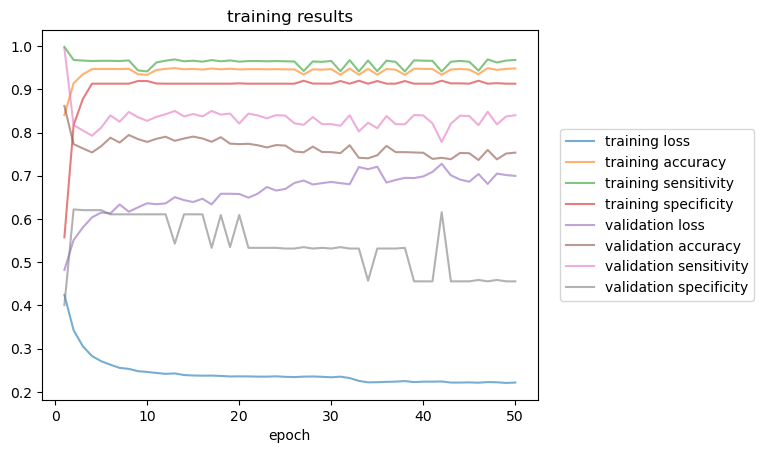

55 3.3382221234883143 1 5 bce
21.565203189849854
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2970, Training Accuracy: 0.9243, Training Sensitivity: 0.9980, Training Specificity: 0.6276, Validation Loss: 0.4366, Validation Accuracy: 0.8069, Validation Sensitivity: 0.9734, Validation Specificity: 0.3031
Epoch: 020, Training Loss: 0.2938, Training Accuracy: 0.9233, Training Sensitivity: 0.9963, Training Specificity: 0.6298, Validation Loss: 0.4511, Validation Accuracy: 0.7967, Validation Sensitivity: 0.9332, Validation Specificity: 0.3836
Epoch: 030, Training Loss: 0.2931, Training Accuracy: 0.9243, Training Sensitivity: 0.9975, Training Specificity: 0.6298, Validation Loss: 0.4506, Validation Accuracy: 0.7964, Validation Sensitivity: 0.9328, Validation Specificity: 0.3836
Epoch: 040, Training Loss: 0.2921, Training Accuracy: 0.9247, Training Sensitivity: 0.9980, Training 

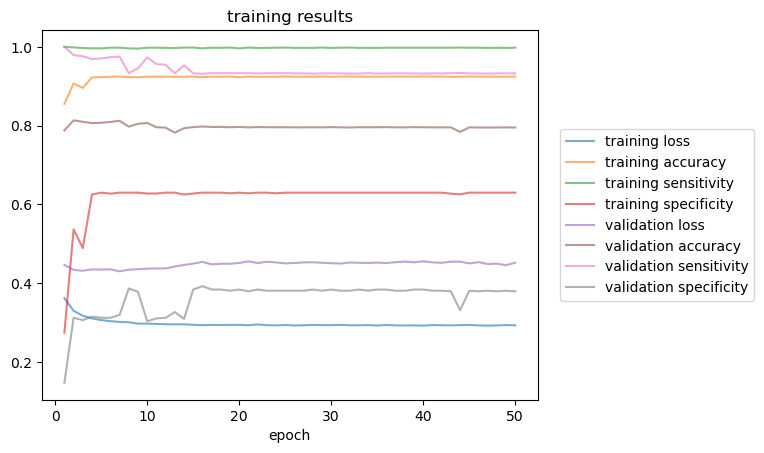

55 4.117629497984419 1 5 bce
25.847174644470215
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3310, Training Accuracy: 0.8993, Training Sensitivity: 0.9997, Training Specificity: 0.2620, Validation Loss: 0.3416, Validation Accuracy: 0.8887, Validation Sensitivity: 1.0000, Validation Specificity: 0.2463
Epoch: 020, Training Loss: 0.3311, Training Accuracy: 0.8993, Training Sensitivity: 0.9997, Training Specificity: 0.2620, Validation Loss: 0.3429, Validation Accuracy: 0.8887, Validation Sensitivity: 1.0000, Validation Specificity: 0.2463
Epoch: 030, Training Loss: 0.3296, Training Accuracy: 0.8993, Training Sensitivity: 0.9997, Training Specificity: 0.2620, Validation Loss: 0.3427, Validation Accuracy: 0.8887, Validation Sensitivity: 1.0000, Validation Specificity: 0.2463
Epoch: 040, Training Loss: 0.3294, Training Accuracy: 0.8993, Training Sensitivity: 0.9997, Training S

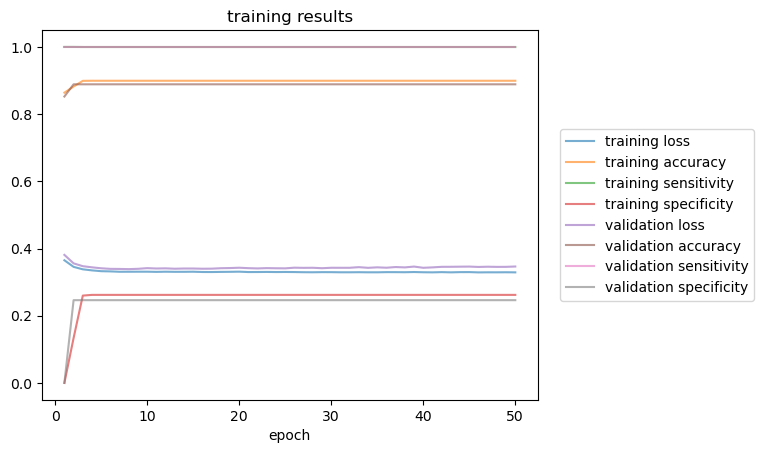

55 4.897036872480523 1 5 bce
28.982643604278564
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3348, Training Accuracy: 0.8926, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4096, Validation Accuracy: 0.8545, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3352, Training Accuracy: 0.8926, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4135, Validation Accuracy: 0.8545, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3344, Training Accuracy: 0.8926, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4150, Validation Accuracy: 0.8545, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3336, Training Accuracy: 0.8926, Training Sensitivity: 1.0000, Training S

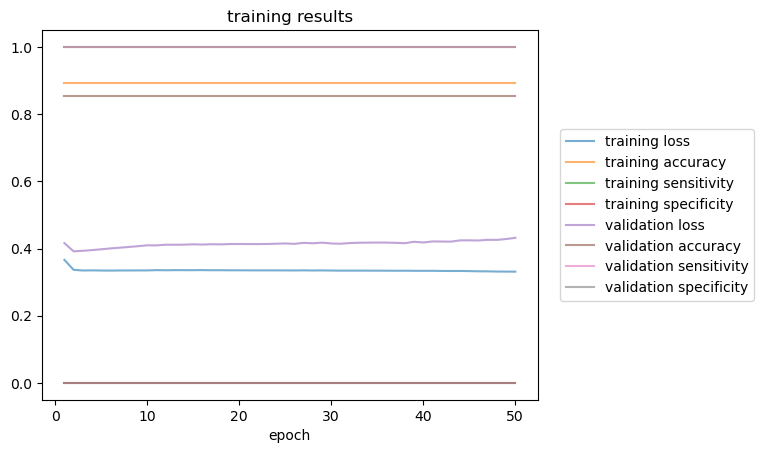

55 5.6764442469766285 1 5 bce
32.864782094955444
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3271, Training Accuracy: 0.8965, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3595, Validation Accuracy: 0.8796, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3278, Training Accuracy: 0.8965, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3624, Validation Accuracy: 0.8796, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3279, Training Accuracy: 0.8965, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3642, Validation Accuracy: 0.8796, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3275, Training Accuracy: 0.8965, Training Sensitivity: 1.0000, Training 

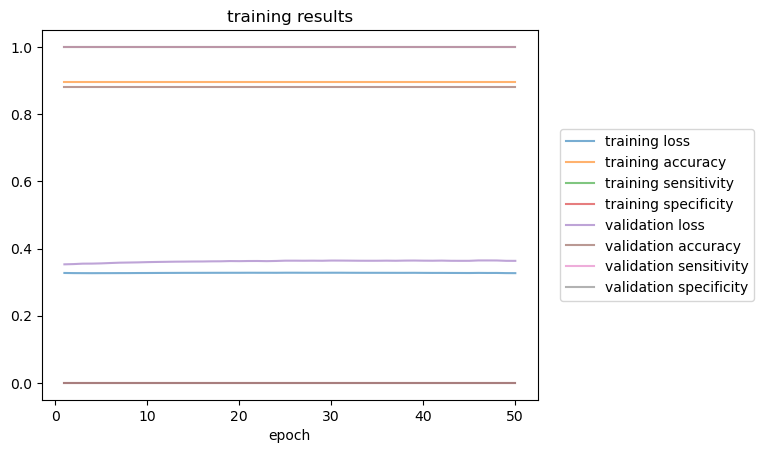

55 6.455851621472734 1 5 bce
35.759653091430664
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3340, Training Accuracy: 0.8797, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3691, Validation Accuracy: 0.8731, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3329, Training Accuracy: 0.8797, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3736, Validation Accuracy: 0.8731, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3322, Training Accuracy: 0.8797, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3761, Validation Accuracy: 0.8731, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3319, Training Accuracy: 0.8797, Training Sensitivity: 1.0000, Training S

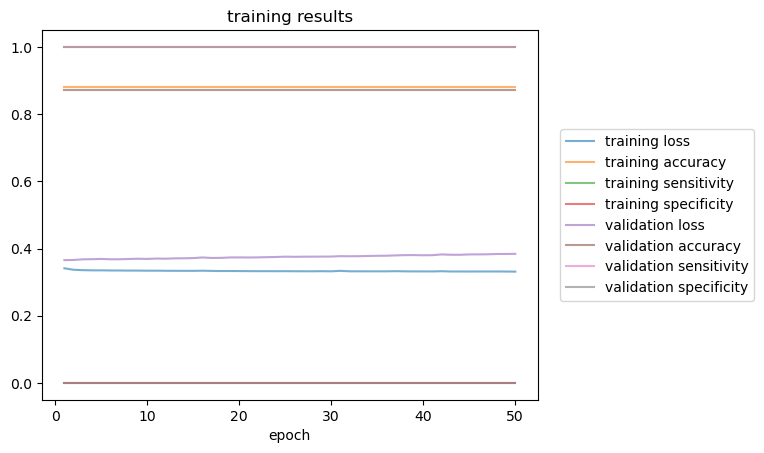

55 7.235258995968838 1 5 bce
37.66792917251587
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3302, Training Accuracy: 0.8959, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3430, Validation Accuracy: 0.8898, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3305, Training Accuracy: 0.8959, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3441, Validation Accuracy: 0.8898, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3303, Training Accuracy: 0.8959, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3442, Validation Accuracy: 0.8898, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3303, Training Accuracy: 0.8959, Training Sensitivity: 1.0000, Training Sp

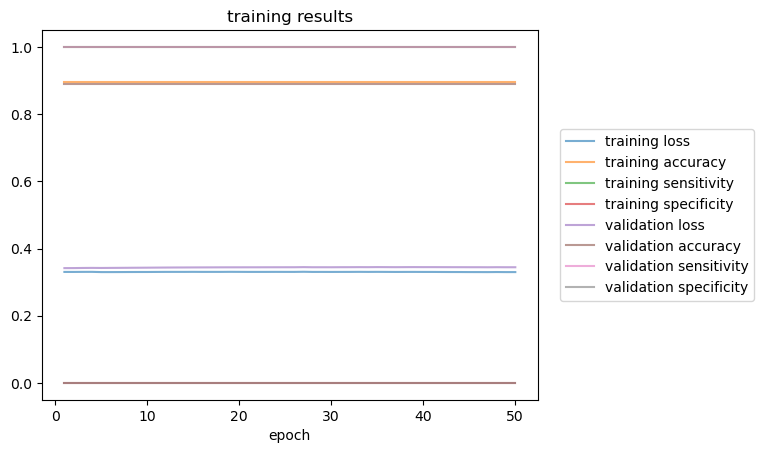

55 8.014666370464942 1 5 bce
41.5087730884552
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3410, Training Accuracy: 0.8911, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3323, Validation Accuracy: 0.8960, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3413, Training Accuracy: 0.8911, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3325, Validation Accuracy: 0.8960, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3413, Training Accuracy: 0.8911, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3326, Validation Accuracy: 0.8960, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3415, Training Accuracy: 0.8911, Training Sensitivity: 1.0000, Training Spe

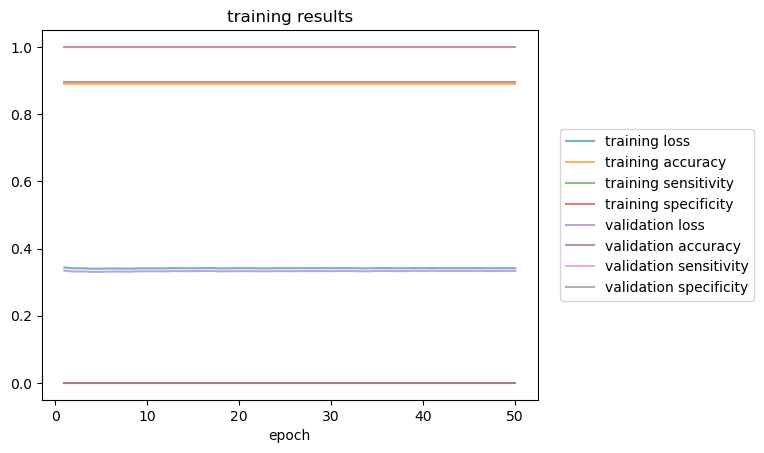

60 1.0 1 5 bce
8.546425104141235
GCN(
  (conv1): GCNConv(60, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2194, Training Accuracy: 0.9208, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.1764, Validation Accuracy: 0.9563, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.2164, Training Accuracy: 0.9208, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.1909, Validation Accuracy: 0.9563, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.2154, Training Accuracy: 0.9208, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.2023, Validation Accuracy: 0.9563, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.2151, Training Accuracy: 0.9208, Training Sensitivity: 0.0000, Training Specificity: 1.0

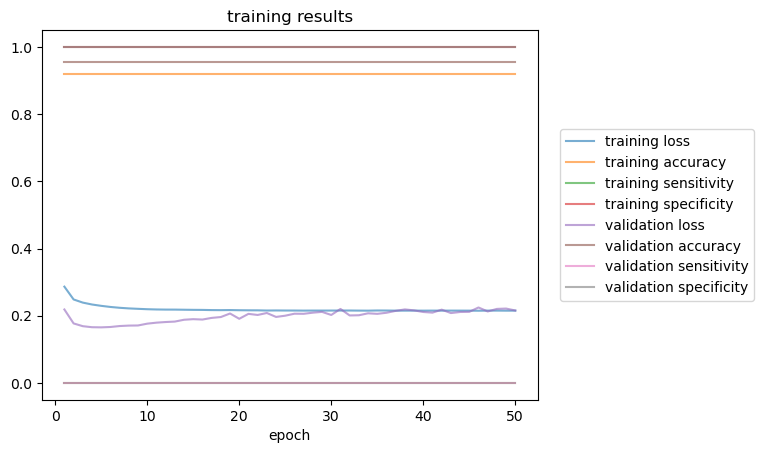

60 1.7987432360493556 1 5 bce
15.484261274337769
GCN(
  (conv1): GCNConv(60, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.5474, Training Accuracy: 0.7631, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.9721, Validation Accuracy: 0.3997, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.5474, Training Accuracy: 0.7631, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.9725, Validation Accuracy: 0.3997, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.5474, Training Accuracy: 0.7631, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.9725, Validation Accuracy: 0.3997, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.5474, Training Accuracy: 0.7631, Training Sensitivity: 0.0000, Training 

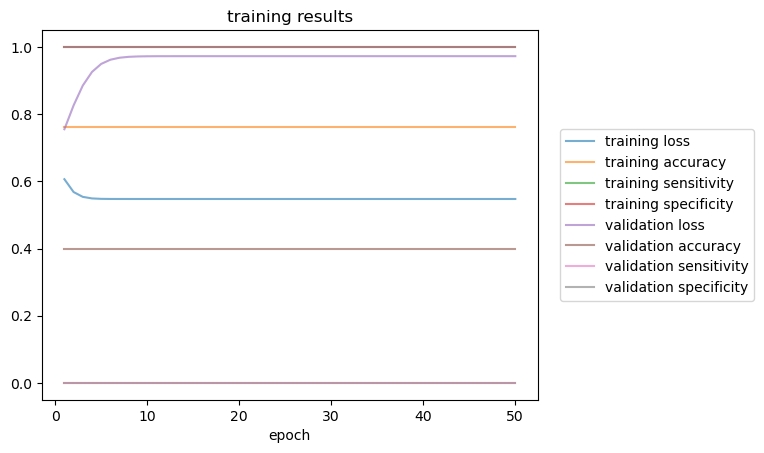

60 2.597486472098711 1 5 bce
22.3424654006958
GCN(
  (conv1): GCNConv(60, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3651, Training Accuracy: 0.8888, Training Sensitivity: 0.9720, Training Specificity: 0.6879, Validation Loss: 0.6615, Validation Accuracy: 0.6873, Validation Sensitivity: 0.7264, Validation Specificity: 0.6150
Epoch: 020, Training Loss: 0.3589, Training Accuracy: 0.9010, Training Sensitivity: 0.9720, Training Specificity: 0.7295, Validation Loss: 0.6693, Validation Accuracy: 0.6880, Validation Sensitivity: 0.7279, Validation Specificity: 0.6141
Epoch: 030, Training Loss: 0.3595, Training Accuracy: 0.9010, Training Sensitivity: 0.9724, Training Specificity: 0.7286, Validation Loss: 0.6645, Validation Accuracy: 0.6767, Validation Sensitivity: 0.6863, Validation Specificity: 0.6587
Epoch: 040, Training Loss: 0.3548, Training Accuracy: 0.9010, Training Sensitivity: 0.9727, Training Spe

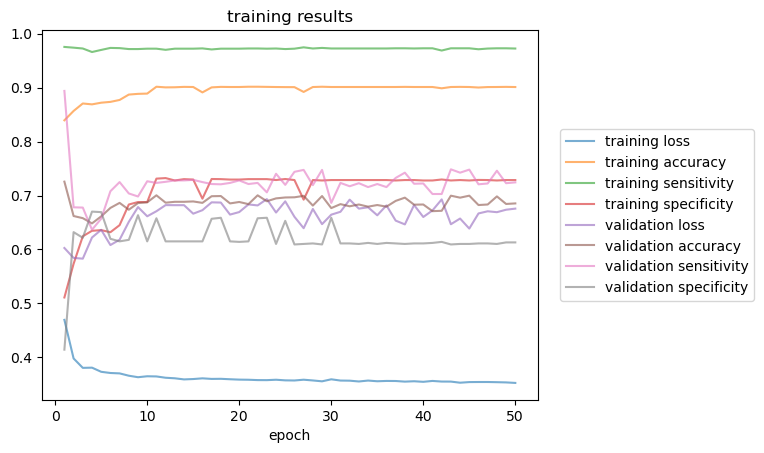

60 3.396229708148067 1 5 bce
28.66897463798523
GCN(
  (conv1): GCNConv(60, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3251, Training Accuracy: 0.9128, Training Sensitivity: 0.9994, Training Specificity: 0.4861, Validation Loss: 0.4002, Validation Accuracy: 0.8363, Validation Sensitivity: 1.0000, Validation Specificity: 0.0974
Epoch: 020, Training Loss: 0.3223, Training Accuracy: 0.9128, Training Sensitivity: 0.9994, Training Specificity: 0.4861, Validation Loss: 0.4044, Validation Accuracy: 0.8363, Validation Sensitivity: 1.0000, Validation Specificity: 0.0974
Epoch: 030, Training Loss: 0.3213, Training Accuracy: 0.9128, Training Sensitivity: 0.9994, Training Specificity: 0.4861, Validation Loss: 0.4073, Validation Accuracy: 0.8363, Validation Sensitivity: 1.0000, Validation Specificity: 0.0974
Epoch: 040, Training Loss: 0.3222, Training Accuracy: 0.9128, Training Sensitivity: 0.9994, Training Sp

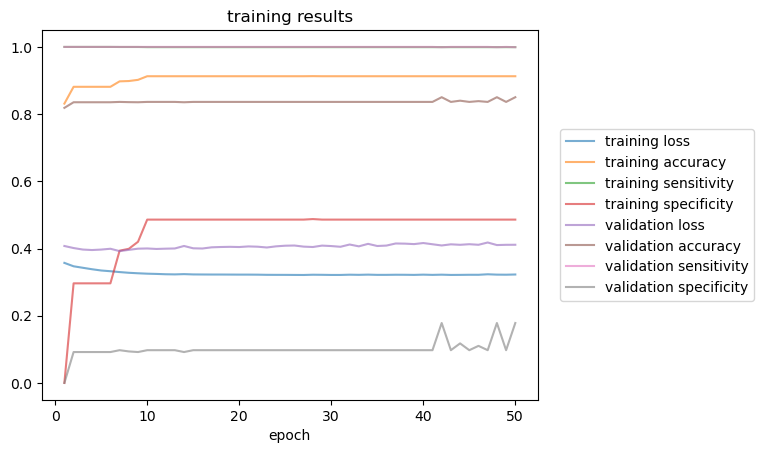

60 4.194972944197422 1 5 bce
29.750216722488403
GCN(
  (conv1): GCNConv(60, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3070, Training Accuracy: 0.9172, Training Sensitivity: 0.9986, Training Specificity: 0.5476, Validation Loss: 0.4326, Validation Accuracy: 0.8010, Validation Sensitivity: 0.9465, Validation Specificity: 0.2068
Epoch: 020, Training Loss: 0.3064, Training Accuracy: 0.9172, Training Sensitivity: 0.9986, Training Specificity: 0.5476, Validation Loss: 0.4446, Validation Accuracy: 0.7997, Validation Sensitivity: 0.9448, Validation Specificity: 0.2068
Epoch: 030, Training Loss: 0.3055, Training Accuracy: 0.9172, Training Sensitivity: 0.9986, Training Specificity: 0.5476, Validation Loss: 0.4537, Validation Accuracy: 0.8010, Validation Sensitivity: 0.9440, Validation Specificity: 0.2169
Epoch: 040, Training Loss: 0.3059, Training Accuracy: 0.9172, Training Sensitivity: 0.9986, Training S

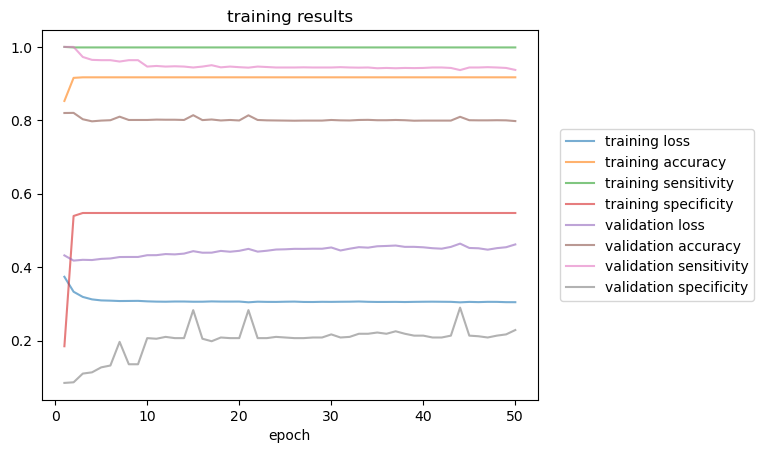

60 4.993716180246778 1 5 bce
38.718761920928955
GCN(
  (conv1): GCNConv(60, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3288, Training Accuracy: 0.9021, Training Sensitivity: 0.9991, Training Specificity: 0.3309, Validation Loss: 0.3805, Validation Accuracy: 0.8737, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3287, Training Accuracy: 0.9021, Training Sensitivity: 0.9991, Training Specificity: 0.3309, Validation Loss: 0.3810, Validation Accuracy: 0.8737, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3292, Training Accuracy: 0.9021, Training Sensitivity: 0.9991, Training Specificity: 0.3309, Validation Loss: 0.3807, Validation Accuracy: 0.8737, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3275, Training Accuracy: 0.9021, Training Sensitivity: 0.9991, Training S

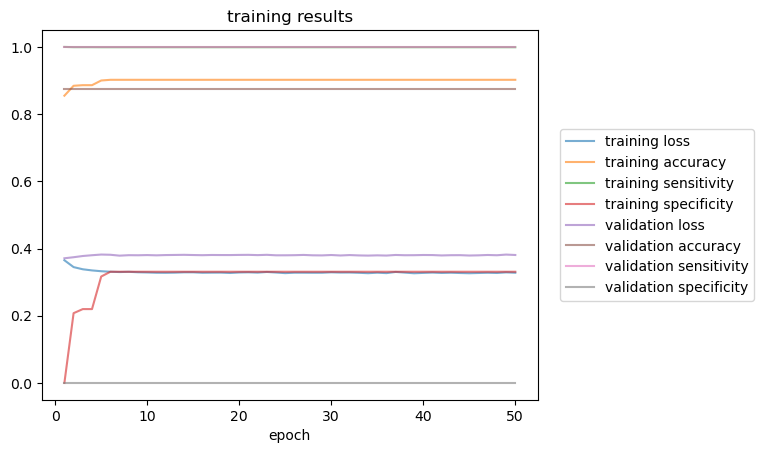

60 5.792459416296134 1 5 bce
38.424853563308716
GCN(
  (conv1): GCNConv(60, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3430, Training Accuracy: 0.8818, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3650, Validation Accuracy: 0.8777, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3396, Training Accuracy: 0.8818, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3653, Validation Accuracy: 0.8777, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3391, Training Accuracy: 0.8818, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3656, Validation Accuracy: 0.8777, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3372, Training Accuracy: 0.8818, Training Sensitivity: 1.0000, Training S

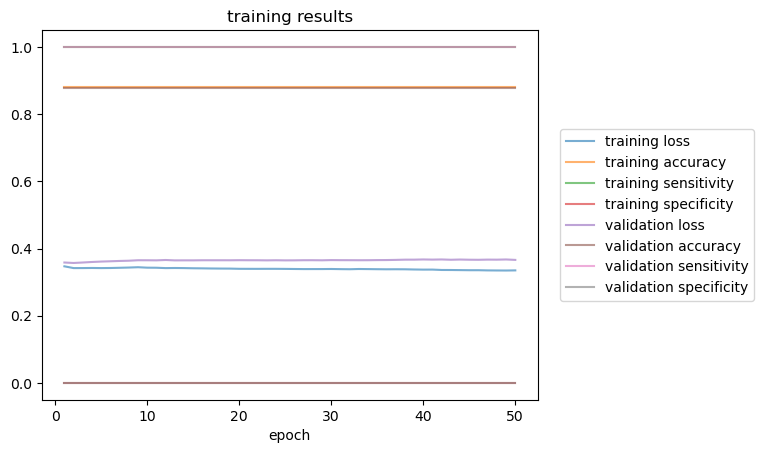

60 6.591202652345489 1 5 bce
45.536426305770874
GCN(
  (conv1): GCNConv(60, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3460, Training Accuracy: 0.8903, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3479, Validation Accuracy: 0.8893, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3460, Training Accuracy: 0.8903, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3479, Validation Accuracy: 0.8893, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3460, Training Accuracy: 0.8903, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3479, Validation Accuracy: 0.8893, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3457, Training Accuracy: 0.8903, Training Sensitivity: 1.0000, Training S

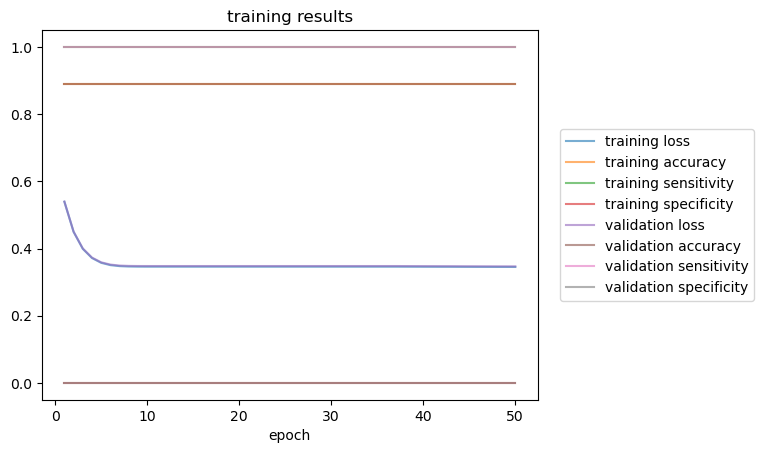

60 7.389945888394845 1 5 bce
50.31833481788635
GCN(
  (conv1): GCNConv(60, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3456, Training Accuracy: 0.8904, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3314, Validation Accuracy: 0.8973, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3456, Training Accuracy: 0.8904, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3312, Validation Accuracy: 0.8973, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3456, Training Accuracy: 0.8904, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3312, Validation Accuracy: 0.8973, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3452, Training Accuracy: 0.8904, Training Sensitivity: 1.0000, Training Sp

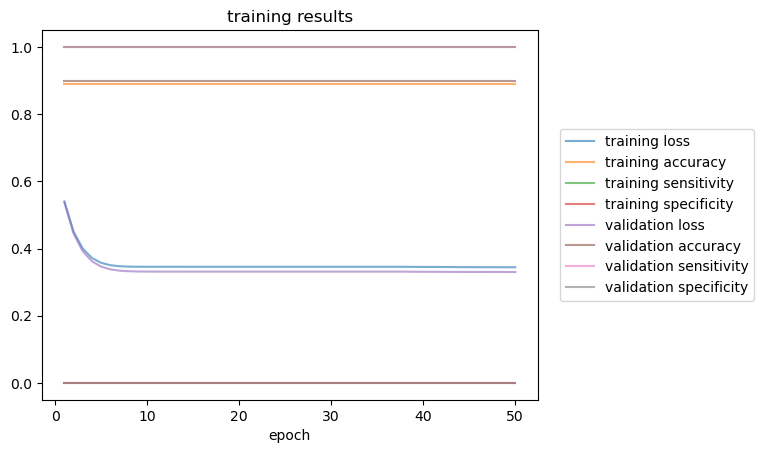

60 8.1886891244442 1 5 bce
54.701918840408325
GCN(
  (conv1): GCNConv(60, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3375, Training Accuracy: 0.8903, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3559, Validation Accuracy: 0.8797, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3376, Training Accuracy: 0.8903, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3580, Validation Accuracy: 0.8797, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3370, Training Accuracy: 0.8903, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3580, Validation Accuracy: 0.8797, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3369, Training Accuracy: 0.8903, Training Sensitivity: 1.0000, Training Spe

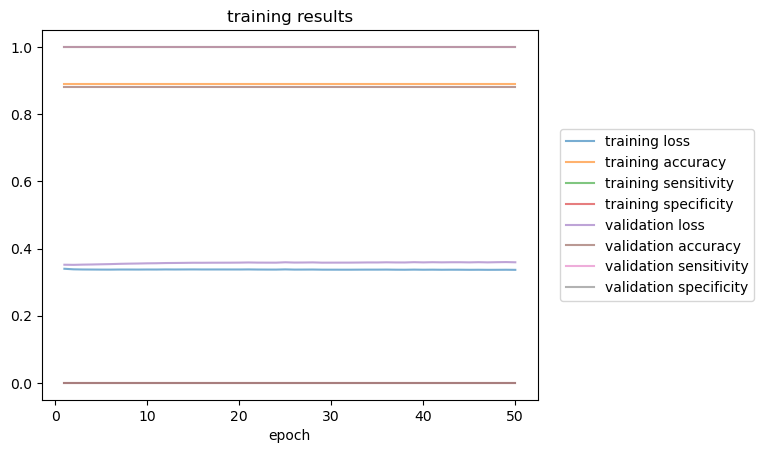

55 1.0 3 5 bce
7.132767915725708
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.1415, Training Accuracy: 0.9555, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.3966, Validation Accuracy: 0.9247, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.1424, Training Accuracy: 0.9555, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.4738, Validation Accuracy: 0.9247, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.1424, Training Accuracy: 0.9555, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.4913, Validation Accuracy: 0.9247, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.1416, Training Accuracy: 0.9555, Training Sensitivity: 0.0000, Training Specificity: 1.0

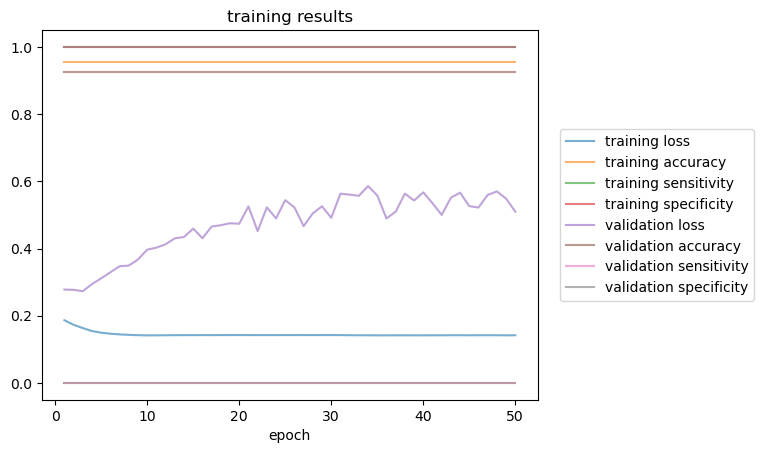

55 1.7794073744961048 3 5 bce
15.754343509674072
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2682, Training Accuracy: 0.9249, Training Sensitivity: 0.9671, Training Specificity: 0.8440, Validation Loss: 0.6227, Validation Accuracy: 0.7505, Validation Sensitivity: 0.7495, Validation Specificity: 0.7518
Epoch: 020, Training Loss: 0.2655, Training Accuracy: 0.9364, Training Sensitivity: 0.9646, Training Specificity: 0.8824, Validation Loss: 0.6598, Validation Accuracy: 0.7353, Validation Sensitivity: 0.7195, Validation Specificity: 0.7533
Epoch: 030, Training Loss: 0.2626, Training Accuracy: 0.9240, Training Sensitivity: 0.9657, Training Specificity: 0.8439, Validation Loss: 0.6629, Validation Accuracy: 0.7407, Validation Sensitivity: 0.7290, Validation Specificity: 0.7541
Epoch: 040, Training Loss: 0.2591, Training Accuracy: 0.9343, Training Sensitivity: 0.9868, Training 

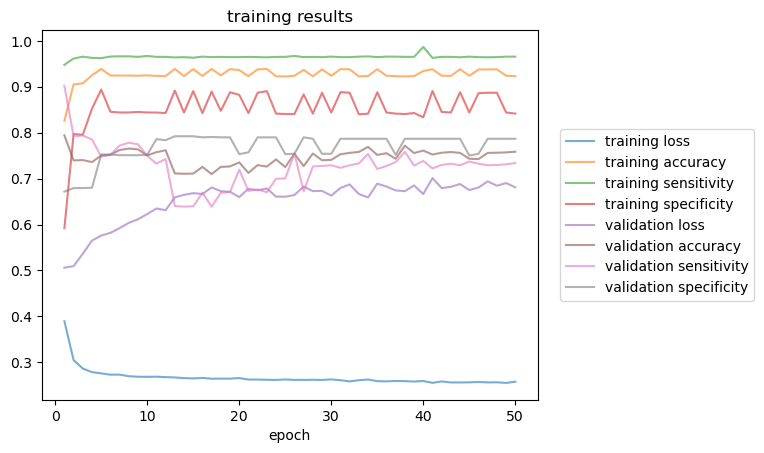

55 2.5588147489922095 3 5 bce
17.558247089385986
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3582, Training Accuracy: 0.8906, Training Sensitivity: 0.9395, Training Specificity: 0.7895, Validation Loss: 0.5812, Validation Accuracy: 0.6815, Validation Sensitivity: 0.6579, Validation Specificity: 0.7382
Epoch: 020, Training Loss: 0.3452, Training Accuracy: 0.9072, Training Sensitivity: 0.9406, Training Specificity: 0.8381, Validation Loss: 0.5735, Validation Accuracy: 0.7215, Validation Sensitivity: 0.7191, Validation Specificity: 0.7270
Epoch: 030, Training Loss: 0.3431, Training Accuracy: 0.9133, Training Sensitivity: 0.9395, Training Specificity: 0.8591, Validation Loss: 0.5670, Validation Accuracy: 0.7665, Validation Sensitivity: 0.7865, Validation Specificity: 0.7184
Epoch: 040, Training Loss: 0.3378, Training Accuracy: 0.9217, Training Sensitivity: 0.9395, Training 

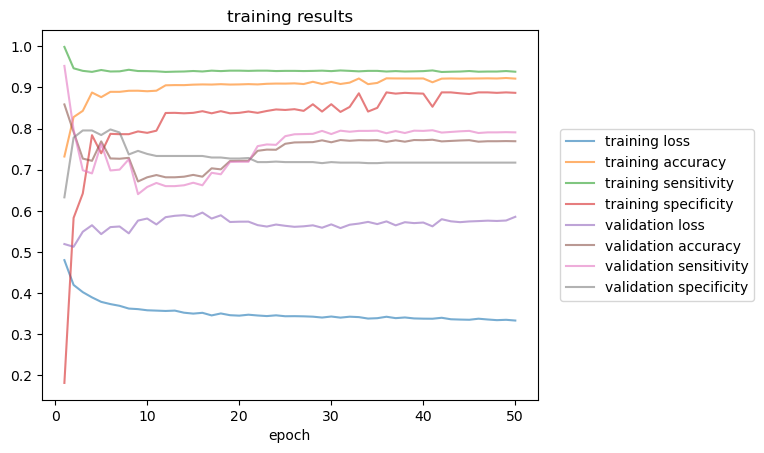

55 3.3382221234883143 3 5 bce
20.51300835609436
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2983, Training Accuracy: 0.9356, Training Sensitivity: 0.9947, Training Specificity: 0.7470, Validation Loss: 0.4763, Validation Accuracy: 0.7891, Validation Sensitivity: 0.9800, Validation Specificity: 0.1736
Epoch: 020, Training Loss: 0.2934, Training Accuracy: 0.9364, Training Sensitivity: 0.9947, Training Specificity: 0.7505, Validation Loss: 0.4884, Validation Accuracy: 0.7898, Validation Sensitivity: 0.9800, Validation Specificity: 0.1767
Epoch: 030, Training Loss: 0.2952, Training Accuracy: 0.9357, Training Sensitivity: 0.9949, Training Specificity: 0.7468, Validation Loss: 0.5018, Validation Accuracy: 0.7905, Validation Sensitivity: 0.9809, Validation Specificity: 0.1767
Epoch: 040, Training Loss: 0.2858, Training Accuracy: 0.9364, Training Sensitivity: 0.9947, Training S

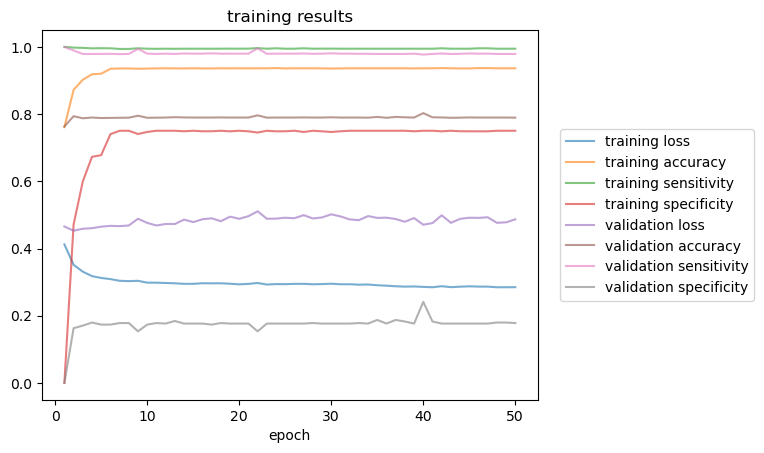

55 4.117629497984419 3 5 bce
26.5636568069458
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3390, Training Accuracy: 0.8932, Training Sensitivity: 0.9989, Training Specificity: 0.3354, Validation Loss: 0.4482, Validation Accuracy: 0.8287, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3338, Training Accuracy: 0.9095, Training Sensitivity: 0.9985, Training Specificity: 0.4399, Validation Loss: 0.4536, Validation Accuracy: 0.8287, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3319, Training Accuracy: 0.9095, Training Sensitivity: 0.9985, Training Specificity: 0.4399, Validation Loss: 0.4583, Validation Accuracy: 0.8287, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3323, Training Accuracy: 0.9091, Training Sensitivity: 0.9985, Training Spe

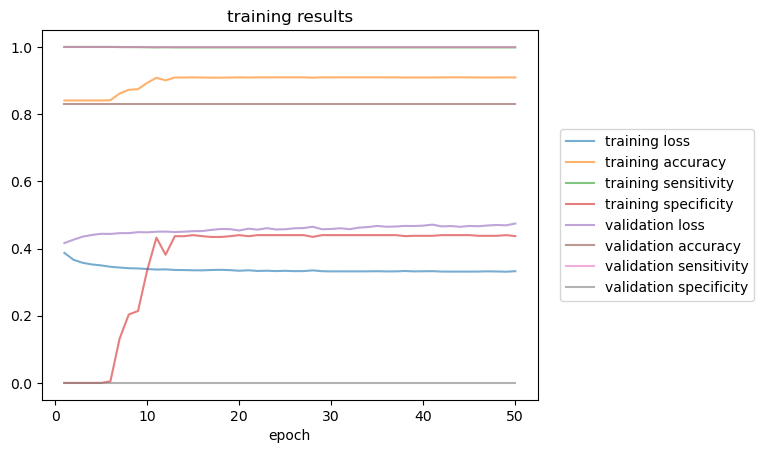

55 4.897036872480523 3 5 bce
29.80489945411682
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3420, Training Accuracy: 0.8987, Training Sensitivity: 0.9992, Training Specificity: 0.2558, Validation Loss: 0.4381, Validation Accuracy: 0.8327, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3422, Training Accuracy: 0.8987, Training Sensitivity: 0.9992, Training Specificity: 0.2558, Validation Loss: 0.4451, Validation Accuracy: 0.8327, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3410, Training Accuracy: 0.8989, Training Sensitivity: 0.9992, Training Specificity: 0.2577, Validation Loss: 0.4474, Validation Accuracy: 0.8309, Validation Sensitivity: 0.9965, Validation Specificity: 0.0065
Epoch: 040, Training Loss: 0.3401, Training Accuracy: 0.8989, Training Sensitivity: 0.9992, Training Sp

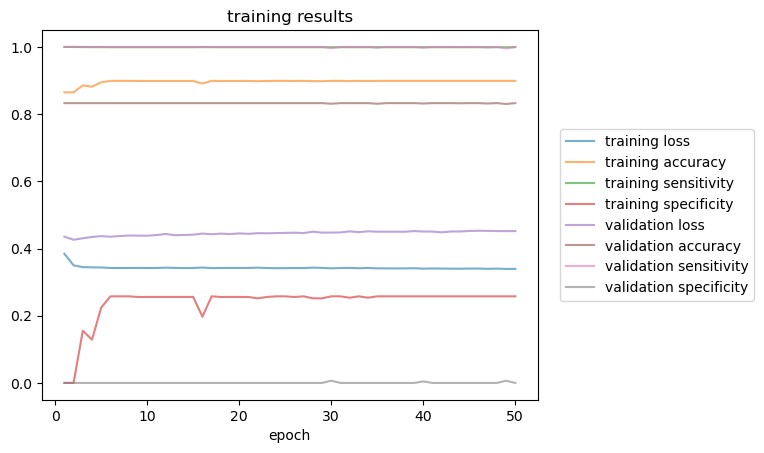

55 5.6764442469766285 3 5 bce
32.73757529258728
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3361, Training Accuracy: 0.8797, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3645, Validation Accuracy: 0.8767, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3352, Training Accuracy: 0.8797, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3647, Validation Accuracy: 0.8767, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3344, Training Accuracy: 0.8800, Training Sensitivity: 1.0000, Training Specificity: 0.0021, Validation Loss: 0.3658, Validation Accuracy: 0.8767, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3339, Training Accuracy: 0.8800, Training Sensitivity: 1.0000, Training S

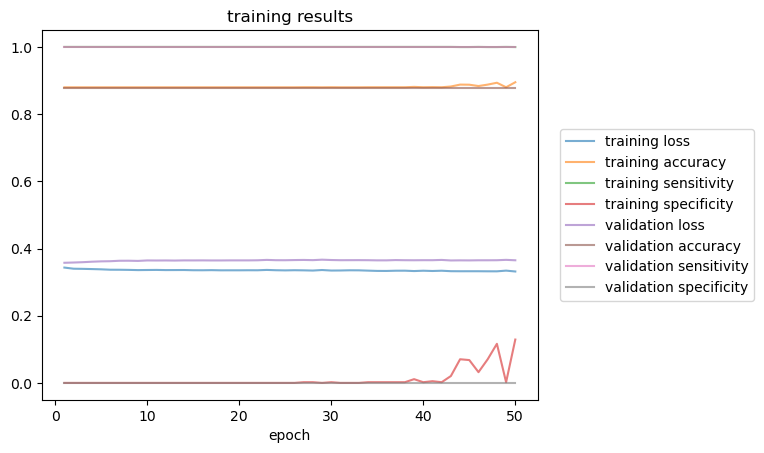

55 6.455851621472734 3 5 bce
33.34911322593689
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3328, Training Accuracy: 0.8927, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3699, Validation Accuracy: 0.8738, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3329, Training Accuracy: 0.8927, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3736, Validation Accuracy: 0.8738, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3324, Training Accuracy: 0.8927, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3742, Validation Accuracy: 0.8738, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3320, Training Accuracy: 0.8927, Training Sensitivity: 1.0000, Training Sp

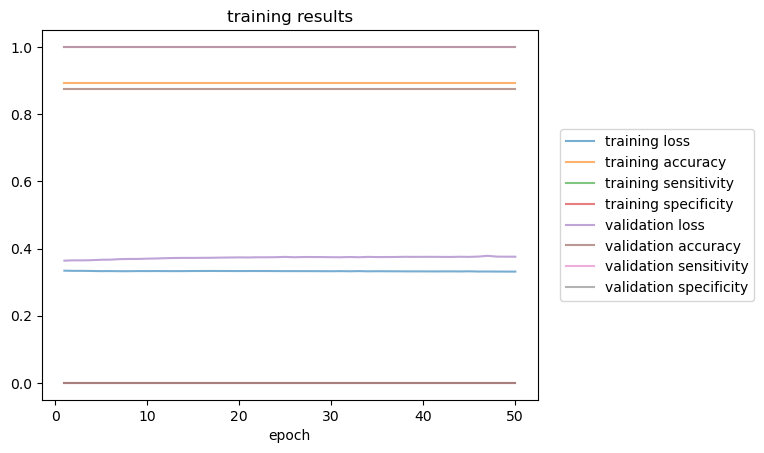

55 7.235258995968838 3 5 bce
36.89099669456482
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3389, Training Accuracy: 0.8911, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3272, Validation Accuracy: 0.8971, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3388, Training Accuracy: 0.8911, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3278, Validation Accuracy: 0.8971, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3386, Training Accuracy: 0.8911, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3276, Validation Accuracy: 0.8971, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3381, Training Accuracy: 0.8911, Training Sensitivity: 1.0000, Training Sp

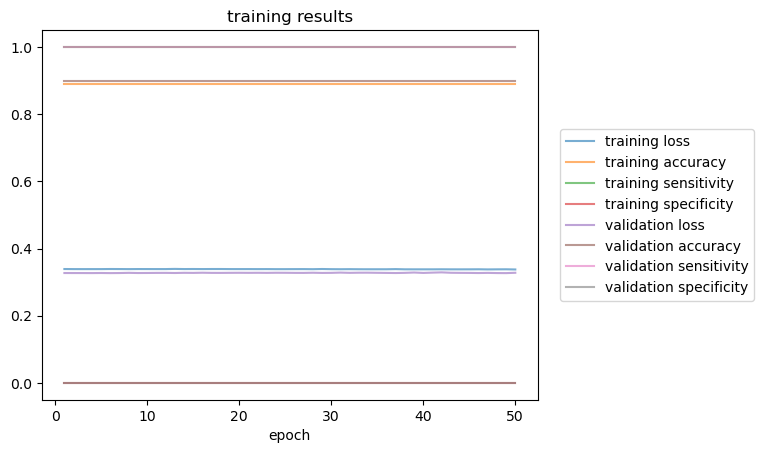

55 8.014666370464942 3 5 bce
41.23121523857117
GCN(
  (conv1): GCNConv(55, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3361, Training Accuracy: 0.8928, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3177, Validation Accuracy: 0.9011, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3366, Training Accuracy: 0.8928, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3190, Validation Accuracy: 0.9011, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3366, Training Accuracy: 0.8928, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3194, Validation Accuracy: 0.9011, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3365, Training Accuracy: 0.8928, Training Sensitivity: 1.0000, Training Sp

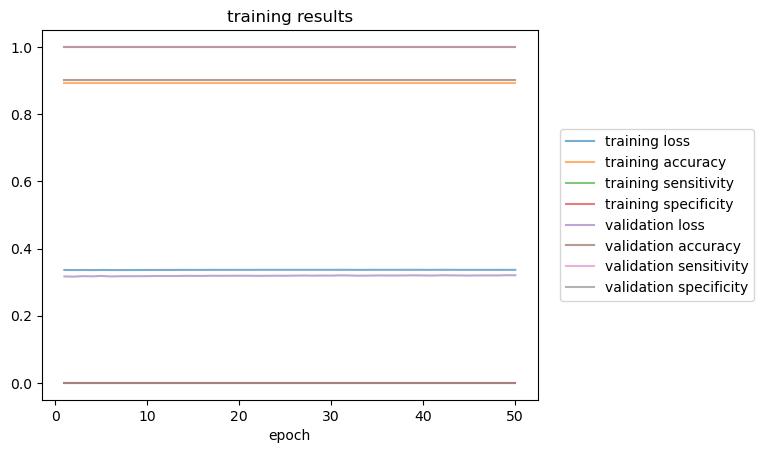

60 1.0 3 5 bce
8.59028172492981
GCN(
  (conv1): GCNConv(60, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2962, Training Accuracy: 0.8623, Training Sensitivity: 0.4926, Training Specificity: 0.9443, Validation Loss: 0.2199, Validation Accuracy: 0.9467, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.2788, Training Accuracy: 0.8677, Training Sensitivity: 0.5502, Training Specificity: 0.9381, Validation Loss: 0.2132, Validation Accuracy: 0.9467, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.2720, Training Accuracy: 0.8720, Training Sensitivity: 0.5741, Training Specificity: 0.9381, Validation Loss: 0.2139, Validation Accuracy: 0.9467, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.2698, Training Accuracy: 0.8707, Training Sensitivity: 0.5669, Training Specificity: 0.93

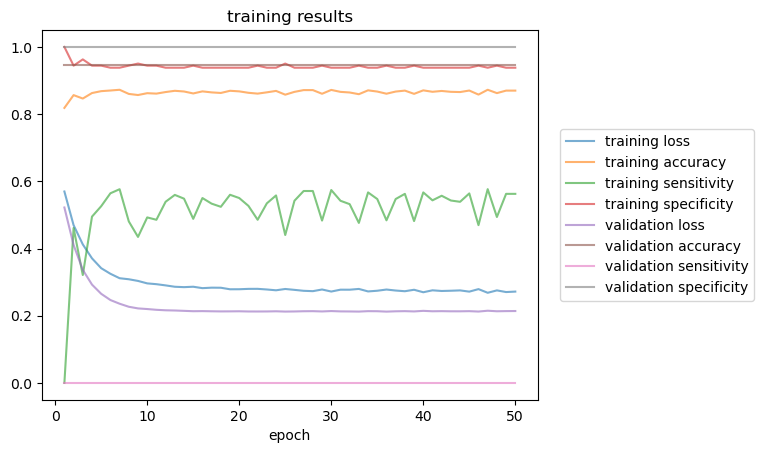

60 1.7987432360493556 3 5 bce
16.631404638290405
GCN(
  (conv1): GCNConv(60, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.4007, Training Accuracy: 0.8483, Training Sensitivity: 0.9402, Training Specificity: 0.7705, Validation Loss: 0.5646, Validation Accuracy: 0.6917, Validation Sensitivity: 0.6039, Validation Specificity: 0.8206
Epoch: 020, Training Loss: 0.3866, Training Accuracy: 0.8799, Training Sensitivity: 0.9337, Training Specificity: 0.8344, Validation Loss: 0.5704, Validation Accuracy: 0.6897, Validation Sensitivity: 0.5754, Validation Specificity: 0.8576
Epoch: 030, Training Loss: 0.3820, Training Accuracy: 0.8794, Training Sensitivity: 0.9057, Training Specificity: 0.8572, Validation Loss: 0.5537, Validation Accuracy: 0.7307, Validation Sensitivity: 0.6471, Validation Specificity: 0.8535
Epoch: 040, Training Loss: 0.3787, Training Accuracy: 0.8804, Training Sensitivity: 0.9067, Training 

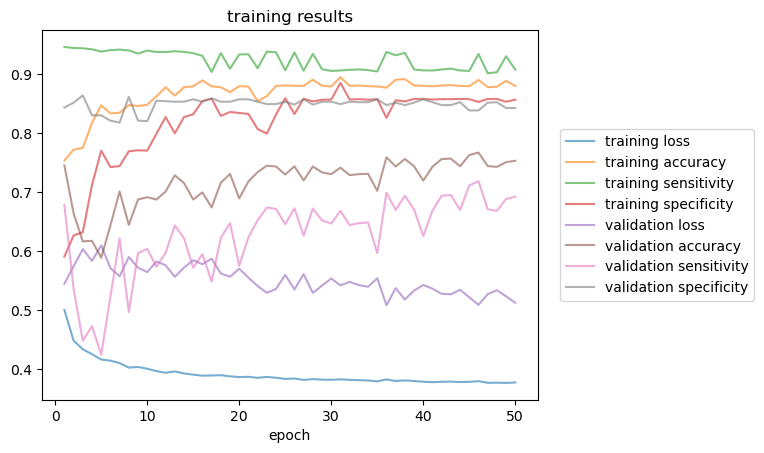

60 2.597486472098711 3 5 bce
20.26640510559082
GCN(
  (conv1): GCNConv(60, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.4037, Training Accuracy: 0.7691, Training Sensitivity: 0.9934, Training Specificity: 0.3949, Validation Loss: 0.6732, Validation Accuracy: 0.6567, Validation Sensitivity: 0.7403, Validation Specificity: 0.4698
Epoch: 020, Training Loss: 0.4030, Training Accuracy: 0.7799, Training Sensitivity: 0.9923, Training Specificity: 0.4258, Validation Loss: 0.6502, Validation Accuracy: 0.6860, Validation Sensitivity: 0.7867, Validation Specificity: 0.4612
Epoch: 030, Training Loss: 0.2940, Training Accuracy: 0.9460, Training Sensitivity: 0.9874, Training Specificity: 0.8768, Validation Loss: 0.7122, Validation Accuracy: 0.6613, Validation Sensitivity: 0.7210, Validation Specificity: 0.5280
Epoch: 040, Training Loss: 0.2667, Training Accuracy: 0.9477, Training Sensitivity: 0.9899, Training Sp

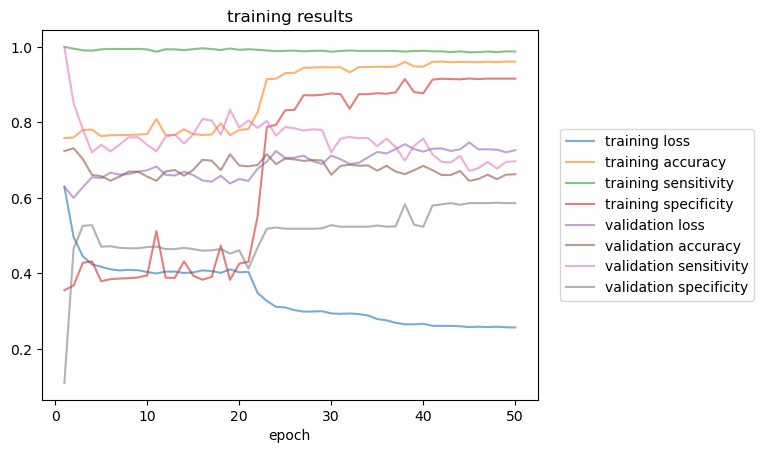

60 3.396229708148067 3 5 bce
29.87344765663147
GCN(
  (conv1): GCNConv(60, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3263, Training Accuracy: 0.9070, Training Sensitivity: 0.9988, Training Specificity: 0.4159, Validation Loss: 0.3424, Validation Accuracy: 0.8750, Validation Sensitivity: 1.0000, Validation Specificity: 0.4444
Epoch: 020, Training Loss: 0.3238, Training Accuracy: 0.9070, Training Sensitivity: 0.9988, Training Specificity: 0.4159, Validation Loss: 0.3422, Validation Accuracy: 0.8750, Validation Sensitivity: 1.0000, Validation Specificity: 0.4444
Epoch: 030, Training Loss: 0.3220, Training Accuracy: 0.9070, Training Sensitivity: 0.9988, Training Specificity: 0.4159, Validation Loss: 0.3427, Validation Accuracy: 0.8757, Validation Sensitivity: 1.0000, Validation Specificity: 0.4474
Epoch: 040, Training Loss: 0.3219, Training Accuracy: 0.9070, Training Sensitivity: 0.9988, Training Sp

In [ ]:
n_train = 500
n_val = 50
n_test = 50
n_epochs = 50
early_stopping_patience = None
t = 10
for max_n_samples_per_graph in [5]:
    for k in [1,3,5]:
        for n in [55,60]:
            results = []
            lamb = np.linspace(1,np.log(n)*2,t)
            for i in range(t):
                print(n,lamb[i],k,max_n_samples_per_graph,'bce')
                t1 = time.time()
                samples = generateSamples_sketch_classification(n_train,n_val,n_test,max_n_samples_per_graph,k,ErdosRenyiGraph,n,lamb[i]/n)
                t2 = time.time()
                print(t2-t1)
                outputs = run(samples,'gcn','bce','adam','cyclic-cosine',n_epochs,early_stopping_patience)
                results.append(outputs[1:])
            with open('ERresults_sketch_n'+str(n)+'_k'+str(k)+'_'+str(max_n_samples_per_graph)+'.pkl', 'wb') as file:
                pickle.dump(np.array(results), file)

In [ ]:
n_train = 500
n_val = 50
n_test = 50
n_epochs = 50
early_stopping_patience = None
t = 10
for max_n_samples_per_graph in [5]:
    for k in [3,5]:
        for n in [15,20,25,30,35,40]:
            results = []
            lamb = np.linspace(1,np.log(n)*2,t)
            for i in range(t):
                print(n,lamb[i],k,max_n_samples_per_graph,'bce')
                t1 = time.time()
                samples = generateSamples_sketch_classification(n_train,n_val,n_test,max_n_samples_per_graph,k,ErdosRenyiGraph,n,lamb[i]/n)
                t2 = time.time()
                print(t2-t1)
                outputs = run(samples,'gcn','bce','adam','cyclic-cosine',n_epochs,early_stopping_patience)
                results.append(outputs[1:])
            with open('ERresults_sketch_n'+str(n)+'_k'+str(k)+'_'+str(max_n_samples_per_graph)+'.pkl', 'wb') as file:
                pickle.dump(np.array(results), file)

15 1.0 5 3 bce
0.8011040687561035
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3017, Training Accuracy: 0.7828, Training Sensitivity: 0.1937, Training Specificity: 0.9222, Validation Loss: 0.6050, Validation Accuracy: 0.8667, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.2764, Training Accuracy: 0.8553, Training Sensitivity: 0.3533, Training Specificity: 0.9741, Validation Loss: 0.7813, Validation Accuracy: 0.8667, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.2515, Training Accuracy: 0.9087, Training Sensitivity: 0.5226, Training Specificity: 1.0000, Validation Loss: 0.8020, Validation Accuracy: 0.8667, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.2421, Training Accuracy: 0.8877, Training Sensitivity: 0.5226, Training Specificity: 0.

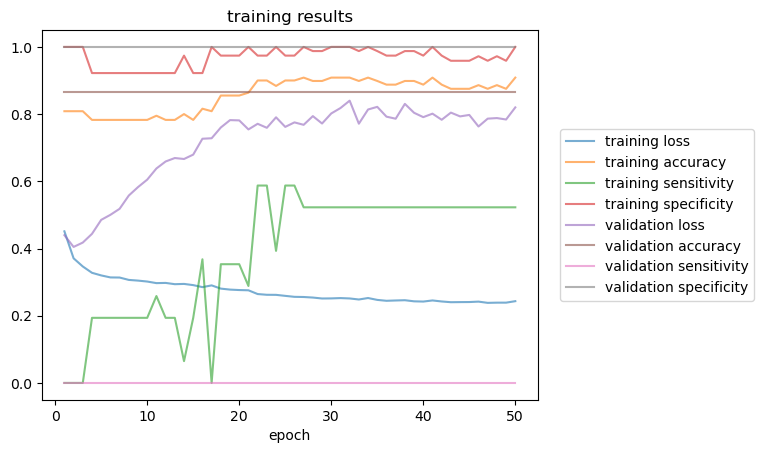

15 1.4906778224671577 5 3 bce
0.8272805213928223
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2524, Training Accuracy: 0.8667, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 2.5044, Validation Accuracy: 0.7720, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.2525, Training Accuracy: 0.8667, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 3.1152, Validation Accuracy: 0.7720, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.2515, Training Accuracy: 0.8667, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 3.4238, Validation Accuracy: 0.7720, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.2511, Training Accuracy: 0.8667, Training Sensitivity: 0.0000, Training 

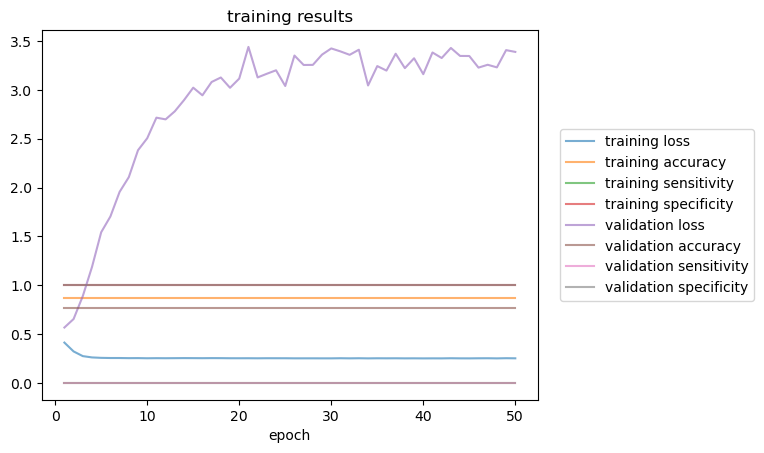

15 1.9813556449343155 5 3 bce
0.8365991115570068
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.6891, Training Accuracy: 0.5452, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.7008, Validation Accuracy: 0.4800, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.6832, Training Accuracy: 0.5452, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.6950, Validation Accuracy: 0.4800, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.6782, Training Accuracy: 0.5452, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.6886, Validation Accuracy: 0.4800, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.6669, Training Accuracy: 0.5452, Training Sensitivity: 1.0000, Training 

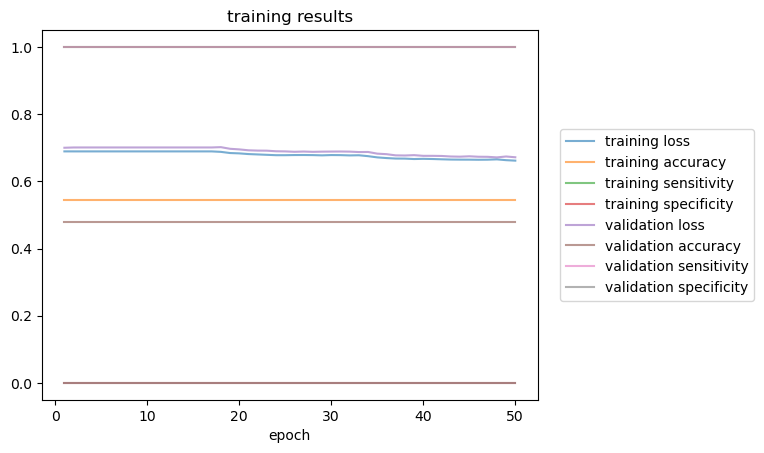

15 2.4720334674014737 5 3 bce
1.1171884536743164
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.4385, Training Accuracy: 0.8205, Training Sensitivity: 1.0000, Training Specificity: 0.5542, Validation Loss: 0.4101, Validation Accuracy: 0.8893, Validation Sensitivity: 1.0000, Validation Specificity: 0.5464
Epoch: 020, Training Loss: 0.4166, Training Accuracy: 0.8205, Training Sensitivity: 1.0000, Training Specificity: 0.5542, Validation Loss: 0.3765, Validation Accuracy: 0.8893, Validation Sensitivity: 1.0000, Validation Specificity: 0.5464
Epoch: 030, Training Loss: 0.3783, Training Accuracy: 0.8205, Training Sensitivity: 1.0000, Training Specificity: 0.5542, Validation Loss: 0.4247, Validation Accuracy: 0.8893, Validation Sensitivity: 1.0000, Validation Specificity: 0.5464
Epoch: 040, Training Loss: 0.2680, Training Accuracy: 0.8493, Training Sensitivity: 1.0000, Training 

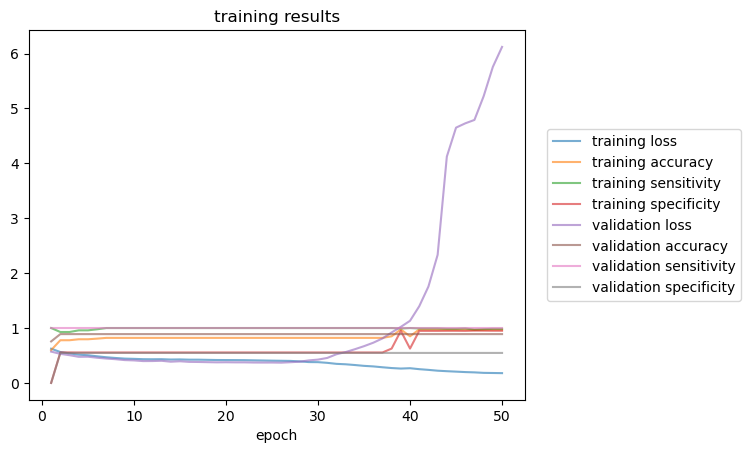

15 2.962711289868631 5 3 bce
1.1418490409851074
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3211, Training Accuracy: 0.8827, Training Sensitivity: 0.9666, Training Specificity: 0.6777, Validation Loss: 0.3223, Validation Accuracy: 0.9040, Validation Sensitivity: 0.9766, Validation Specificity: 0.4771
Epoch: 020, Training Loss: 0.2992, Training Accuracy: 0.9024, Training Sensitivity: 0.9739, Training Specificity: 0.7277, Validation Loss: 0.3217, Validation Accuracy: 0.9040, Validation Sensitivity: 0.9766, Validation Specificity: 0.4771
Epoch: 030, Training Loss: 0.2868, Training Accuracy: 0.9023, Training Sensitivity: 0.9666, Training Specificity: 0.7452, Validation Loss: 0.3227, Validation Accuracy: 0.8973, Validation Sensitivity: 0.9672, Validation Specificity: 0.4862
Epoch: 040, Training Loss: 0.2721, Training Accuracy: 0.9359, Training Sensitivity: 0.9605, Training S

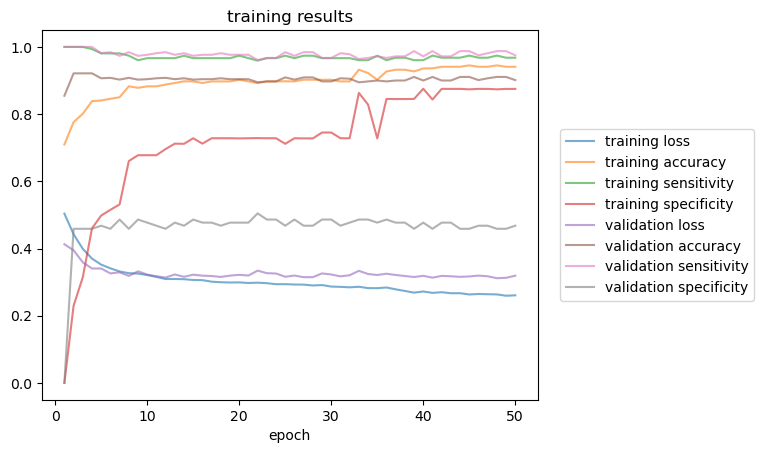

15 3.453389112335789 5 3 bce
1.3430771827697754
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.4866, Training Accuracy: 0.8097, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.5394, Validation Accuracy: 0.7733, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.4866, Training Accuracy: 0.8097, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.5395, Validation Accuracy: 0.7733, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.4866, Training Accuracy: 0.8097, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.5395, Validation Accuracy: 0.7733, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.4866, Training Accuracy: 0.8097, Training Sensitivity: 1.0000, Training S

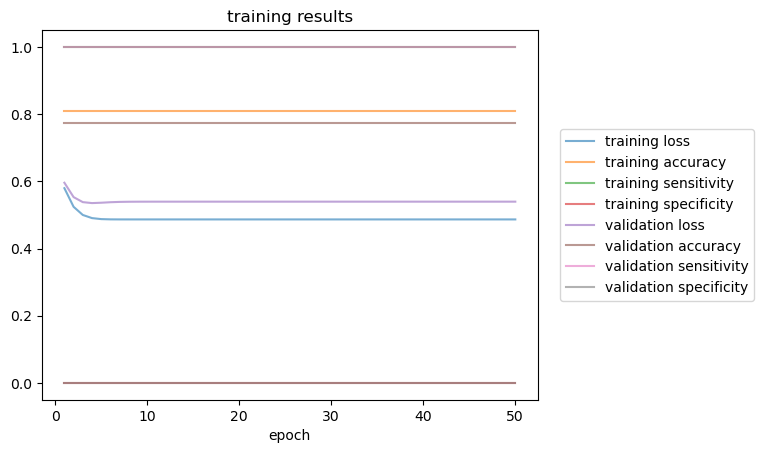

15 3.944066934802947 5 3 bce
1.4339981079101562
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3088, Training Accuracy: 0.9063, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3020, Validation Accuracy: 0.9080, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3072, Training Accuracy: 0.9063, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3035, Validation Accuracy: 0.9080, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3035, Training Accuracy: 0.9063, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3041, Validation Accuracy: 0.9080, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.2969, Training Accuracy: 0.9063, Training Sensitivity: 1.0000, Training S

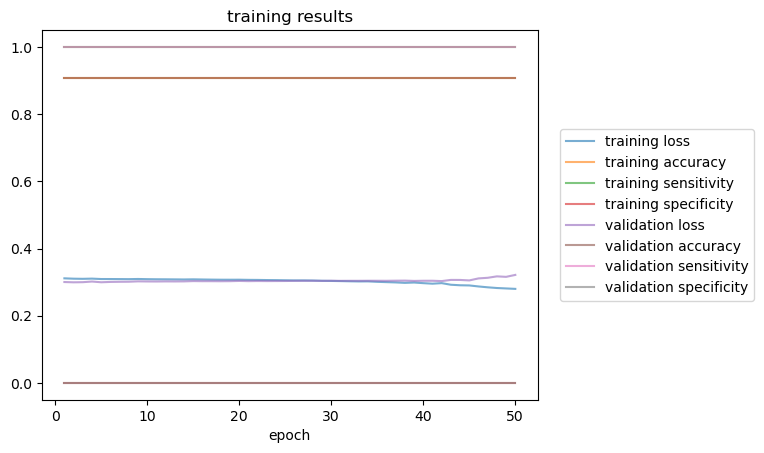

15 4.434744757270105 5 3 bce
1.473691463470459
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2882, Training Accuracy: 0.9129, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.2687, Validation Accuracy: 0.9213, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.2859, Training Accuracy: 0.9129, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.2702, Validation Accuracy: 0.9213, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.2825, Training Accuracy: 0.9129, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.2697, Validation Accuracy: 0.9213, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.2808, Training Accuracy: 0.9129, Training Sensitivity: 1.0000, Training Sp

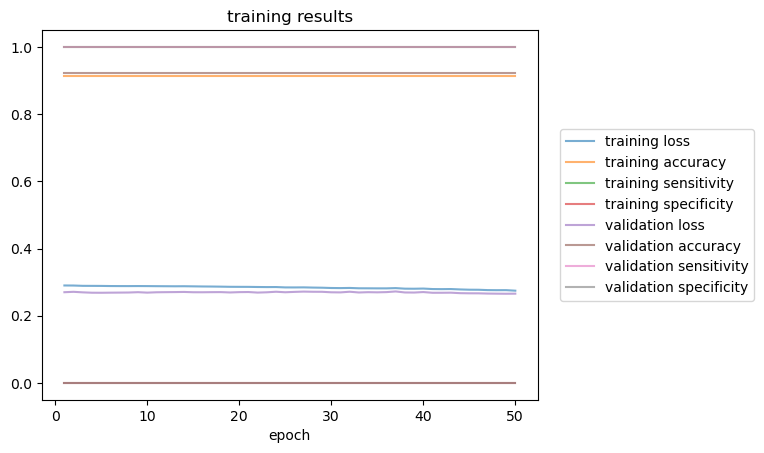

15 4.925422579737262 5 3 bce
1.5245325565338135
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3217, Training Accuracy: 0.9149, Training Sensitivity: 0.9915, Training Specificity: 0.5844, Validation Loss: 0.3069, Validation Accuracy: 0.9067, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3223, Training Accuracy: 0.9080, Training Sensitivity: 0.9915, Training Specificity: 0.5475, Validation Loss: 0.3117, Validation Accuracy: 0.9067, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3146, Training Accuracy: 0.9157, Training Sensitivity: 0.9915, Training Specificity: 0.5887, Validation Loss: 0.3074, Validation Accuracy: 0.9067, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3058, Training Accuracy: 0.9315, Training Sensitivity: 0.9915, Training S

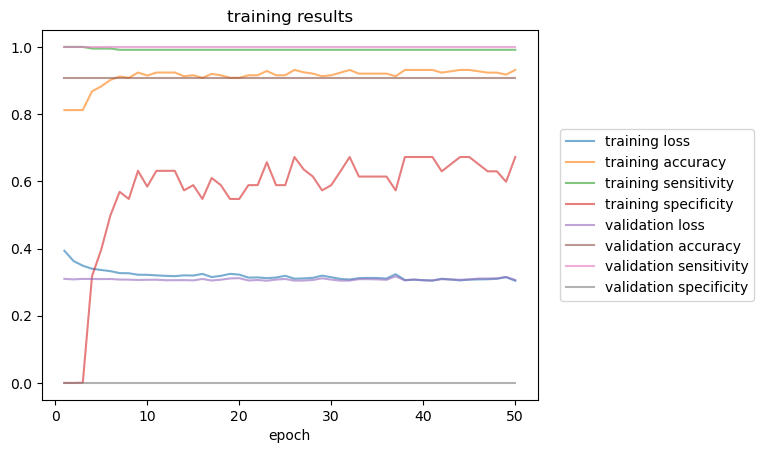

15 5.41610040220442 5 3 bce
1.647411584854126
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3066, Training Accuracy: 0.9068, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.2882, Validation Accuracy: 0.9160, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3069, Training Accuracy: 0.9068, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.2878, Validation Accuracy: 0.9160, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3069, Training Accuracy: 0.9068, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.2889, Validation Accuracy: 0.9160, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3071, Training Accuracy: 0.9068, Training Sensitivity: 1.0000, Training Spe

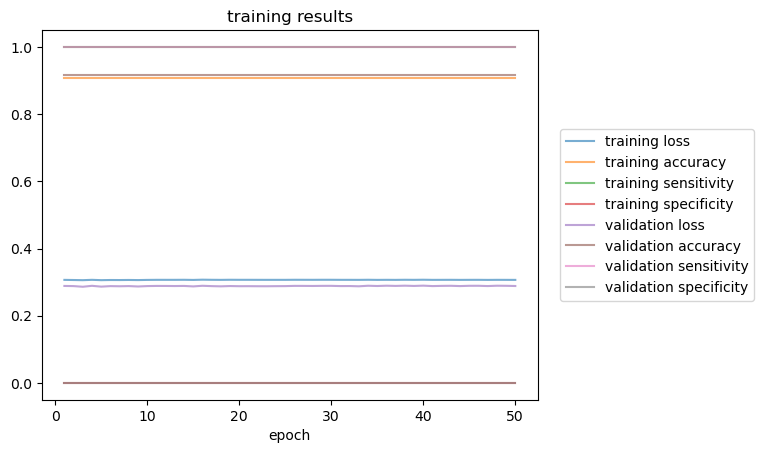

20 1.0 5 3 bce
1.0705060958862305
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3396, Training Accuracy: 0.8679, Training Sensitivity: 0.6578, Training Specificity: 0.9484, Validation Loss: 0.4969, Validation Accuracy: 0.8320, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.3430, Training Accuracy: 0.8505, Training Sensitivity: 0.5949, Training Specificity: 0.9484, Validation Loss: 0.5283, Validation Accuracy: 0.8320, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.3395, Training Accuracy: 0.9089, Training Sensitivity: 0.8061, Training Specificity: 0.9483, Validation Loss: 0.5103, Validation Accuracy: 0.8320, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.3405, Training Accuracy: 0.8591, Training Sensitivity: 0.6260, Training Specificity: 0.

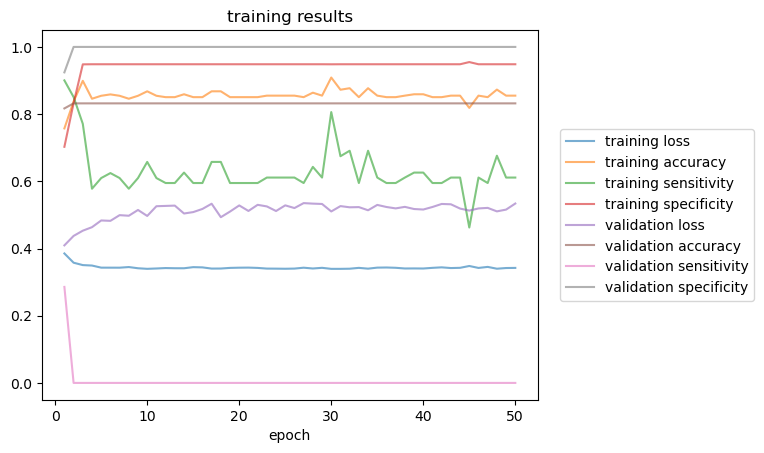

20 1.5546071719008867 5 3 bce
1.6273512840270996
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2173, Training Accuracy: 0.8845, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 1.4280, Validation Accuracy: 0.8610, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.2171, Training Accuracy: 0.8845, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 1.8087, Validation Accuracy: 0.8610, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.2178, Training Accuracy: 0.8845, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 2.6888, Validation Accuracy: 0.8610, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.2146, Training Accuracy: 0.8845, Training Sensitivity: 0.0000, Training 

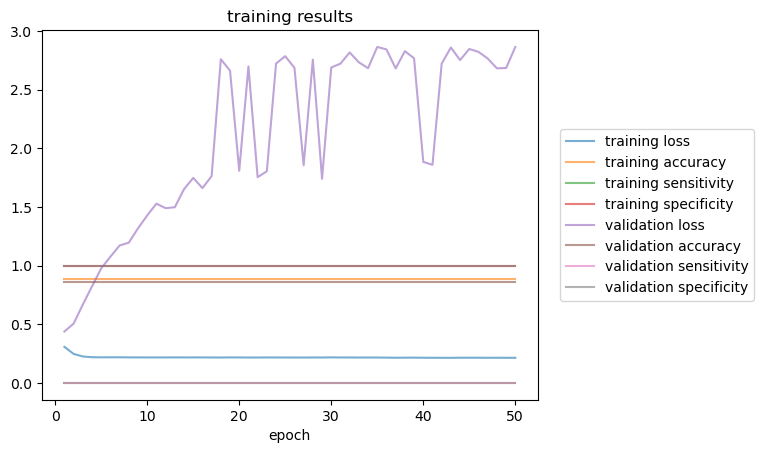

20 2.1092143438017734 5 3 bce
1.5565333366394043
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3524, Training Accuracy: 0.9188, Training Sensitivity: 0.9491, Training Specificity: 0.8739, Validation Loss: 0.4279, Validation Accuracy: 0.8050, Validation Sensitivity: 0.7221, Validation Specificity: 0.9504
Epoch: 020, Training Loss: 0.3344, Training Accuracy: 0.9241, Training Sensitivity: 0.9491, Training Specificity: 0.8870, Validation Loss: 0.4146, Validation Accuracy: 0.8020, Validation Sensitivity: 0.7174, Validation Specificity: 0.9504
Epoch: 030, Training Loss: 0.3314, Training Accuracy: 0.9199, Training Sensitivity: 0.9488, Training Specificity: 0.8771, Validation Loss: 0.4094, Validation Accuracy: 0.8300, Validation Sensitivity: 0.7677, Validation Specificity: 0.9394
Epoch: 040, Training Loss: 0.3286, Training Accuracy: 0.9188, Training Sensitivity: 0.9565, Training 

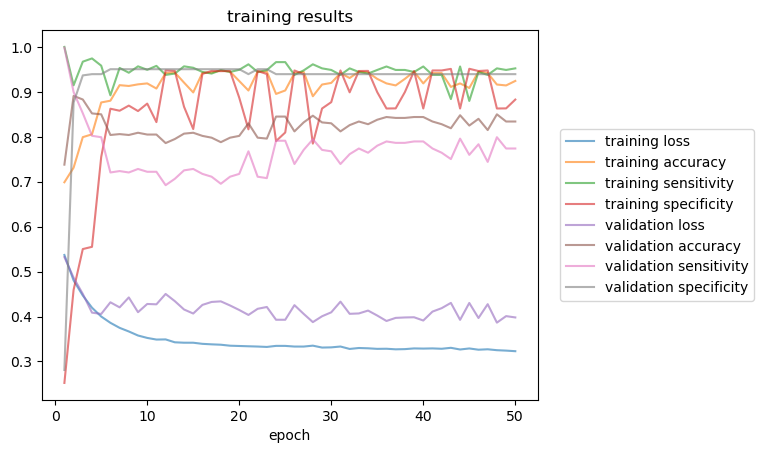

20 2.6638215157026606 5 3 bce
1.6606965065002441
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2036, Training Accuracy: 0.9728, Training Sensitivity: 0.9833, Training Specificity: 0.9575, Validation Loss: 0.6183, Validation Accuracy: 0.6230, Validation Sensitivity: 0.4891, Validation Specificity: 0.7879
Epoch: 020, Training Loss: 0.1937, Training Accuracy: 0.9728, Training Sensitivity: 0.9833, Training Specificity: 0.9575, Validation Loss: 0.6049, Validation Accuracy: 0.6210, Validation Sensitivity: 0.4855, Validation Specificity: 0.7879
Epoch: 030, Training Loss: 0.1888, Training Accuracy: 0.9728, Training Sensitivity: 0.9833, Training Specificity: 0.9575, Validation Loss: 0.6370, Validation Accuracy: 0.6480, Validation Sensitivity: 0.4837, Validation Specificity: 0.8504
Epoch: 040, Training Loss: 0.1863, Training Accuracy: 0.9728, Training Sensitivity: 0.9833, Training 

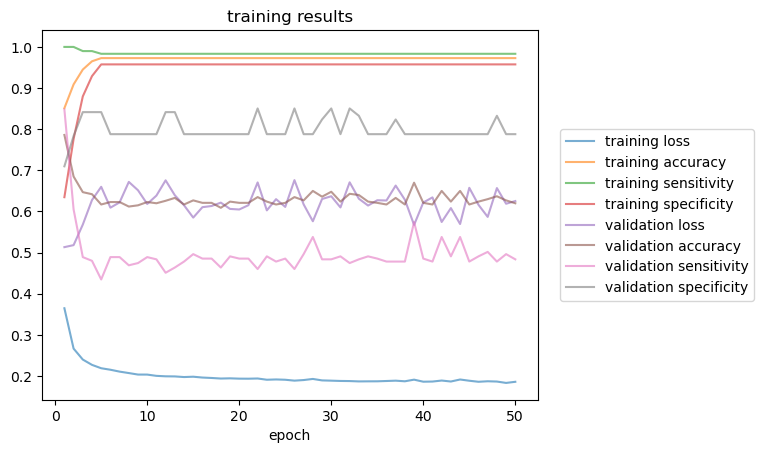

20 3.2184286876035473 5 3 bce
1.9367454051971436
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3212, Training Accuracy: 0.9299, Training Sensitivity: 0.9919, Training Specificity: 0.6897, Validation Loss: 0.3332, Validation Accuracy: 0.9110, Validation Sensitivity: 1.0000, Validation Specificity: 0.3597
Epoch: 020, Training Loss: 0.3037, Training Accuracy: 0.9299, Training Sensitivity: 0.9919, Training Specificity: 0.6897, Validation Loss: 0.3285, Validation Accuracy: 0.9070, Validation Sensitivity: 0.9954, Validation Specificity: 0.3597
Epoch: 030, Training Loss: 0.2987, Training Accuracy: 0.9299, Training Sensitivity: 0.9919, Training Specificity: 0.6897, Validation Loss: 0.3377, Validation Accuracy: 0.9070, Validation Sensitivity: 0.9942, Validation Specificity: 0.3669
Epoch: 040, Training Loss: 0.2962, Training Accuracy: 0.9299, Training Sensitivity: 0.9919, Training 

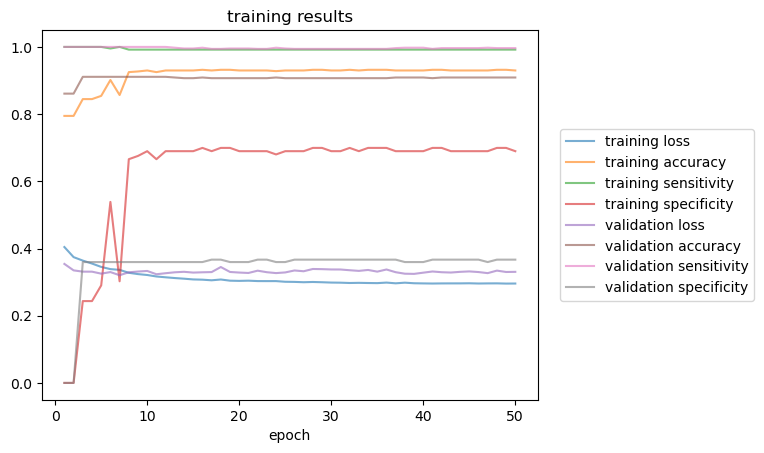

20 3.773035859504434 5 3 bce
2.2419443130493164
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2802, Training Accuracy: 0.9315, Training Sensitivity: 0.9918, Training Specificity: 0.6983, Validation Loss: 0.4055, Validation Accuracy: 0.8280, Validation Sensitivity: 0.9963, Validation Specificity: 0.0663
Epoch: 020, Training Loss: 0.2716, Training Accuracy: 0.9315, Training Sensitivity: 0.9918, Training Specificity: 0.6983, Validation Loss: 0.4248, Validation Accuracy: 0.8230, Validation Sensitivity: 0.9963, Validation Specificity: 0.0387
Epoch: 030, Training Loss: 0.2673, Training Accuracy: 0.9315, Training Sensitivity: 0.9918, Training Specificity: 0.6983, Validation Loss: 0.4362, Validation Accuracy: 0.8230, Validation Sensitivity: 0.9963, Validation Specificity: 0.0387
Epoch: 040, Training Loss: 0.2659, Training Accuracy: 0.9315, Training Sensitivity: 0.9918, Training S

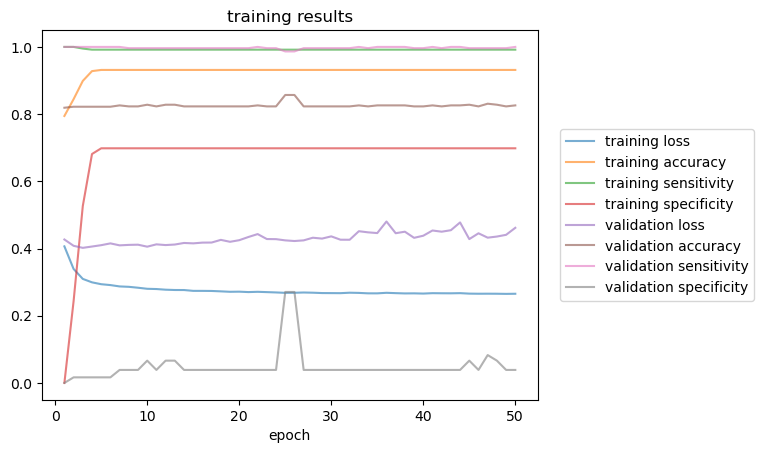

20 4.327643031405321 5 3 bce
2.5955452919006348
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3511, Training Accuracy: 0.8663, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4941, Validation Accuracy: 0.7970, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3528, Training Accuracy: 0.8663, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.5044, Validation Accuracy: 0.7970, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3524, Training Accuracy: 0.8663, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.5100, Validation Accuracy: 0.7970, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3505, Training Accuracy: 0.8663, Training Sensitivity: 1.0000, Training S

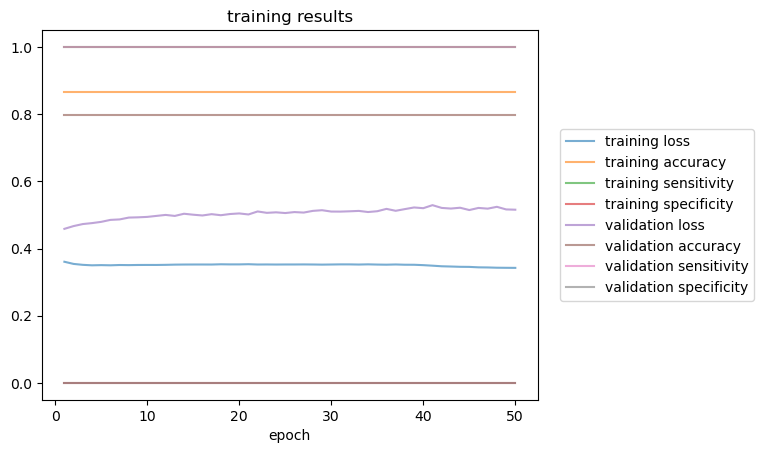

20 4.882250203306208 5 3 bce
2.9702563285827637
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3194, Training Accuracy: 0.9010, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3703, Validation Accuracy: 0.8680, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3197, Training Accuracy: 0.9010, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3791, Validation Accuracy: 0.8680, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3201, Training Accuracy: 0.9010, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3829, Validation Accuracy: 0.8680, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3198, Training Accuracy: 0.9010, Training Sensitivity: 1.0000, Training S

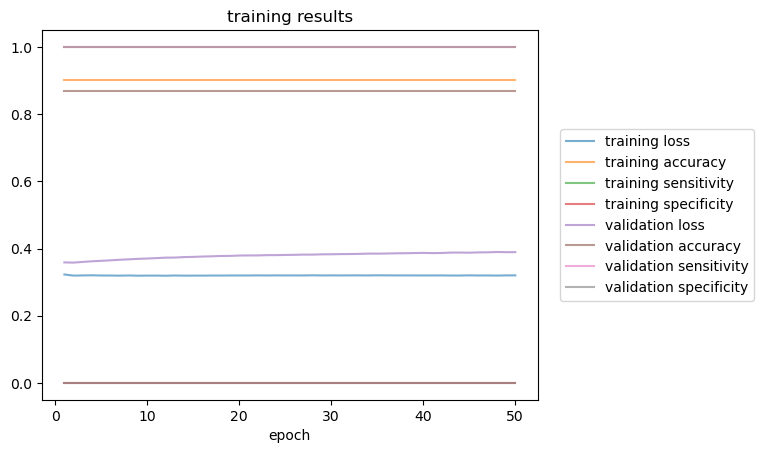

20 5.436857375207095 5 3 bce
2.978073835372925
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3204, Training Accuracy: 0.8692, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.2740, Validation Accuracy: 0.9220, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3161, Training Accuracy: 0.9106, Training Sensitivity: 0.9967, Training Specificity: 0.3387, Validation Loss: 0.2711, Validation Accuracy: 0.9220, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3084, Training Accuracy: 0.9106, Training Sensitivity: 0.9967, Training Specificity: 0.3387, Validation Loss: 0.2705, Validation Accuracy: 0.9220, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3069, Training Accuracy: 0.9134, Training Sensitivity: 0.9967, Training Sp

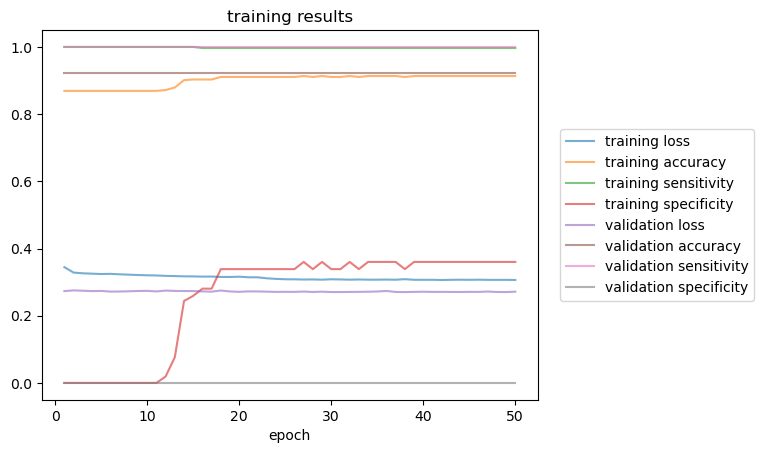

20 5.991464547107982 5 3 bce
3.3636012077331543
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3198, Training Accuracy: 0.9005, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3235, Validation Accuracy: 0.8980, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3186, Training Accuracy: 0.9005, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3233, Validation Accuracy: 0.8980, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3182, Training Accuracy: 0.9005, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3247, Validation Accuracy: 0.8980, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3161, Training Accuracy: 0.9005, Training Sensitivity: 1.0000, Training S

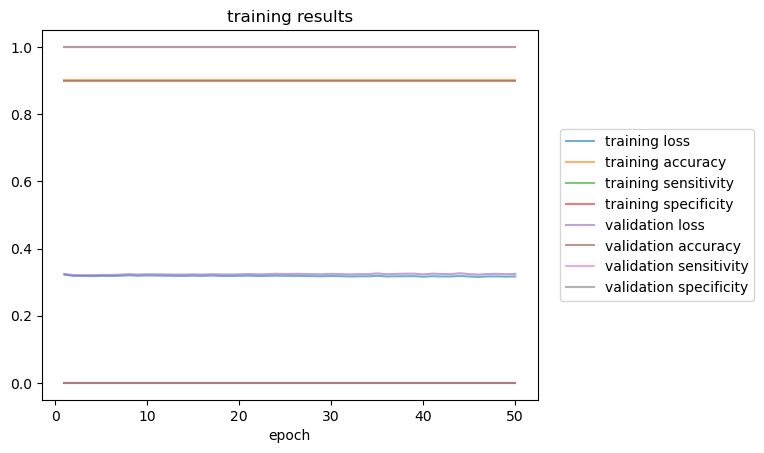

25 1.0 5 3 bce
1.9361560344696045
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.1538, Training Accuracy: 0.9200, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 1.2883, Validation Accuracy: 0.8936, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.1538, Training Accuracy: 0.9200, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 5.0582, Validation Accuracy: 0.8936, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.1537, Training Accuracy: 0.9200, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 6.5338, Validation Accuracy: 0.8936, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.1536, Training Accuracy: 0.9200, Training Sensitivity: 0.0000, Training Specificity: 1.

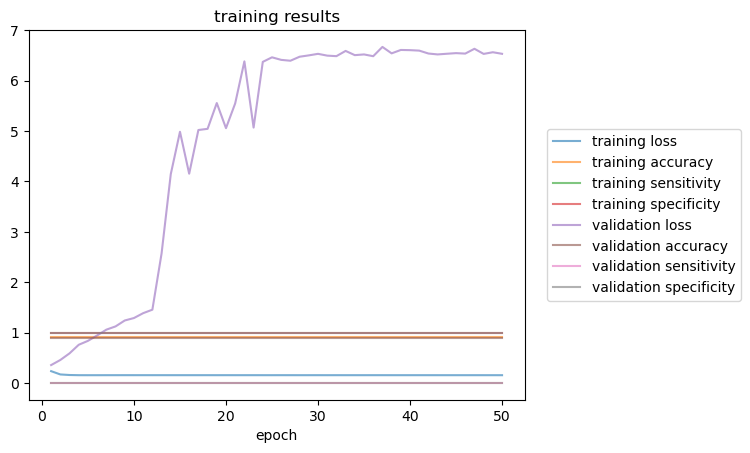

25 1.6041946277484889 5 3 bce
2.203544855117798
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2474, Training Accuracy: 0.9335, Training Sensitivity: 0.9281, Training Specificity: 0.9387, Validation Loss: 1.0250, Validation Accuracy: 0.5136, Validation Sensitivity: 0.2017, Validation Specificity: 0.9093
Epoch: 020, Training Loss: 0.2206, Training Accuracy: 0.9399, Training Sensitivity: 0.9282, Training Specificity: 0.9510, Validation Loss: 1.1198, Validation Accuracy: 0.5448, Validation Sensitivity: 0.2575, Validation Specificity: 0.9093
Epoch: 030, Training Loss: 0.2239, Training Accuracy: 0.9455, Training Sensitivity: 0.9065, Training Specificity: 0.9824, Validation Loss: 1.1585, Validation Accuracy: 0.5432, Validation Sensitivity: 0.2546, Validation Specificity: 0.9093
Epoch: 040, Training Loss: 0.2004, Training Accuracy: 0.9547, Training Sensitivity: 0.9256, Training S

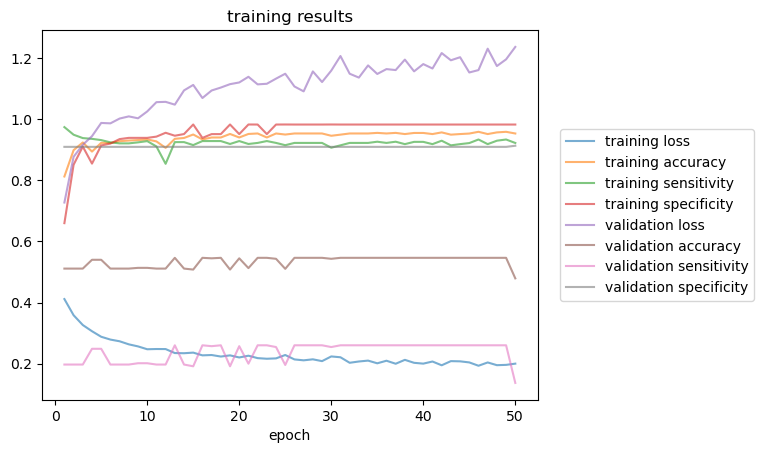

25 2.2083892554969777 5 3 bce
2.5716392993927
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3194, Training Accuracy: 0.9202, Training Sensitivity: 0.9944, Training Specificity: 0.6944, Validation Loss: 0.7295, Validation Accuracy: 0.7112, Validation Sensitivity: 0.8966, Validation Specificity: 0.5116
Epoch: 020, Training Loss: 0.3046, Training Accuracy: 0.9375, Training Sensitivity: 0.9889, Training Specificity: 0.7808, Validation Loss: 0.7278, Validation Accuracy: 0.7064, Validation Sensitivity: 0.8843, Validation Specificity: 0.5150
Epoch: 030, Training Loss: 0.3014, Training Accuracy: 0.9382, Training Sensitivity: 0.9921, Training Specificity: 0.7740, Validation Loss: 0.7578, Validation Accuracy: 0.7080, Validation Sensitivity: 0.8873, Validation Specificity: 0.5150
Epoch: 040, Training Loss: 0.3008, Training Accuracy: 0.9399, Training Sensitivity: 0.9921, Training Spe

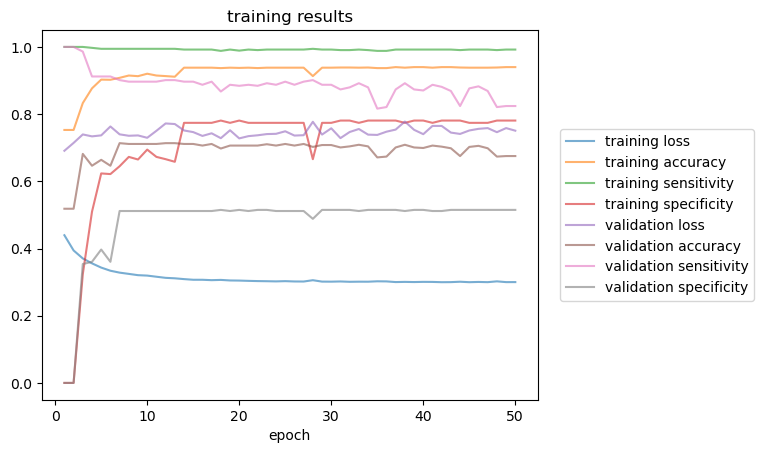

25 2.812583883245467 5 3 bce
2.955212116241455
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2063, Training Accuracy: 0.9582, Training Sensitivity: 0.9943, Training Specificity: 0.8795, Validation Loss: 0.4106, Validation Accuracy: 0.8536, Validation Sensitivity: 0.9264, Validation Specificity: 0.6346
Epoch: 020, Training Loss: 0.1980, Training Accuracy: 0.9582, Training Sensitivity: 0.9943, Training Specificity: 0.8795, Validation Loss: 0.4268, Validation Accuracy: 0.8536, Validation Sensitivity: 0.9264, Validation Specificity: 0.6346
Epoch: 030, Training Loss: 0.1970, Training Accuracy: 0.9582, Training Sensitivity: 0.9943, Training Specificity: 0.8795, Validation Loss: 0.4224, Validation Accuracy: 0.8576, Validation Sensitivity: 0.9318, Validation Specificity: 0.6346
Epoch: 040, Training Loss: 0.1950, Training Accuracy: 0.9582, Training Sensitivity: 0.9943, Training Sp

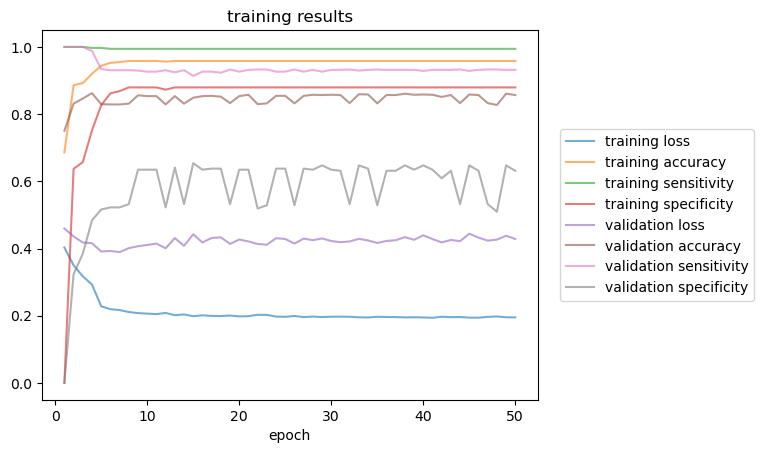

25 3.416778510993956 5 3 bce
3.835968255996704
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3486, Training Accuracy: 0.8450, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4919, Validation Accuracy: 0.8216, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3396, Training Accuracy: 0.8499, Training Sensitivity: 1.0000, Training Specificity: 0.0320, Validation Loss: 0.4968, Validation Accuracy: 0.8216, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3356, Training Accuracy: 0.8730, Training Sensitivity: 0.9974, Training Specificity: 0.1945, Validation Loss: 0.5261, Validation Accuracy: 0.8216, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3247, Training Accuracy: 0.9080, Training Sensitivity: 0.9956, Training Sp

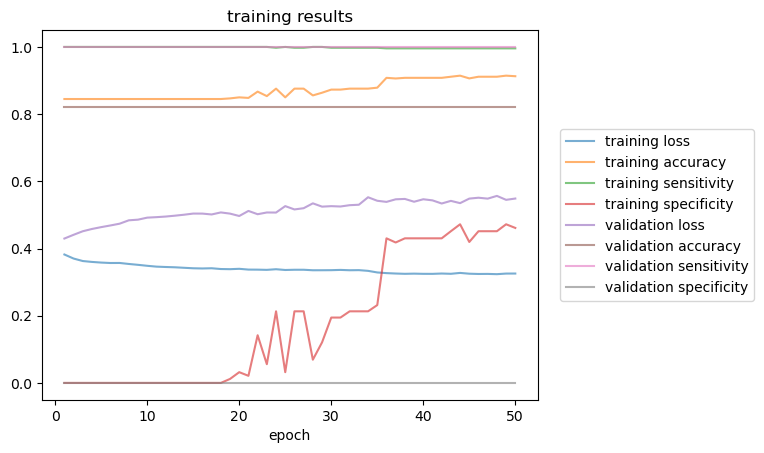

25 4.020973138742445 5 3 bce
4.264955043792725
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3060, Training Accuracy: 0.9221, Training Sensitivity: 0.9932, Training Specificity: 0.6074, Validation Loss: 0.3528, Validation Accuracy: 0.8912, Validation Sensitivity: 0.9982, Validation Specificity: 0.0074
Epoch: 020, Training Loss: 0.2944, Training Accuracy: 0.9246, Training Sensitivity: 0.9932, Training Specificity: 0.6208, Validation Loss: 0.3478, Validation Accuracy: 0.8912, Validation Sensitivity: 0.9982, Validation Specificity: 0.0074
Epoch: 030, Training Loss: 0.2923, Training Accuracy: 0.9246, Training Sensitivity: 0.9932, Training Specificity: 0.6208, Validation Loss: 0.3499, Validation Accuracy: 0.8848, Validation Sensitivity: 0.9910, Validation Specificity: 0.0074
Epoch: 040, Training Loss: 0.2871, Training Accuracy: 0.9246, Training Sensitivity: 0.9932, Training Sp

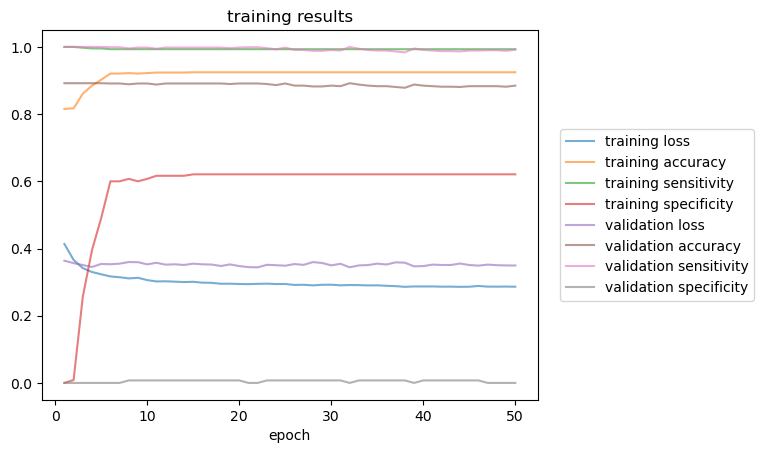

25 4.625167766490934 5 3 bce
4.769484043121338
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2967, Training Accuracy: 0.9089, Training Sensitivity: 1.0000, Training Specificity: 0.3051, Validation Loss: 0.2907, Validation Accuracy: 0.9144, Validation Sensitivity: 1.0000, Validation Specificity: 0.3185
Epoch: 020, Training Loss: 0.2966, Training Accuracy: 0.9089, Training Sensitivity: 1.0000, Training Specificity: 0.3051, Validation Loss: 0.2915, Validation Accuracy: 0.9144, Validation Sensitivity: 1.0000, Validation Specificity: 0.3185
Epoch: 030, Training Loss: 0.2966, Training Accuracy: 0.9089, Training Sensitivity: 1.0000, Training Specificity: 0.3051, Validation Loss: 0.2915, Validation Accuracy: 0.9144, Validation Sensitivity: 1.0000, Validation Specificity: 0.3185
Epoch: 040, Training Loss: 0.2966, Training Accuracy: 0.9089, Training Sensitivity: 1.0000, Training Sp

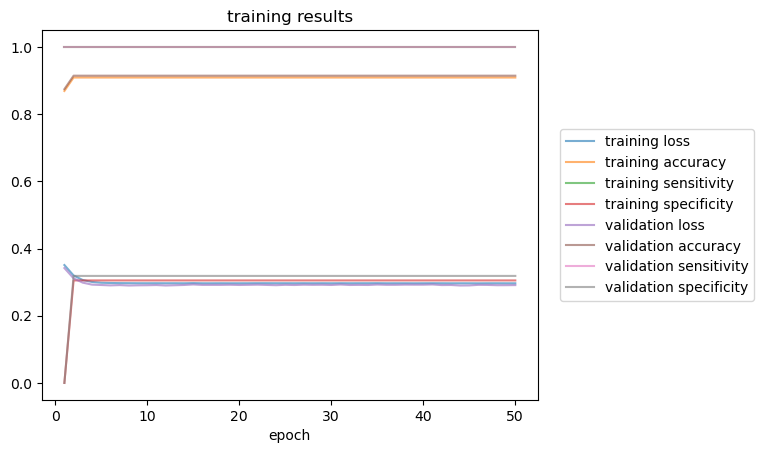

25 5.2293623942394225 5 3 bce
5.160149097442627
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3190, Training Accuracy: 0.9005, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3721, Validation Accuracy: 0.8696, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3192, Training Accuracy: 0.9005, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3785, Validation Accuracy: 0.8696, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3184, Training Accuracy: 0.9005, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3829, Validation Accuracy: 0.8696, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3170, Training Accuracy: 0.9005, Training Sensitivity: 1.0000, Training S

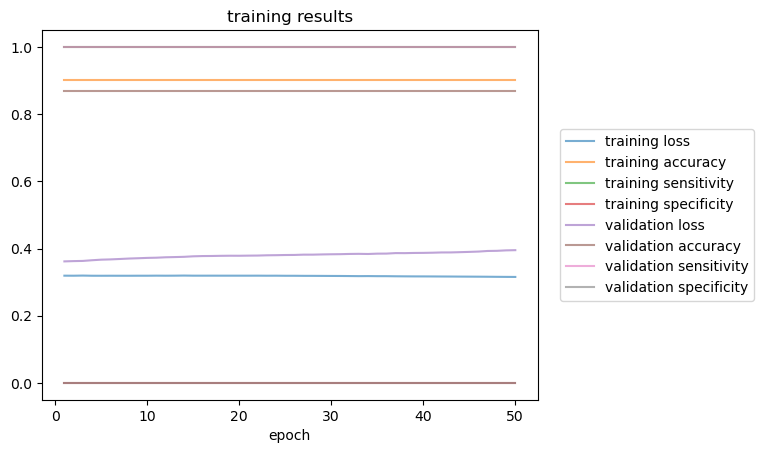

25 5.833557021987912 5 3 bce
5.408011198043823
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3299, Training Accuracy: 0.8957, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3096, Validation Accuracy: 0.9056, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3295, Training Accuracy: 0.8957, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3104, Validation Accuracy: 0.9056, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3293, Training Accuracy: 0.8957, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3114, Validation Accuracy: 0.9056, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3282, Training Accuracy: 0.8957, Training Sensitivity: 1.0000, Training Sp

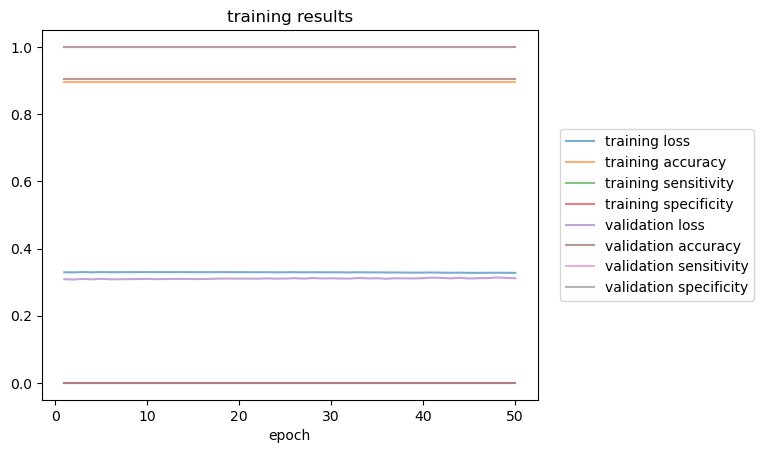

25 6.437751649736401 5 3 bce
6.207882642745972
GCN(
  (conv1): GCNConv(25, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3249, Training Accuracy: 0.8982, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3563, Validation Accuracy: 0.8760, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3254, Training Accuracy: 0.8982, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3635, Validation Accuracy: 0.8760, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3257, Training Accuracy: 0.8982, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3657, Validation Accuracy: 0.8760, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3258, Training Accuracy: 0.8982, Training Sensitivity: 1.0000, Training Sp

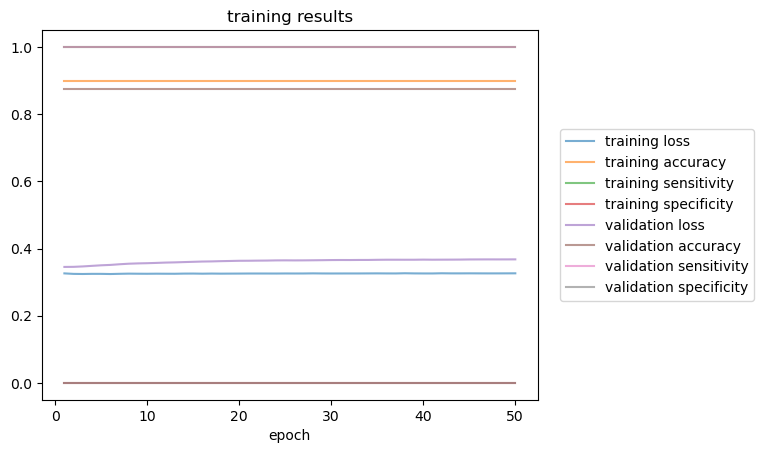

30 1.0 5 3 bce
2.430863618850708
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3180, Training Accuracy: 0.8351, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.3666, Validation Accuracy: 0.9333, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.3123, Training Accuracy: 0.8351, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.4973, Validation Accuracy: 0.9333, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.3109, Training Accuracy: 0.8351, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.5540, Validation Accuracy: 0.9333, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.3104, Training Accuracy: 0.8351, Training Sensitivity: 0.0000, Training Specificity: 1.0

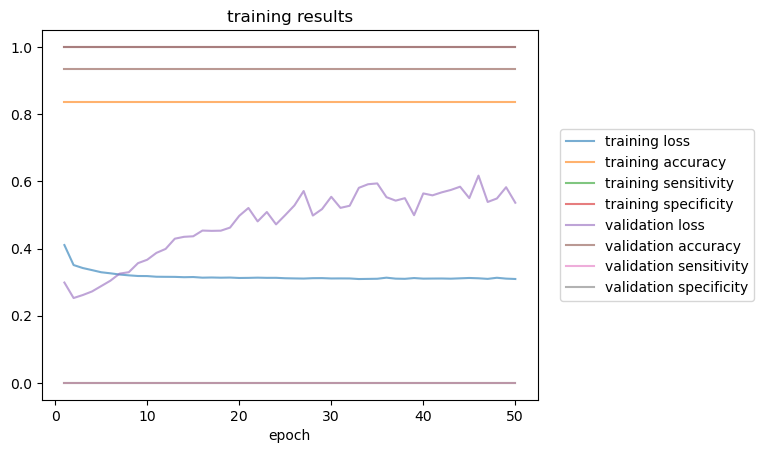

30 1.6447105292582567 5 3 bce
3.1876089572906494
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.4258, Training Accuracy: 0.8443, Training Sensitivity: 0.7791, Training Specificity: 0.8896, Validation Loss: 0.7923, Validation Accuracy: 0.5233, Validation Sensitivity: 0.2924, Validation Specificity: 0.8897
Epoch: 020, Training Loss: 0.4184, Training Accuracy: 0.8499, Training Sensitivity: 0.8048, Training Specificity: 0.8813, Validation Loss: 0.7695, Validation Accuracy: 0.5273, Validation Sensitivity: 0.2989, Validation Specificity: 0.8897
Epoch: 030, Training Loss: 0.4163, Training Accuracy: 0.8383, Training Sensitivity: 0.7638, Training Specificity: 0.8901, Validation Loss: 0.7674, Validation Accuracy: 0.5253, Validation Sensitivity: 0.3391, Validation Specificity: 0.8207
Epoch: 040, Training Loss: 0.4081, Training Accuracy: 0.8343, Training Sensitivity: 0.7402, Training 

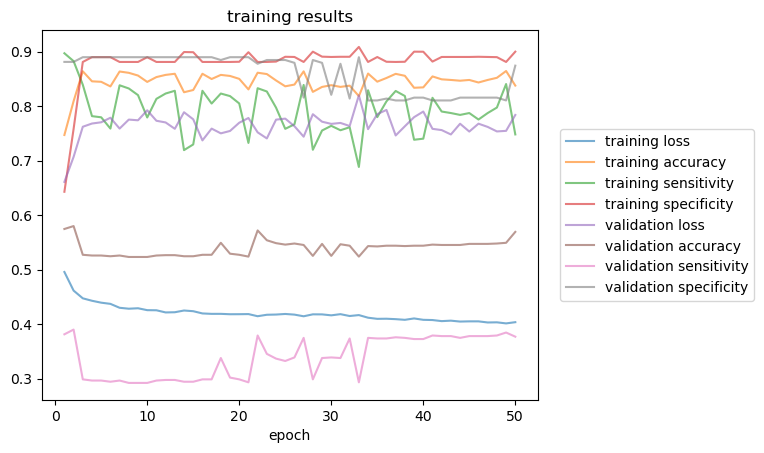

30 2.2894210585165133 5 3 bce
4.467085361480713
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3626, Training Accuracy: 0.8848, Training Sensitivity: 0.9393, Training Specificity: 0.7415, Validation Loss: 0.5073, Validation Accuracy: 0.8013, Validation Sensitivity: 0.8427, Validation Specificity: 0.7278
Epoch: 020, Training Loss: 0.3547, Training Accuracy: 0.8873, Training Sensitivity: 0.9457, Training Specificity: 0.7340, Validation Loss: 0.4908, Validation Accuracy: 0.8447, Validation Sensitivity: 0.9302, Validation Specificity: 0.6926
Epoch: 030, Training Loss: 0.3514, Training Accuracy: 0.9058, Training Sensitivity: 0.9418, Training Specificity: 0.8112, Validation Loss: 0.4902, Validation Accuracy: 0.8193, Validation Sensitivity: 0.8802, Validation Specificity: 0.7111
Epoch: 040, Training Loss: 0.3516, Training Accuracy: 0.9045, Training Sensitivity: 0.9401, Training S

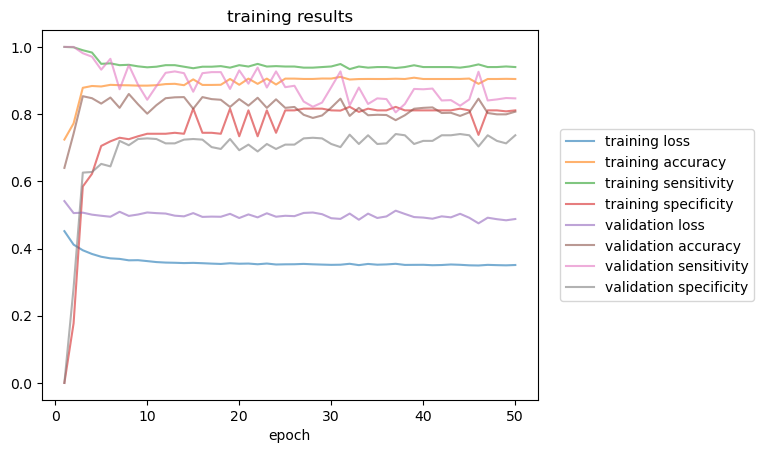

30 2.9341315877747705 5 3 bce
4.841303586959839
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3039, Training Accuracy: 0.9345, Training Sensitivity: 0.9943, Training Specificity: 0.7264, Validation Loss: 0.4273, Validation Accuracy: 0.7873, Validation Sensitivity: 0.8415, Validation Specificity: 0.6913
Epoch: 020, Training Loss: 0.2966, Training Accuracy: 0.9345, Training Sensitivity: 0.9943, Training Specificity: 0.7264, Validation Loss: 0.4163, Validation Accuracy: 0.7867, Validation Sensitivity: 0.7946, Validation Specificity: 0.7726
Epoch: 030, Training Loss: 0.2923, Training Accuracy: 0.9345, Training Sensitivity: 0.9943, Training Specificity: 0.7264, Validation Loss: 0.4304, Validation Accuracy: 0.8007, Validation Sensitivity: 0.8342, Validation Specificity: 0.7412
Epoch: 040, Training Loss: 0.2910, Training Accuracy: 0.9345, Training Sensitivity: 0.9943, Training S

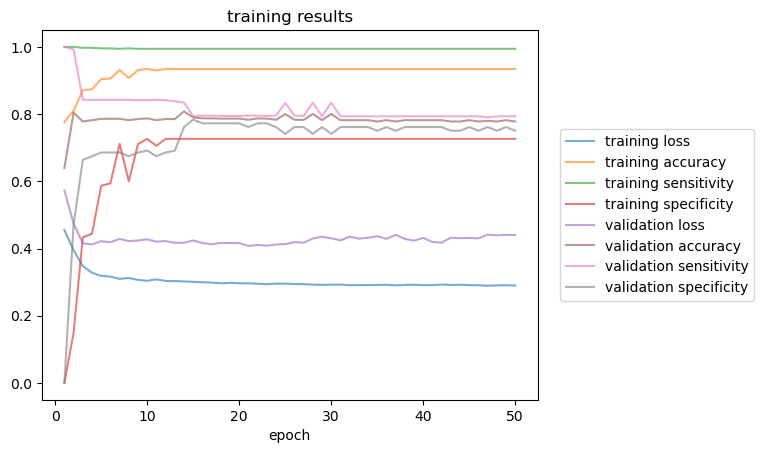

30 3.578842117033027 5 3 bce
4.949829578399658
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2877, Training Accuracy: 0.9295, Training Sensitivity: 0.9684, Training Specificity: 0.8271, Validation Loss: 0.4777, Validation Accuracy: 0.7947, Validation Sensitivity: 0.8702, Validation Specificity: 0.4346
Epoch: 020, Training Loss: 0.2735, Training Accuracy: 0.9190, Training Sensitivity: 0.9489, Training Specificity: 0.8404, Validation Loss: 0.5090, Validation Accuracy: 0.7847, Validation Sensitivity: 0.8581, Validation Specificity: 0.4346
Epoch: 030, Training Loss: 0.2652, Training Accuracy: 0.9387, Training Sensitivity: 0.9822, Training Specificity: 0.8245, Validation Loss: 0.4722, Validation Accuracy: 0.7980, Validation Sensitivity: 0.8742, Validation Specificity: 0.4346
Epoch: 040, Training Loss: 0.2628, Training Accuracy: 0.9400, Training Sensitivity: 0.9839, Training Sp

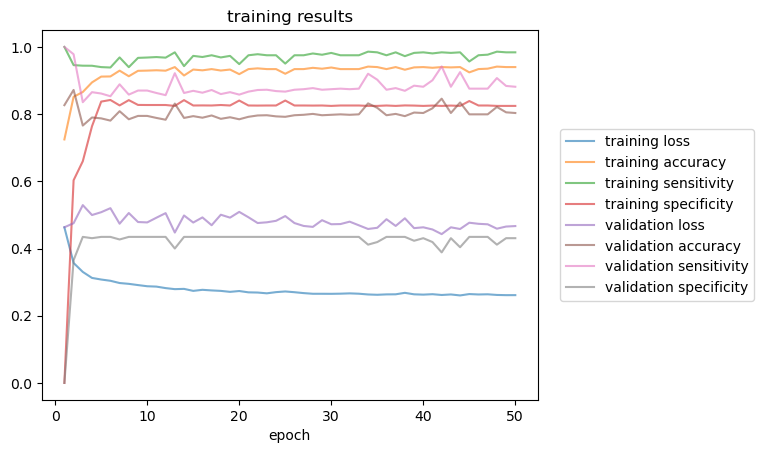

30 4.223552646291283 5 3 bce
5.703704595565796
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2644, Training Accuracy: 0.9271, Training Sensitivity: 0.9982, Training Specificity: 0.6486, Validation Loss: 0.3644, Validation Accuracy: 0.8693, Validation Sensitivity: 1.0000, Validation Specificity: 0.0200
Epoch: 020, Training Loss: 0.2606, Training Accuracy: 0.9271, Training Sensitivity: 0.9982, Training Specificity: 0.6486, Validation Loss: 0.3612, Validation Accuracy: 0.8713, Validation Sensitivity: 1.0000, Validation Specificity: 0.0350
Epoch: 030, Training Loss: 0.2604, Training Accuracy: 0.9271, Training Sensitivity: 0.9982, Training Specificity: 0.6486, Validation Loss: 0.3582, Validation Accuracy: 0.8713, Validation Sensitivity: 1.0000, Validation Specificity: 0.0350
Epoch: 040, Training Loss: 0.2604, Training Accuracy: 0.9271, Training Sensitivity: 0.9982, Training Sp

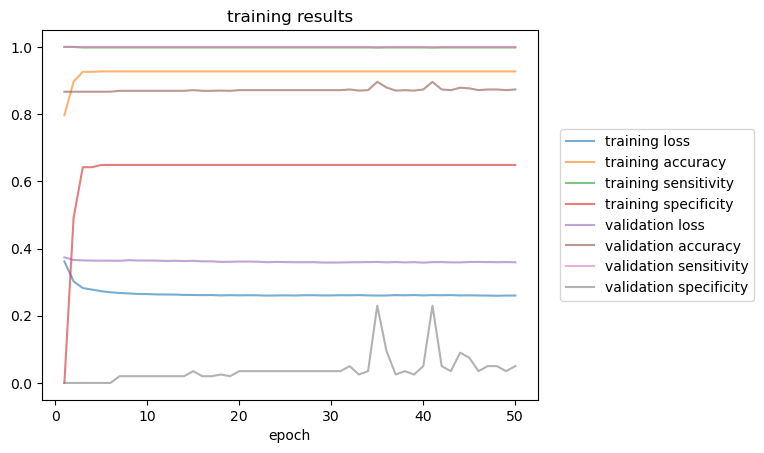

30 4.868263175549541 5 3 bce
7.088177442550659
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3206, Training Accuracy: 0.8986, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3880, Validation Accuracy: 0.8700, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3202, Training Accuracy: 0.8986, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3944, Validation Accuracy: 0.8700, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3199, Training Accuracy: 0.8986, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3975, Validation Accuracy: 0.8700, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3189, Training Accuracy: 0.8986, Training Sensitivity: 1.0000, Training Sp

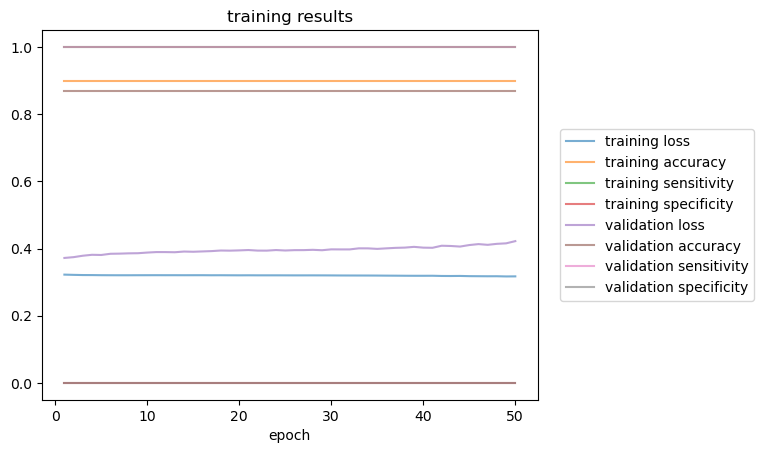

30 5.512973704807798 5 3 bce
7.279437303543091
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3237, Training Accuracy: 0.8869, Training Sensitivity: 1.0000, Training Specificity: 0.1045, Validation Loss: 0.3079, Validation Accuracy: 0.9073, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3212, Training Accuracy: 0.9031, Training Sensitivity: 0.9991, Training Specificity: 0.2396, Validation Loss: 0.3085, Validation Accuracy: 0.9073, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3186, Training Accuracy: 0.9041, Training Sensitivity: 0.9991, Training Specificity: 0.2475, Validation Loss: 0.3101, Validation Accuracy: 0.9073, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3166, Training Accuracy: 0.9041, Training Sensitivity: 0.9991, Training Sp

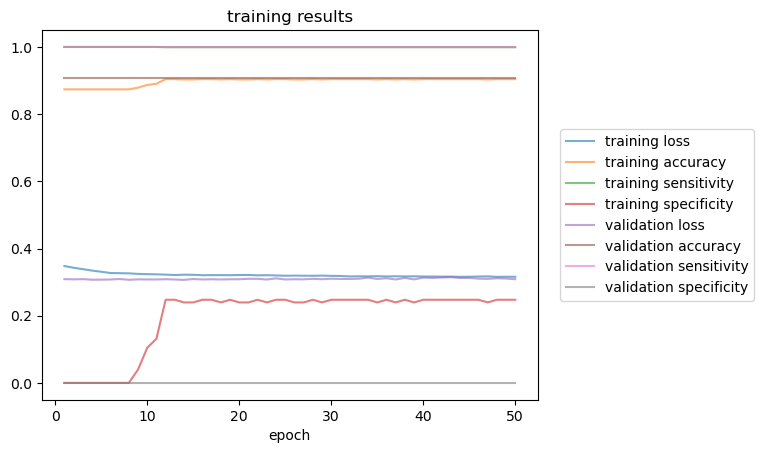

30 6.157684234066054 5 3 bce
7.336616039276123
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3249, Training Accuracy: 0.8981, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3453, Validation Accuracy: 0.8907, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3253, Training Accuracy: 0.8981, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3460, Validation Accuracy: 0.8907, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3251, Training Accuracy: 0.8981, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3458, Validation Accuracy: 0.8907, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3246, Training Accuracy: 0.8981, Training Sensitivity: 1.0000, Training Sp

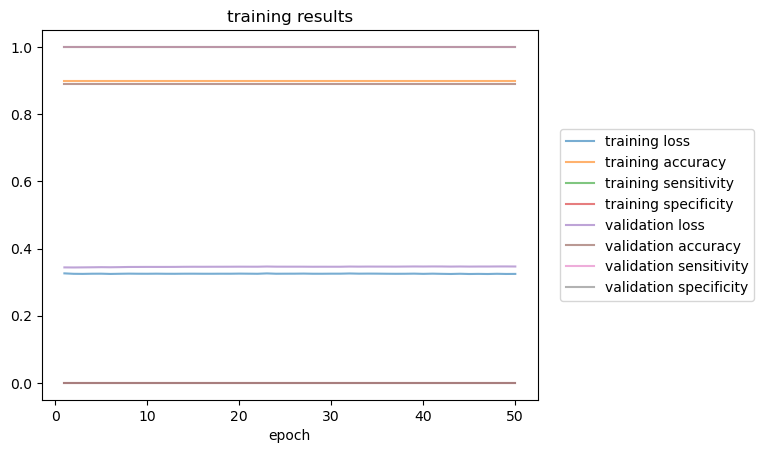

30 6.802394763324311 5 3 bce
8.53986120223999
GCN(
  (conv1): GCNConv(30, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3264, Training Accuracy: 0.8970, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3145, Validation Accuracy: 0.9047, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3266, Training Accuracy: 0.8970, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3143, Validation Accuracy: 0.9047, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3269, Training Accuracy: 0.8970, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3149, Validation Accuracy: 0.9047, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3263, Training Accuracy: 0.8970, Training Sensitivity: 1.0000, Training Spe

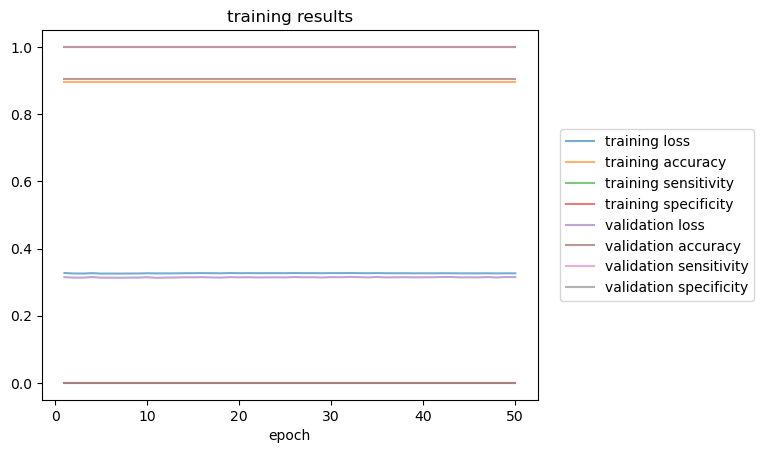

35 1.0 5 3 bce
3.3007824420928955
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.1974, Training Accuracy: 0.8654, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 2.1098, Validation Accuracy: 0.8114, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.1973, Training Accuracy: 0.8654, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 4.8771, Validation Accuracy: 0.8114, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.1974, Training Accuracy: 0.8654, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 7.1283, Validation Accuracy: 0.8114, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.1972, Training Accuracy: 0.8654, Training Sensitivity: 0.0000, Training Specificity: 1.

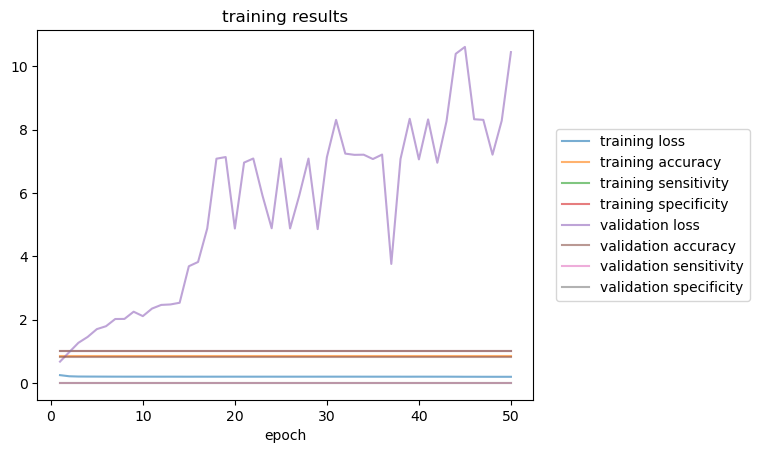

35 1.6789662358865365 5 3 bce
3.5279502868652344
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.1746, Training Accuracy: 0.9323, Training Sensitivity: 0.8953, Training Specificity: 0.9547, Validation Loss: 0.5069, Validation Accuracy: 0.7514, Validation Sensitivity: 0.6861, Validation Specificity: 0.7903
Epoch: 020, Training Loss: 0.1626, Training Accuracy: 0.9323, Training Sensitivity: 0.8953, Training Specificity: 0.9547, Validation Loss: 0.5125, Validation Accuracy: 0.7566, Validation Sensitivity: 0.7213, Validation Specificity: 0.7776
Epoch: 030, Training Loss: 0.1550, Training Accuracy: 0.9354, Training Sensitivity: 0.8953, Training Specificity: 0.9596, Validation Loss: 0.5020, Validation Accuracy: 0.7526, Validation Sensitivity: 0.6907, Validation Specificity: 0.7894
Epoch: 040, Training Loss: 0.1536, Training Accuracy: 0.9354, Training Sensitivity: 0.8953, Training 

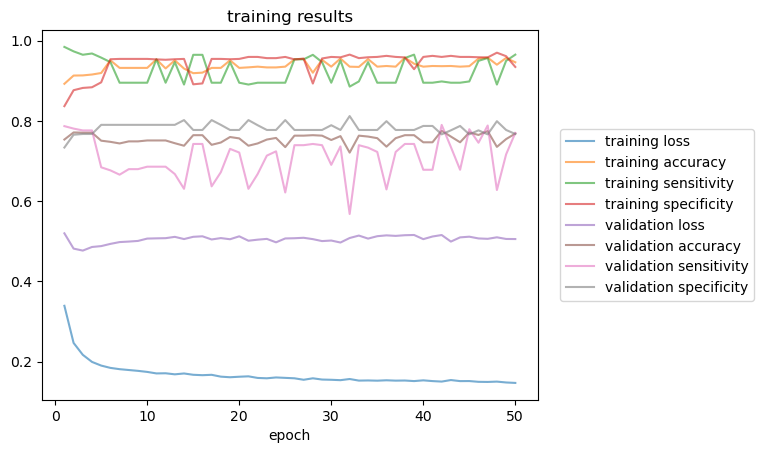

35 2.357932471773073 5 3 bce
5.355783700942993
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3766, Training Accuracy: 0.8929, Training Sensitivity: 0.9276, Training Specificity: 0.8469, Validation Loss: 0.4726, Validation Accuracy: 0.7303, Validation Sensitivity: 0.8654, Validation Specificity: 0.4937
Epoch: 020, Training Loss: 0.3603, Training Accuracy: 0.8937, Training Sensitivity: 0.9274, Training Specificity: 0.8491, Validation Loss: 0.4613, Validation Accuracy: 0.7303, Validation Sensitivity: 0.8654, Validation Specificity: 0.4937
Epoch: 030, Training Loss: 0.3524, Training Accuracy: 0.8968, Training Sensitivity: 0.9328, Training Specificity: 0.8491, Validation Loss: 0.4644, Validation Accuracy: 0.7331, Validation Sensitivity: 0.8654, Validation Specificity: 0.5016
Epoch: 040, Training Loss: 0.3469, Training Accuracy: 0.8957, Training Sensitivity: 0.9309, Training Sp

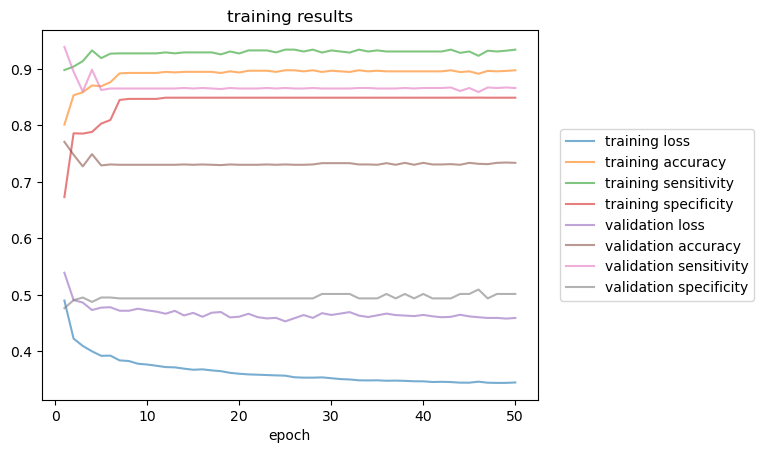

35 3.036898707659609 5 3 bce
7.782559871673584
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3043, Training Accuracy: 0.9232, Training Sensitivity: 0.9973, Training Specificity: 0.5947, Validation Loss: 0.3723, Validation Accuracy: 0.8600, Validation Sensitivity: 0.9986, Validation Specificity: 0.1873
Epoch: 020, Training Loss: 0.2988, Training Accuracy: 0.9239, Training Sensitivity: 0.9959, Training Specificity: 0.6049, Validation Loss: 0.3632, Validation Accuracy: 0.8846, Validation Sensitivity: 0.9966, Validation Specificity: 0.3411
Epoch: 030, Training Loss: 0.2977, Training Accuracy: 0.9225, Training Sensitivity: 0.9940, Training Specificity: 0.6055, Validation Loss: 0.3626, Validation Accuracy: 0.8846, Validation Sensitivity: 0.9966, Validation Specificity: 0.3411
Epoch: 040, Training Loss: 0.2970, Training Accuracy: 0.9233, Training Sensitivity: 0.9951, Training Sp

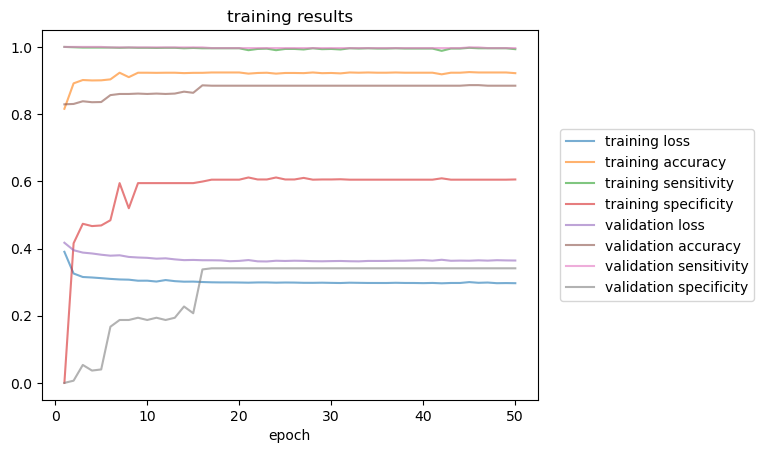

35 3.7158649435461455 5 3 bce
7.493408679962158
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3120, Training Accuracy: 0.9239, Training Sensitivity: 0.9926, Training Specificity: 0.6622, Validation Loss: 0.4559, Validation Accuracy: 0.8149, Validation Sensitivity: 0.9532, Validation Specificity: 0.2806
Epoch: 020, Training Loss: 0.3101, Training Accuracy: 0.9237, Training Sensitivity: 0.9936, Training Specificity: 0.6572, Validation Loss: 0.4734, Validation Accuracy: 0.8154, Validation Sensitivity: 0.9540, Validation Specificity: 0.2806
Epoch: 030, Training Loss: 0.3068, Training Accuracy: 0.9230, Training Sensitivity: 0.9911, Training Specificity: 0.6633, Validation Loss: 0.4917, Validation Accuracy: 0.8000, Validation Sensitivity: 0.9302, Validation Specificity: 0.2972
Epoch: 040, Training Loss: 0.3046, Training Accuracy: 0.9235, Training Sensitivity: 0.9933, Training S

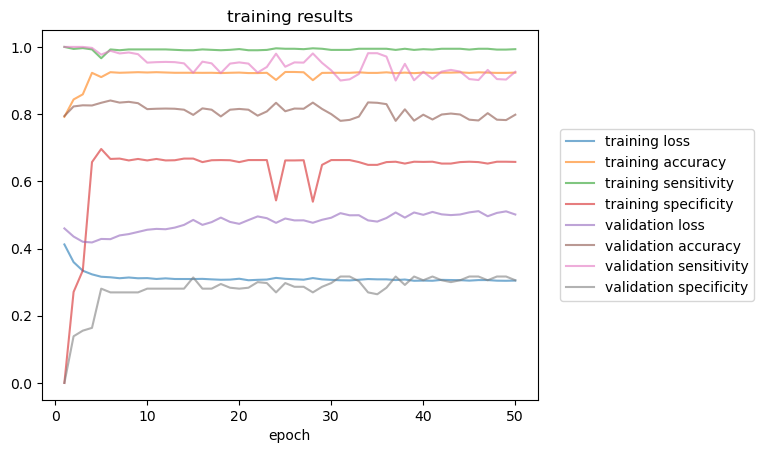

35 4.394831179432682 5 3 bce
9.42427110671997
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3405, Training Accuracy: 0.8796, Training Sensitivity: 1.0000, Training Specificity: 0.1918, Validation Loss: 0.3949, Validation Accuracy: 0.8343, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3160, Training Accuracy: 0.9057, Training Sensitivity: 0.9990, Training Specificity: 0.3728, Validation Loss: 0.3891, Validation Accuracy: 0.8349, Validation Sensitivity: 1.0000, Validation Specificity: 0.0034
Epoch: 030, Training Loss: 0.3151, Training Accuracy: 0.9057, Training Sensitivity: 0.9990, Training Specificity: 0.3728, Validation Loss: 0.3880, Validation Accuracy: 0.8354, Validation Sensitivity: 1.0000, Validation Specificity: 0.0069
Epoch: 040, Training Loss: 0.3150, Training Accuracy: 0.9057, Training Sensitivity: 0.9990, Training Spe

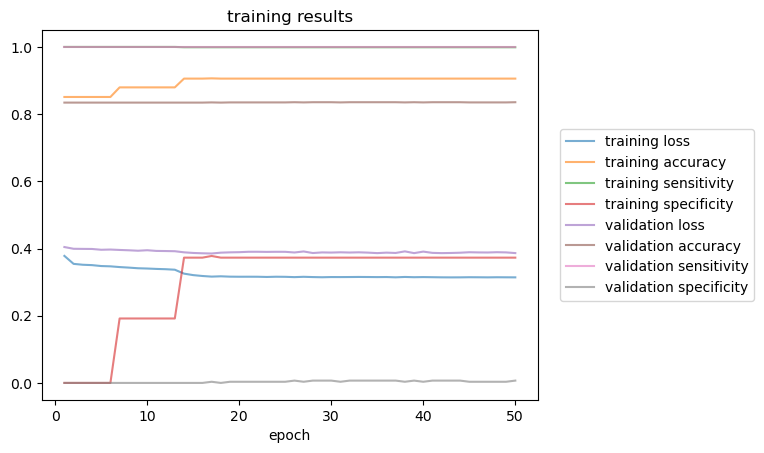

35 5.073797415319218 5 3 bce
11.376382827758789
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3203, Training Accuracy: 0.8999, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4134, Validation Accuracy: 0.8520, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3211, Training Accuracy: 0.8999, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4224, Validation Accuracy: 0.8520, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3207, Training Accuracy: 0.8999, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4252, Validation Accuracy: 0.8520, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3201, Training Accuracy: 0.8999, Training Sensitivity: 1.0000, Training S

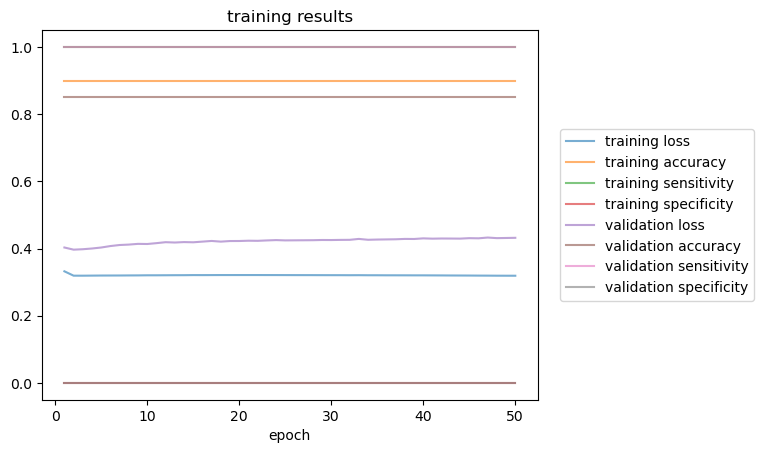

35 5.752763651205755 5 3 bce
10.901282548904419
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3219, Training Accuracy: 0.8971, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3437, Validation Accuracy: 0.8851, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3210, Training Accuracy: 0.8971, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3488, Validation Accuracy: 0.8851, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3199, Training Accuracy: 0.8971, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3528, Validation Accuracy: 0.8851, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3179, Training Accuracy: 0.8971, Training Sensitivity: 1.0000, Training S

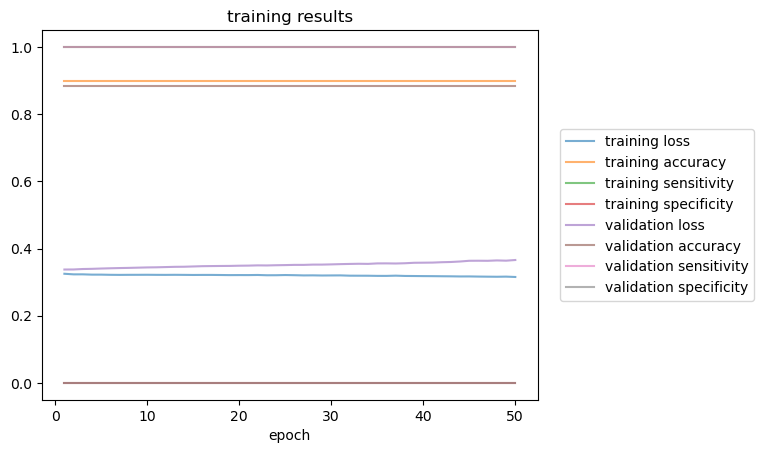

35 6.431729887092291 5 3 bce
11.58506441116333
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3208, Training Accuracy: 0.8982, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3353, Validation Accuracy: 0.8943, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3212, Training Accuracy: 0.8982, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3387, Validation Accuracy: 0.8943, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3201, Training Accuracy: 0.8982, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3383, Validation Accuracy: 0.8943, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3194, Training Accuracy: 0.8982, Training Sensitivity: 1.0000, Training Sp

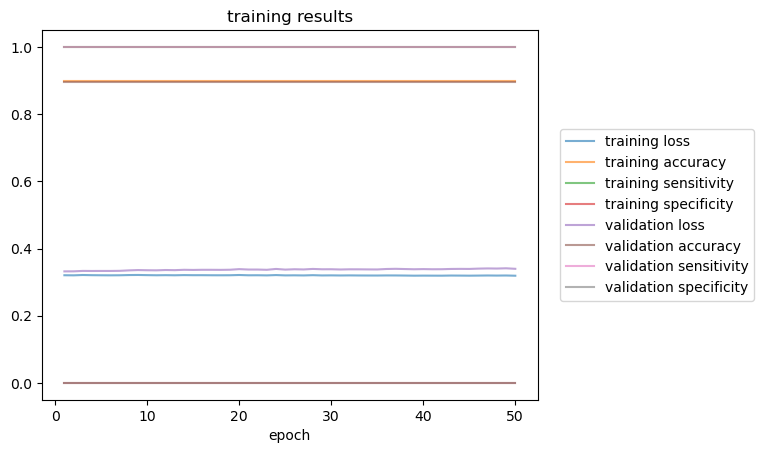

35 7.110696122978827 5 3 bce
12.655901193618774
GCN(
  (conv1): GCNConv(35, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3271, Training Accuracy: 0.8971, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3269, Validation Accuracy: 0.8971, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3274, Training Accuracy: 0.8971, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3277, Validation Accuracy: 0.8971, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3272, Training Accuracy: 0.8971, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3279, Validation Accuracy: 0.8971, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3265, Training Accuracy: 0.8971, Training Sensitivity: 1.0000, Training S

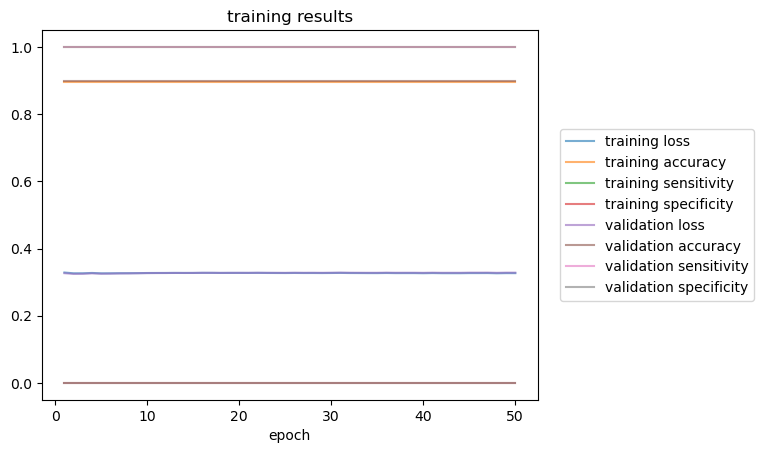

40 1.0 5 3 bce
3.1183969974517822
GCN(
  (conv1): GCNConv(40, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.1751, Training Accuracy: 0.9414, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.4510, Validation Accuracy: 0.9345, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.1737, Training Accuracy: 0.9414, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.5963, Validation Accuracy: 0.9345, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.1734, Training Accuracy: 0.9414, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.6376, Validation Accuracy: 0.9345, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.1736, Training Accuracy: 0.9414, Training Sensitivity: 0.0000, Training Specificity: 1.

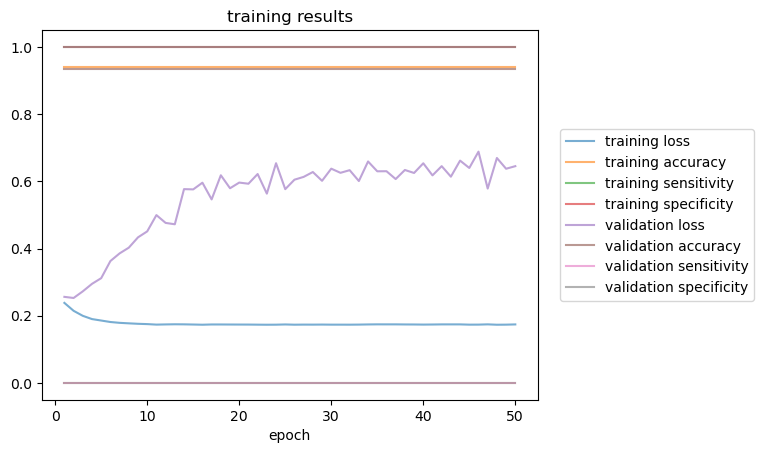

40 1.7086398786919859 5 3 bce
4.998830318450928
GCN(
  (conv1): GCNConv(40, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3676, Training Accuracy: 0.7994, Training Sensitivity: 0.4226, Training Specificity: 0.9265, Validation Loss: 0.5594, Validation Accuracy: 0.7115, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.3563, Training Accuracy: 0.8136, Training Sensitivity: 0.5102, Training Specificity: 0.9160, Validation Loss: 0.5661, Validation Accuracy: 0.7115, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.3544, Training Accuracy: 0.8111, Training Sensitivity: 0.4999, Training Specificity: 0.9160, Validation Loss: 0.5674, Validation Accuracy: 0.7225, Validation Sensitivity: 0.0607, Validation Specificity: 0.9909
Epoch: 040, Training Loss: 0.3502, Training Accuracy: 0.8116, Training Sensitivity: 0.5021, Training S

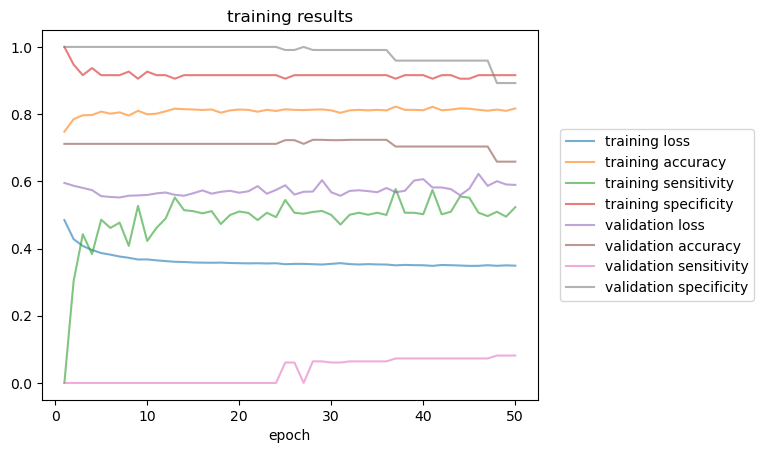

40 2.4172797573839717 5 3 bce
7.333414077758789
GCN(
  (conv1): GCNConv(40, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3854, Training Accuracy: 0.8733, Training Sensitivity: 0.8655, Training Specificity: 0.8839, Validation Loss: 0.8806, Validation Accuracy: 0.5325, Validation Sensitivity: 0.5108, Validation Specificity: 0.5720
Epoch: 020, Training Loss: 0.3754, Training Accuracy: 0.8908, Training Sensitivity: 0.9024, Training Specificity: 0.8751, Validation Loss: 0.8103, Validation Accuracy: 0.5590, Validation Sensitivity: 0.5596, Validation Specificity: 0.5579
Epoch: 030, Training Loss: 0.3725, Training Accuracy: 0.8921, Training Sensitivity: 0.9047, Training Specificity: 0.8750, Validation Loss: 0.7763, Validation Accuracy: 0.5830, Validation Sensitivity: 0.5967, Validation Specificity: 0.5579
Epoch: 040, Training Loss: 0.3717, Training Accuracy: 0.8925, Training Sensitivity: 0.9034, Training S

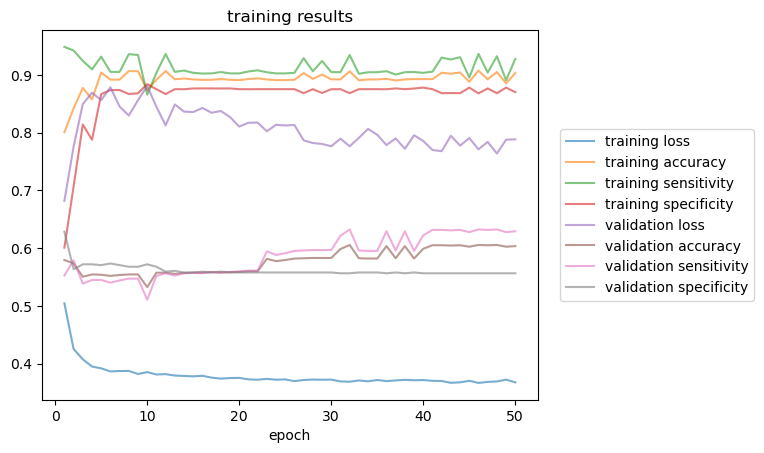

40 3.125919636075958 5 3 bce
9.148497343063354
GCN(
  (conv1): GCNConv(40, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3124, Training Accuracy: 0.9145, Training Sensitivity: 0.9619, Training Specificity: 0.7752, Validation Loss: 0.4118, Validation Accuracy: 0.8215, Validation Sensitivity: 0.9907, Validation Specificity: 0.1342
Epoch: 020, Training Loss: 0.3045, Training Accuracy: 0.9153, Training Sensitivity: 0.9630, Training Specificity: 0.7752, Validation Loss: 0.4511, Validation Accuracy: 0.8240, Validation Sensitivity: 0.9931, Validation Specificity: 0.1367
Epoch: 030, Training Loss: 0.3030, Training Accuracy: 0.9153, Training Sensitivity: 0.9630, Training Specificity: 0.7752, Validation Loss: 0.4588, Validation Accuracy: 0.8205, Validation Sensitivity: 0.9882, Validation Specificity: 0.1392
Epoch: 040, Training Loss: 0.3000, Training Accuracy: 0.9153, Training Sensitivity: 0.9630, Training Sp

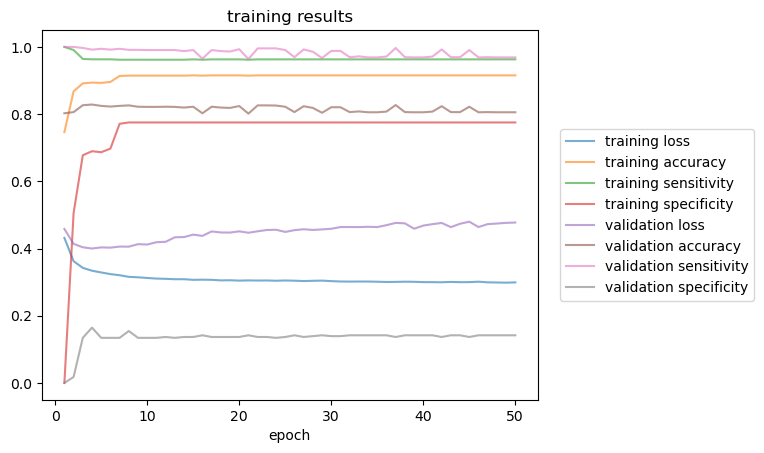

40 3.8345595147679434 5 3 bce
10.121119260787964
GCN(
  (conv1): GCNConv(40, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3161, Training Accuracy: 0.9195, Training Sensitivity: 0.9981, Training Specificity: 0.5551, Validation Loss: 0.4535, Validation Accuracy: 0.8045, Validation Sensitivity: 0.9732, Validation Specificity: 0.0334
Epoch: 020, Training Loss: 0.3104, Training Accuracy: 0.9186, Training Sensitivity: 0.9981, Training Specificity: 0.5501, Validation Loss: 0.4787, Validation Accuracy: 0.8070, Validation Sensitivity: 0.9768, Validation Specificity: 0.0306
Epoch: 030, Training Loss: 0.3082, Training Accuracy: 0.9195, Training Sensitivity: 0.9981, Training Specificity: 0.5551, Validation Loss: 0.5040, Validation Accuracy: 0.7720, Validation Sensitivity: 0.9281, Validation Specificity: 0.0585
Epoch: 040, Training Loss: 0.3086, Training Accuracy: 0.9195, Training Sensitivity: 0.9981, Training 

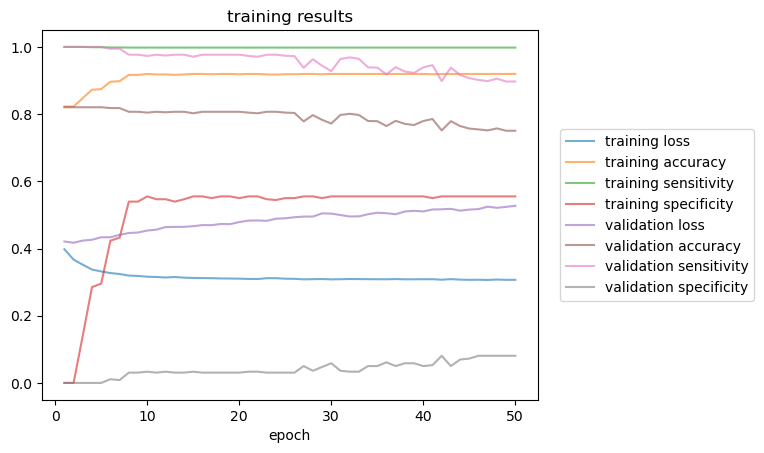

40 4.543199393459929 5 3 bce
12.76484227180481
GCN(
  (conv1): GCNConv(40, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3216, Training Accuracy: 0.8984, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3691, Validation Accuracy: 0.8750, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3217, Training Accuracy: 0.8984, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3732, Validation Accuracy: 0.8750, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3214, Training Accuracy: 0.8984, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3741, Validation Accuracy: 0.8750, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3205, Training Accuracy: 0.8984, Training Sensitivity: 1.0000, Training Sp

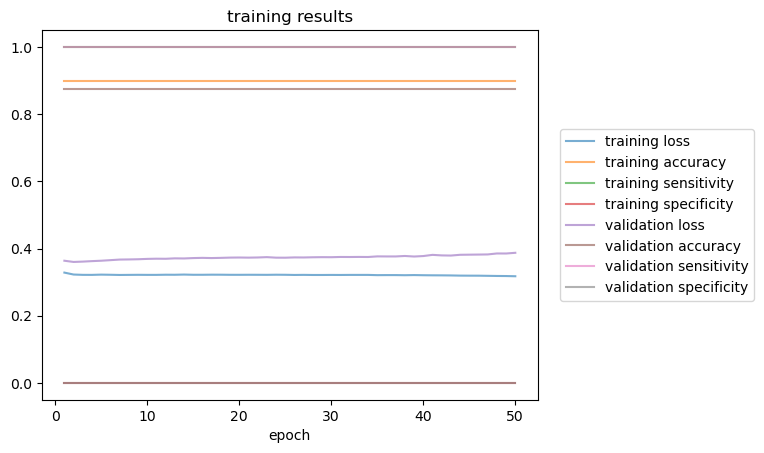

40 5.251839272151916 5 3 bce
14.838456392288208
GCN(
  (conv1): GCNConv(40, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3296, Training Accuracy: 0.8791, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3361, Validation Accuracy: 0.8940, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3285, Training Accuracy: 0.8791, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3368, Validation Accuracy: 0.8940, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3267, Training Accuracy: 0.8791, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3367, Validation Accuracy: 0.8940, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3263, Training Accuracy: 0.8791, Training Sensitivity: 1.0000, Training S

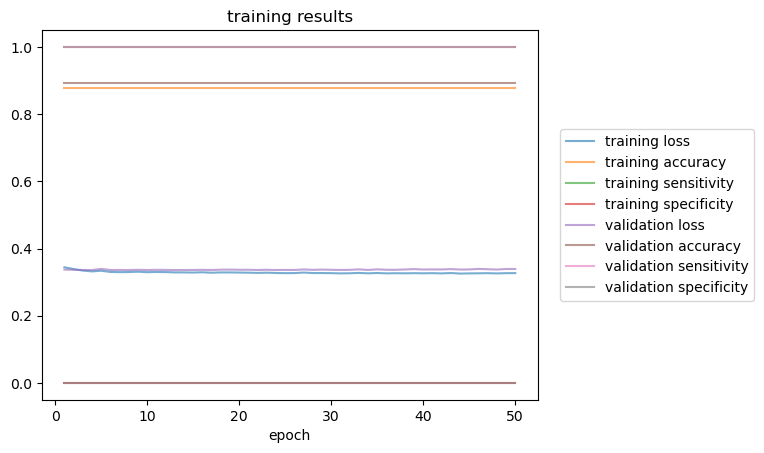

40 5.960479150843901 5 3 bce
14.978764295578003
GCN(
  (conv1): GCNConv(40, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3154, Training Accuracy: 0.8983, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3615, Validation Accuracy: 0.8770, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3147, Training Accuracy: 0.8983, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3663, Validation Accuracy: 0.8770, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3150, Training Accuracy: 0.8983, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3721, Validation Accuracy: 0.8770, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3122, Training Accuracy: 0.8983, Training Sensitivity: 1.0000, Training S

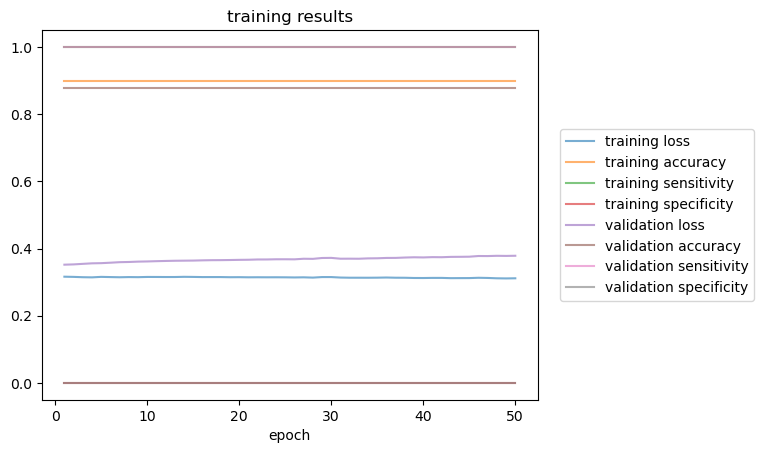

40 6.669119029535887 5 3 bce
15.401198625564575
GCN(
  (conv1): GCNConv(40, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3330, Training Accuracy: 0.8937, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3300, Validation Accuracy: 0.8950, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3340, Training Accuracy: 0.8937, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3325, Validation Accuracy: 0.8950, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3340, Training Accuracy: 0.8937, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3329, Validation Accuracy: 0.8950, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3337, Training Accuracy: 0.8937, Training Sensitivity: 1.0000, Training S

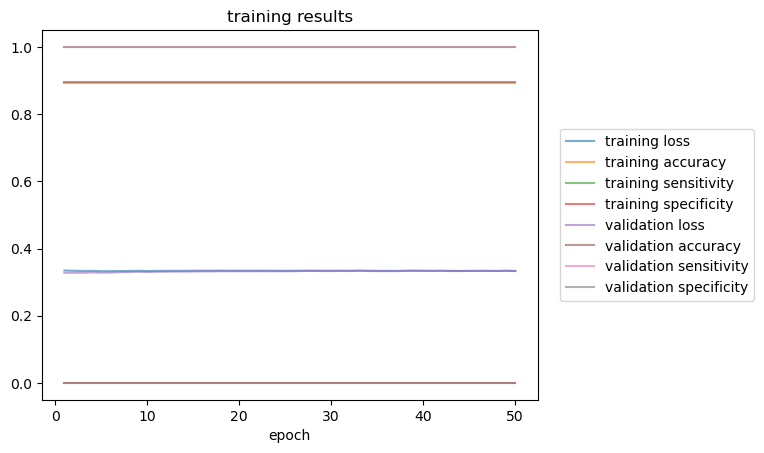

40 7.3777589082278725 5 3 bce
16.825685024261475
GCN(
  (conv1): GCNConv(40, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3344, Training Accuracy: 0.8931, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3423, Validation Accuracy: 0.8900, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3338, Training Accuracy: 0.8931, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3430, Validation Accuracy: 0.8900, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3333, Training Accuracy: 0.8931, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3435, Validation Accuracy: 0.8900, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3330, Training Accuracy: 0.8931, Training Sensitivity: 1.0000, Training 

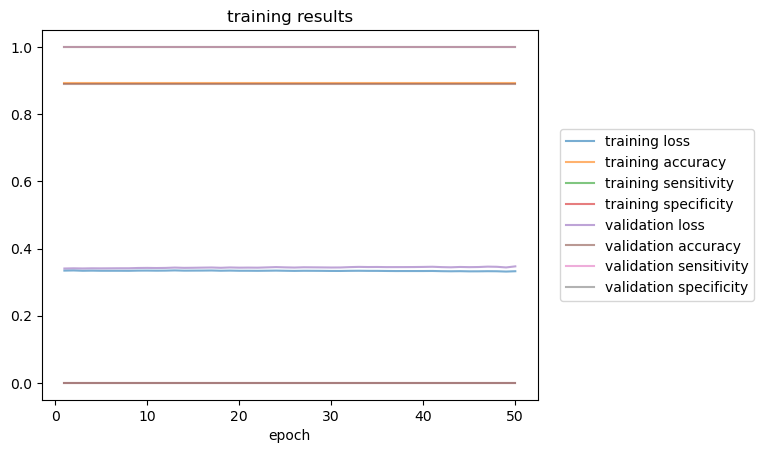

45 1.0 5 3 bce
4.8687708377838135
GCN(
  (conv1): GCNConv(45, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3415, Training Accuracy: 0.8924, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.2857, Validation Accuracy: 0.9191, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.3415, Training Accuracy: 0.8924, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.2851, Validation Accuracy: 0.9191, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.3415, Training Accuracy: 0.8924, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.2851, Validation Accuracy: 0.9191, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.3415, Training Accuracy: 0.8924, Training Sensitivity: 0.0000, Training Specificity: 1.

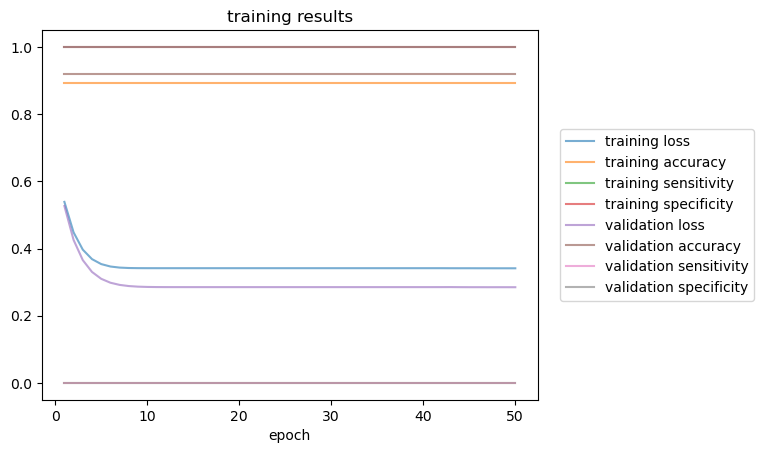

45 1.7348138866156266 5 3 bce
9.031213998794556
GCN(
  (conv1): GCNConv(45, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2507, Training Accuracy: 0.9411, Training Sensitivity: 0.9333, Training Specificity: 0.9512, Validation Loss: 0.8592, Validation Accuracy: 0.6644, Validation Sensitivity: 0.5049, Validation Specificity: 0.8263
Epoch: 020, Training Loss: 0.2383, Training Accuracy: 0.9424, Training Sensitivity: 0.9357, Training Specificity: 0.9512, Validation Loss: 0.9945, Validation Accuracy: 0.6609, Validation Sensitivity: 0.4978, Validation Specificity: 0.8263
Epoch: 030, Training Loss: 0.2295, Training Accuracy: 0.9439, Training Sensitivity: 0.9371, Training Specificity: 0.9527, Validation Loss: 1.0005, Validation Accuracy: 0.6618, Validation Sensitivity: 0.5004, Validation Specificity: 0.8254
Epoch: 040, Training Loss: 0.2228, Training Accuracy: 0.9455, Training Sensitivity: 0.9399, Training S

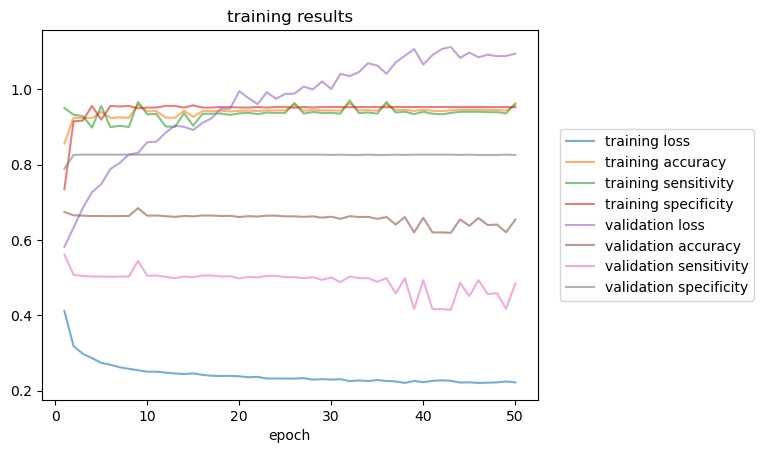

45 2.4696277732312533 5 3 bce
10.166494131088257
GCN(
  (conv1): GCNConv(45, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2575, Training Accuracy: 0.9551, Training Sensitivity: 0.9884, Training Specificity: 0.8914, Validation Loss: 0.8277, Validation Accuracy: 0.5609, Validation Sensitivity: 0.4359, Validation Specificity: 0.8303
Epoch: 020, Training Loss: 0.2411, Training Accuracy: 0.9553, Training Sensitivity: 0.9886, Training Specificity: 0.8914, Validation Loss: 0.9372, Validation Accuracy: 0.5596, Validation Sensitivity: 0.4008, Validation Specificity: 0.9018
Epoch: 030, Training Loss: 0.2345, Training Accuracy: 0.9562, Training Sensitivity: 0.9900, Training Specificity: 0.8914, Validation Loss: 0.9467, Validation Accuracy: 0.5604, Validation Sensitivity: 0.4021, Validation Specificity: 0.9018
Epoch: 040, Training Loss: 0.2342, Training Accuracy: 0.9544, Training Sensitivity: 0.9874, Training 

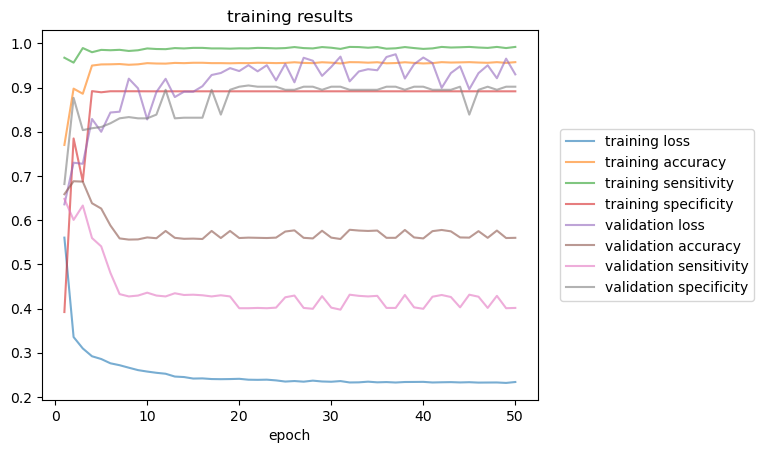

45 3.20444165984688 5 3 bce
12.986756086349487
GCN(
  (conv1): GCNConv(45, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3103, Training Accuracy: 0.9223, Training Sensitivity: 0.9970, Training Specificity: 0.5908, Validation Loss: 0.4268, Validation Accuracy: 0.8173, Validation Sensitivity: 1.0000, Validation Specificity: 0.2687
Epoch: 020, Training Loss: 0.3036, Training Accuracy: 0.9227, Training Sensitivity: 0.9970, Training Specificity: 0.5932, Validation Loss: 0.4311, Validation Accuracy: 0.8191, Validation Sensitivity: 1.0000, Validation Specificity: 0.2758
Epoch: 030, Training Loss: 0.2993, Training Accuracy: 0.9227, Training Sensitivity: 0.9970, Training Specificity: 0.5932, Validation Loss: 0.4448, Validation Accuracy: 0.8200, Validation Sensitivity: 1.0000, Validation Specificity: 0.2794
Epoch: 040, Training Loss: 0.2980, Training Accuracy: 0.9232, Training Sensitivity: 0.9975, Training Sp

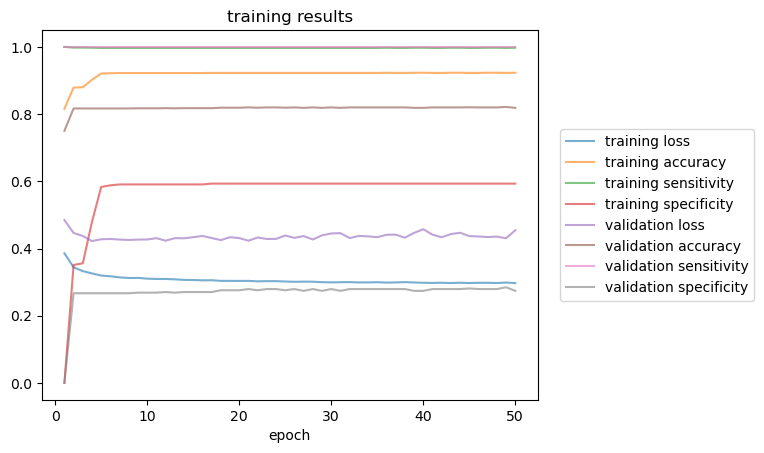

45 3.9392555464625065 5 3 bce
15.532203674316406
GCN(
  (conv1): GCNConv(45, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2975, Training Accuracy: 0.9211, Training Sensitivity: 0.9986, Training Specificity: 0.5858, Validation Loss: 0.3431, Validation Accuracy: 0.8382, Validation Sensitivity: 0.9738, Validation Specificity: 0.3981
Epoch: 020, Training Loss: 0.2918, Training Accuracy: 0.9211, Training Sensitivity: 0.9986, Training Specificity: 0.5858, Validation Loss: 0.3393, Validation Accuracy: 0.8449, Validation Sensitivity: 0.9733, Validation Specificity: 0.4283
Epoch: 030, Training Loss: 0.2902, Training Accuracy: 0.9211, Training Sensitivity: 0.9986, Training Specificity: 0.5858, Validation Loss: 0.3412, Validation Accuracy: 0.8573, Validation Sensitivity: 0.9733, Validation Specificity: 0.4811
Epoch: 040, Training Loss: 0.2901, Training Accuracy: 0.9211, Training Sensitivity: 0.9986, Training 

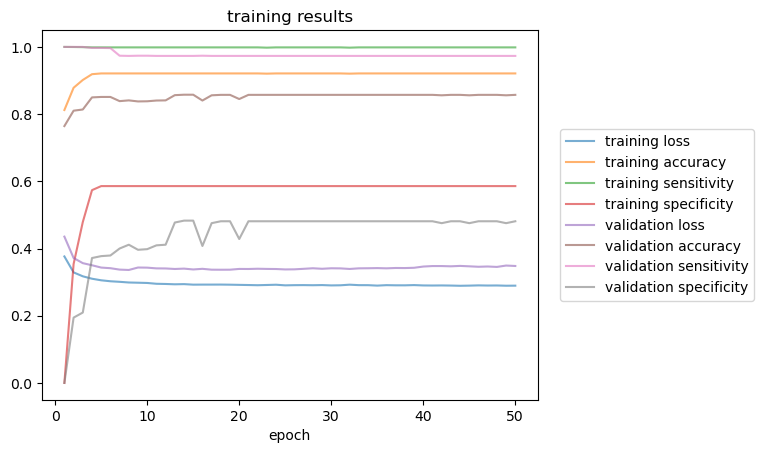

45 4.674069433078133 5 3 bce
18.2484450340271
GCN(
  (conv1): GCNConv(45, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3171, Training Accuracy: 0.9008, Training Sensitivity: 1.0000, Training Specificity: 0.1831, Validation Loss: 0.3622, Validation Accuracy: 0.8733, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3182, Training Accuracy: 0.9008, Training Sensitivity: 1.0000, Training Specificity: 0.1831, Validation Loss: 0.3626, Validation Accuracy: 0.8733, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3180, Training Accuracy: 0.9008, Training Sensitivity: 1.0000, Training Specificity: 0.1831, Validation Loss: 0.3641, Validation Accuracy: 0.8733, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3178, Training Accuracy: 0.9008, Training Sensitivity: 1.0000, Training Spe

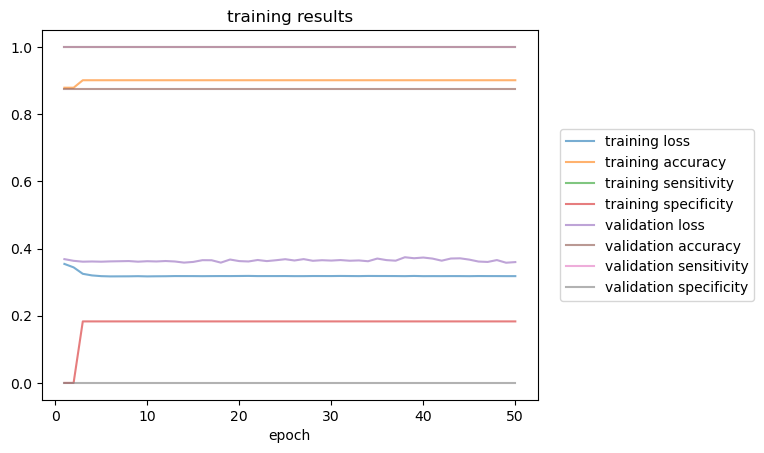

45 5.40888331969376 5 3 bce
19.896566152572632
GCN(
  (conv1): GCNConv(45, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3341, Training Accuracy: 0.8924, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3618, Validation Accuracy: 0.8813, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3347, Training Accuracy: 0.8924, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3653, Validation Accuracy: 0.8813, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3339, Training Accuracy: 0.8924, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3665, Validation Accuracy: 0.8813, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3332, Training Accuracy: 0.8924, Training Sensitivity: 1.0000, Training Sp

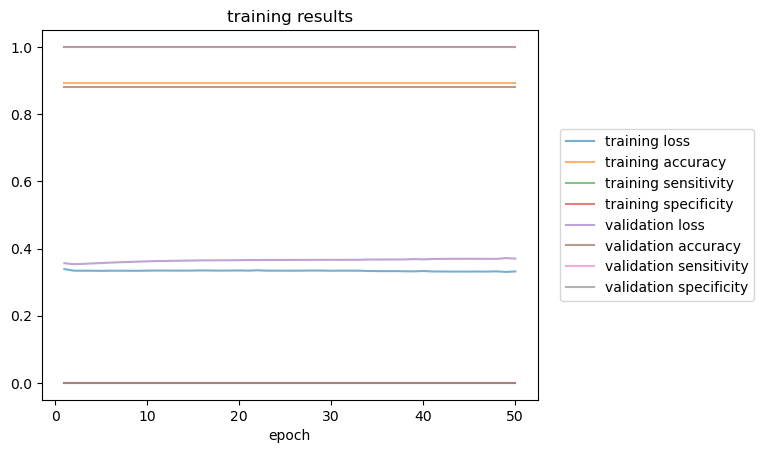

45 6.143697206309387 5 3 bce
19.53775644302368
GCN(
  (conv1): GCNConv(45, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3296, Training Accuracy: 0.8794, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3595, Validation Accuracy: 0.8800, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3295, Training Accuracy: 0.8797, Training Sensitivity: 1.0000, Training Specificity: 0.0026, Validation Loss: 0.3624, Validation Accuracy: 0.8800, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3289, Training Accuracy: 0.8995, Training Sensitivity: 0.9992, Training Specificity: 0.1724, Validation Loss: 0.3645, Validation Accuracy: 0.8800, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3290, Training Accuracy: 0.8995, Training Sensitivity: 0.9992, Training Sp

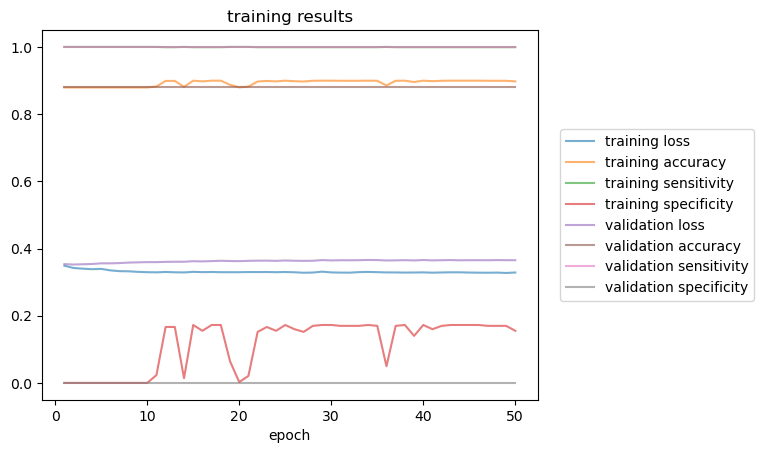

45 6.878511092925013 5 3 bce
22.08156132698059
GCN(
  (conv1): GCNConv(45, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3203, Training Accuracy: 0.8983, Training Sensitivity: 1.0000, Training Specificity: 0.1793, Validation Loss: 0.3341, Validation Accuracy: 0.8951, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3217, Training Accuracy: 0.8983, Training Sensitivity: 1.0000, Training Specificity: 0.1793, Validation Loss: 0.3348, Validation Accuracy: 0.8951, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3217, Training Accuracy: 0.8983, Training Sensitivity: 1.0000, Training Specificity: 0.1793, Validation Loss: 0.3350, Validation Accuracy: 0.8951, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3216, Training Accuracy: 0.8983, Training Sensitivity: 1.0000, Training Sp

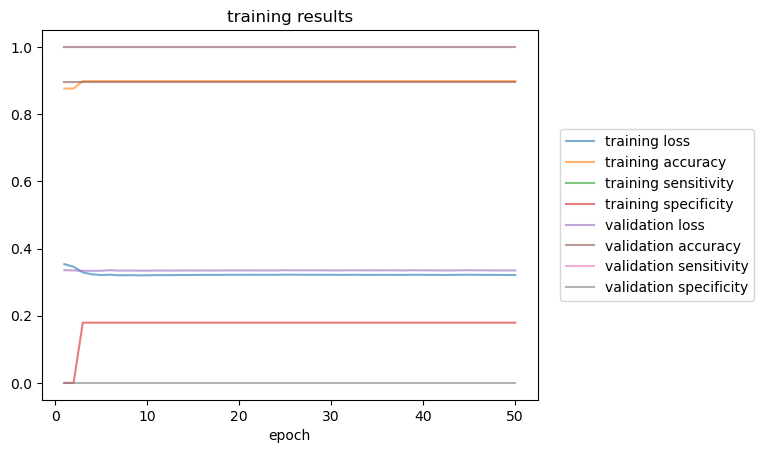

45 7.613324979540639 5 3 bce
24.638693809509277
GCN(
  (conv1): GCNConv(45, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3310, Training Accuracy: 0.8940, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3826, Validation Accuracy: 0.8662, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3310, Training Accuracy: 0.8940, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3865, Validation Accuracy: 0.8662, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3314, Training Accuracy: 0.8940, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3867, Validation Accuracy: 0.8662, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3310, Training Accuracy: 0.8940, Training Sensitivity: 1.0000, Training S

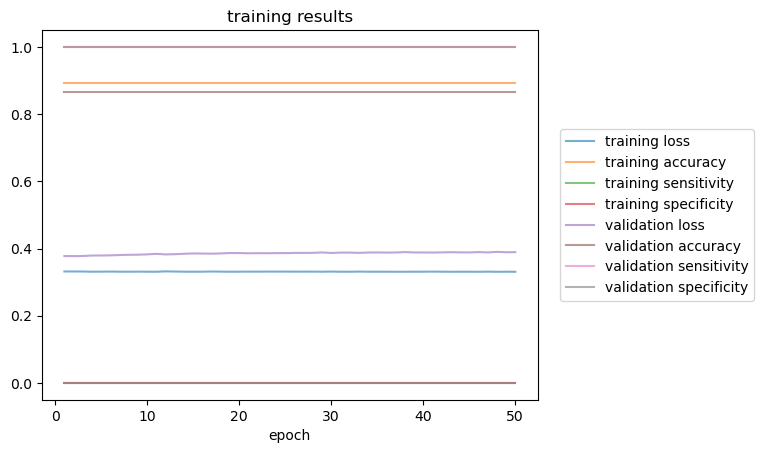

50 1.0 5 3 bce
6.471028566360474
GCN(
  (conv1): GCNConv(50, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.1657, Training Accuracy: 0.9423, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.5523, Validation Accuracy: 0.9160, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.1645, Training Accuracy: 0.9423, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.6873, Validation Accuracy: 0.9160, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.1642, Training Accuracy: 0.9423, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 0.7486, Validation Accuracy: 0.9160, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.1601, Training Accuracy: 0.9423, Training Sensitivity: 0.0000, Training Specificity: 1.0

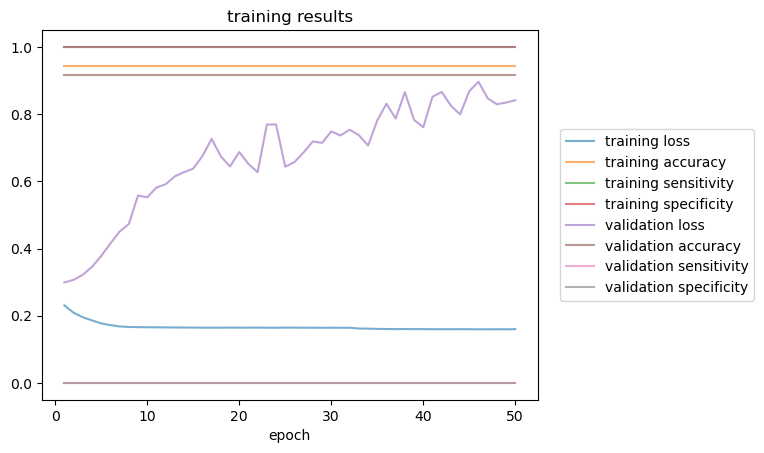

50 1.758227334539588 5 3 bce
10.890307664871216
GCN(
  (conv1): GCNConv(50, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.1884, Training Accuracy: 0.9595, Training Sensitivity: 0.9783, Training Specificity: 0.9383, Validation Loss: 0.9696, Validation Accuracy: 0.5688, Validation Sensitivity: 0.4345, Validation Specificity: 0.8026
Epoch: 020, Training Loss: 0.1832, Training Accuracy: 0.9718, Training Sensitivity: 0.9813, Training Specificity: 0.9612, Validation Loss: 0.9920, Validation Accuracy: 0.6208, Validation Sensitivity: 0.5183, Validation Specificity: 0.7993
Epoch: 030, Training Loss: 0.1822, Training Accuracy: 0.9707, Training Sensitivity: 0.9783, Training Specificity: 0.9622, Validation Loss: 1.0177, Validation Accuracy: 0.6204, Validation Sensitivity: 0.5176, Validation Specificity: 0.7993
Epoch: 040, Training Loss: 0.1826, Training Accuracy: 0.9611, Training Sensitivity: 0.9856, Training S

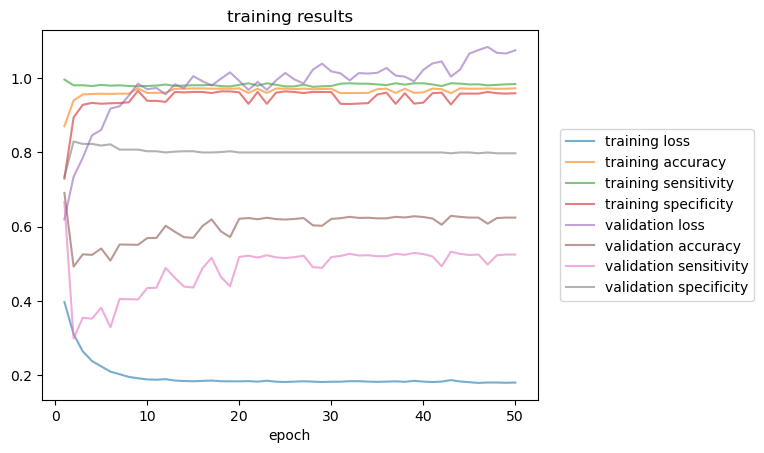

50 2.516454669079176 5 3 bce
11.002920389175415
GCN(
  (conv1): GCNConv(50, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2837, Training Accuracy: 0.8948, Training Sensitivity: 0.8484, Training Specificity: 0.9437, Validation Loss: 0.7614, Validation Accuracy: 0.5308, Validation Sensitivity: 0.3265, Validation Specificity: 0.9771
Epoch: 020, Training Loss: 0.2611, Training Accuracy: 0.9168, Training Sensitivity: 0.8615, Training Specificity: 0.9751, Validation Loss: 0.7781, Validation Accuracy: 0.5556, Validation Sensitivity: 0.3633, Validation Specificity: 0.9758
Epoch: 030, Training Loss: 0.2560, Training Accuracy: 0.9160, Training Sensitivity: 0.8585, Training Specificity: 0.9767, Validation Loss: 0.8185, Validation Accuracy: 0.5384, Validation Sensitivity: 0.3364, Validation Specificity: 0.9796
Epoch: 040, Training Loss: 0.2493, Training Accuracy: 0.9182, Training Sensitivity: 0.8616, Training S

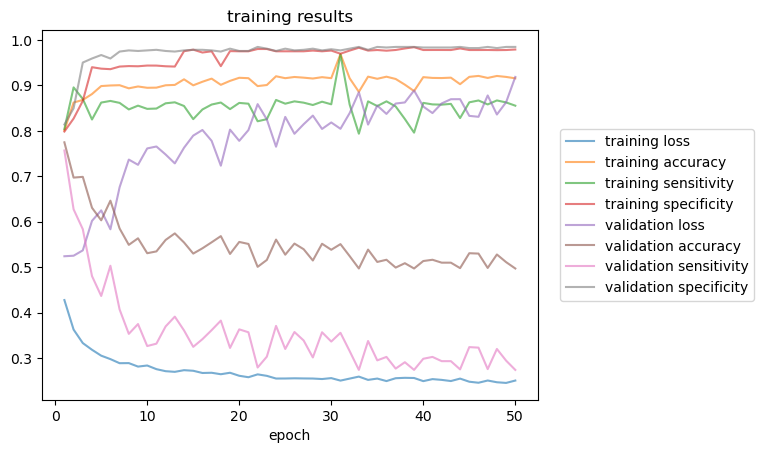

50 3.2746820036187643 5 3 bce
15.381134033203125
GCN(
  (conv1): GCNConv(50, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2983, Training Accuracy: 0.9215, Training Sensitivity: 0.9692, Training Specificity: 0.7813, Validation Loss: 0.4045, Validation Accuracy: 0.8692, Validation Sensitivity: 0.9965, Validation Specificity: 0.3858
Epoch: 020, Training Loss: 0.2943, Training Accuracy: 0.9214, Training Sensitivity: 0.9691, Training Specificity: 0.7813, Validation Loss: 0.4169, Validation Accuracy: 0.8628, Validation Sensitivity: 0.9864, Validation Specificity: 0.3935
Epoch: 030, Training Loss: 0.2911, Training Accuracy: 0.9214, Training Sensitivity: 0.9691, Training Specificity: 0.7813, Validation Loss: 0.4252, Validation Accuracy: 0.8648, Validation Sensitivity: 0.9909, Validation Specificity: 0.3858
Epoch: 040, Training Loss: 0.2916, Training Accuracy: 0.9213, Training Sensitivity: 0.9689, Training 

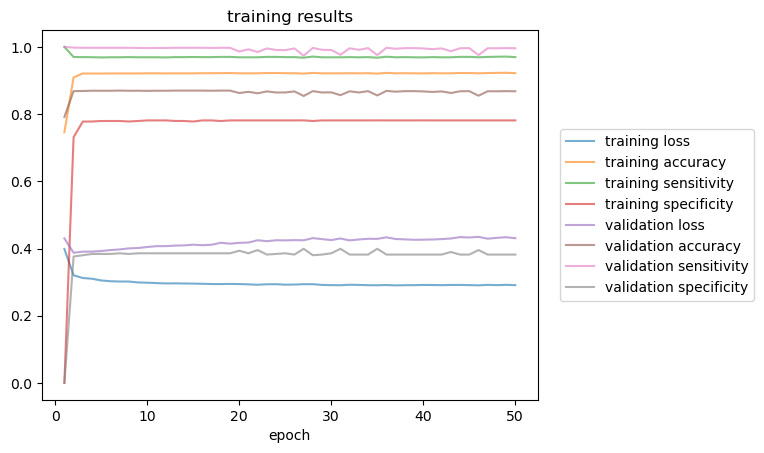

50 4.032909338158352 5 3 bce
19.121418476104736
GCN(
  (conv1): GCNConv(50, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3238, Training Accuracy: 0.9069, Training Sensitivity: 0.9991, Training Specificity: 0.3846, Validation Loss: 0.3859, Validation Accuracy: 0.8636, Validation Sensitivity: 1.0000, Validation Specificity: 0.0029
Epoch: 020, Training Loss: 0.3227, Training Accuracy: 0.9070, Training Sensitivity: 0.9980, Training Specificity: 0.3916, Validation Loss: 0.3887, Validation Accuracy: 0.8636, Validation Sensitivity: 1.0000, Validation Specificity: 0.0029
Epoch: 030, Training Loss: 0.3226, Training Accuracy: 0.9076, Training Sensitivity: 0.9986, Training Specificity: 0.3916, Validation Loss: 0.3896, Validation Accuracy: 0.8632, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3230, Training Accuracy: 0.9078, Training Sensitivity: 0.9986, Training S

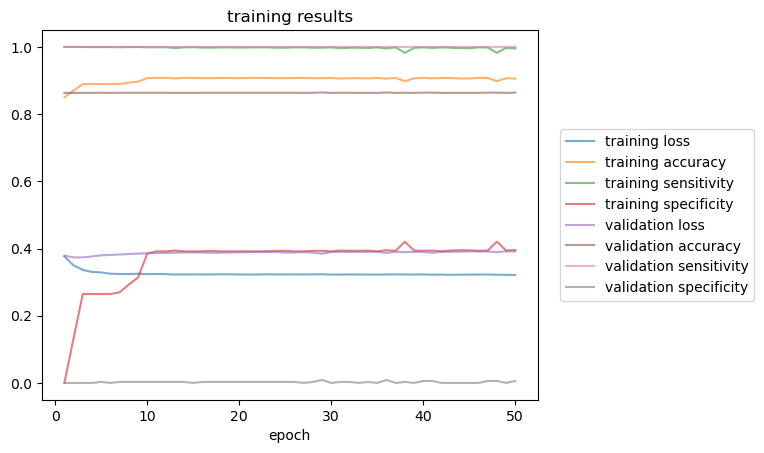

50 4.79113667269794 5 3 bce
22.680550813674927
GCN(
  (conv1): GCNConv(50, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3257, Training Accuracy: 0.8966, Training Sensitivity: 1.0000, Training Specificity: 0.1621, Validation Loss: 0.3518, Validation Accuracy: 0.8816, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3242, Training Accuracy: 0.8966, Training Sensitivity: 1.0000, Training Specificity: 0.1621, Validation Loss: 0.3533, Validation Accuracy: 0.8816, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3248, Training Accuracy: 0.8966, Training Sensitivity: 1.0000, Training Specificity: 0.1621, Validation Loss: 0.3543, Validation Accuracy: 0.8816, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3240, Training Accuracy: 0.8966, Training Sensitivity: 1.0000, Training Sp

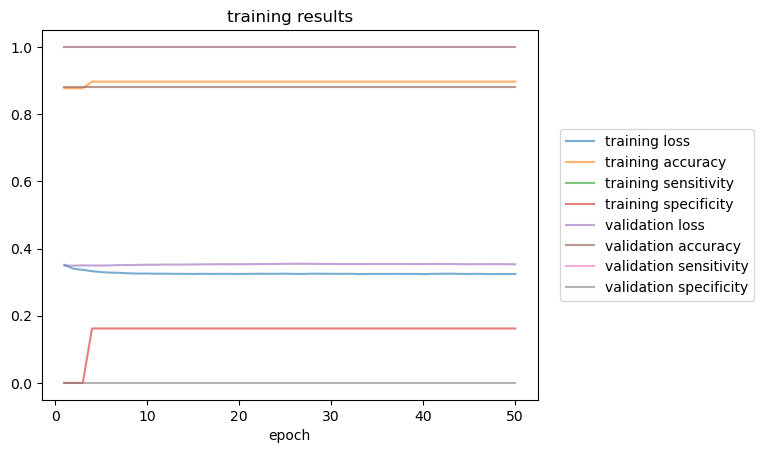

50 5.5493640072375285 5 3 bce
23.785172939300537
GCN(
  (conv1): GCNConv(50, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3385, Training Accuracy: 0.9052, Training Sensitivity: 0.9987, Training Specificity: 0.3813, Validation Loss: 0.3721, Validation Accuracy: 0.8580, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3336, Training Accuracy: 0.9052, Training Sensitivity: 0.9987, Training Specificity: 0.3813, Validation Loss: 0.3891, Validation Accuracy: 0.8580, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3317, Training Accuracy: 0.9052, Training Sensitivity: 0.9987, Training Specificity: 0.3813, Validation Loss: 0.3991, Validation Accuracy: 0.8580, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000


In [ ]:
n_train = 500
n_val = 50
n_test = 50
n_epochs = 50
early_stopping_patience = None
t = 10
for max_n_samples_per_graph in [3]:
    for k in [5]:
        for n in [15,20,25,30,35,40,45,50,55,60]:
            results = []
            lamb = np.linspace(1,np.log(n)*2,t)
            for i in range(t):
                print(n,lamb[i],k,max_n_samples_per_graph,'bce')
                t1 = time.time()
                samples = generateSamples_sketch_classification(n_train,n_val,n_test,max_n_samples_per_graph,k,ErdosRenyiGraph,n,lamb[i]/n)
                t2 = time.time()
                print(t2-t1)
                outputs = run(samples,'gcn','bce','adam','cyclic-cosine',n_epochs,early_stopping_patience)
                results.append(outputs[1:])
            with open('ERresults_sketch_n'+str(n)+'_k'+str(k)+'_'+str(max_n_samples_per_graph)+'.pkl', 'wb') as file:
                pickle.dump(np.array(results), file)

In [ ]:
n_train = 500
n_val = 50
n_test = 50
n_epochs = 50
early_stopping_patience = None
t = 10
for max_n_samples_per_graph in [3]:
    for k in [3]:
        for n in [15,25,35,45,55]:
            results = []
            lamb = np.linspace(1,np.log(n)*2,t)
            for i in range(t):
                print(n,lamb[i],k,max_n_samples_per_graph,'mse')
                t1 = time.time()
                samples = generateSamples_sketch_regression(n_train,n_val,n_test,max_n_samples_per_graph,k,ErdosRenyiGraph,n,lamb[i]/n)
                t2 = time.time()
                print(t2-t1)
                outputs = run(samples,'gcn','mse','adam','cyclic-cosine',n_epochs,early_stopping_patience)
                results.append(outputs[1:])
            with open('ERresults_sketch_regression_n'+str(n)+'_k'+str(k)+'_'+str(max_n_samples_per_graph)+'.pkl', 'wb') as file:
                pickle.dump(np.array(results), file)

In [ ]:
n_train = 500
n_val = 50
n_test = 50
n_epochs = 50
early_stopping_patience = None
t = 10
for max_n_samples_per_graph in [5]:
    for k in [1,3,5]:
        for n in [15,20,25,30,35,40,45,50,55,60]:
            results = []
            lamb = np.linspace(1,np.log(n)*2,t)
            for i in range(t):
                print(n,lamb[i],k,max_n_samples_per_graph,'bce')
                t1 = time.time()
                samples = generateSamples_sketch_classification(n_train,n_val,n_test,max_n_samples_per_graph,k,ErdosRenyiGraph,n,lamb[i]/n)
                t2 = time.time()
                print(t2-t1)
                outputs = run(samples,'gcn','bce','adam','cyclic-cosine',n_epochs,early_stopping_patience)
                results.append(outputs[1:])
            with open('ERresults_sketch_n'+str(n)+'_k'+str(k)+'_'+str(max_n_samples_per_graph)+'.pkl', 'wb') as file:
                pickle.dump(np.array(results), file)

15 1.0 7 1 bce
0.939462423324585
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.1234, Training Accuracy: 0.9333, Training Sensitivity: 1.0000, Training Specificity: 0.9231, Validation Loss: 1.6456, Validation Accuracy: 0.7693, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.1217, Training Accuracy: 0.9333, Training Sensitivity: 1.0000, Training Specificity: 0.9231, Validation Loss: 2.5455, Validation Accuracy: 0.7693, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.1178, Training Accuracy: 0.9333, Training Sensitivity: 1.0000, Training Specificity: 0.9231, Validation Loss: 2.4614, Validation Accuracy: 0.7693, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.1172, Training Accuracy: 0.9333, Training Sensitivity: 1.0000, Training Specificity: 0.9

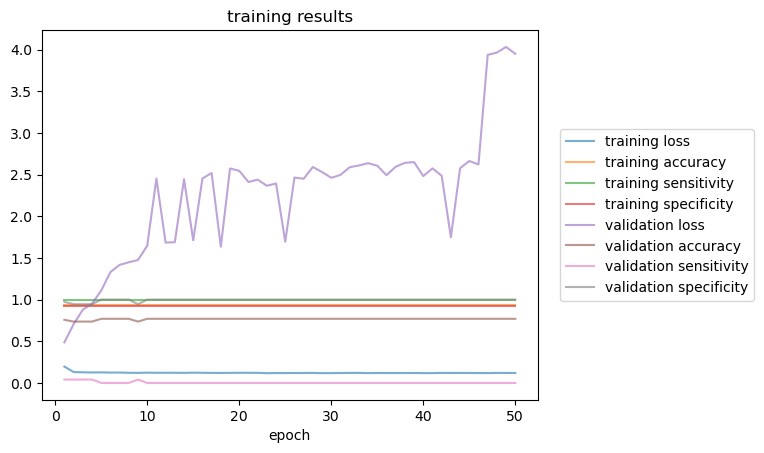

15 1.4906778224671577 7 1 bce
0.8421595096588135
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.5015, Training Accuracy: 0.7652, Training Sensitivity: 0.9135, Training Specificity: 0.5835, Validation Loss: 0.6909, Validation Accuracy: 0.5680, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.4891, Training Accuracy: 0.8077, Training Sensitivity: 0.8629, Training Specificity: 0.7401, Validation Loss: 0.7118, Validation Accuracy: 0.5680, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.4744, Training Accuracy: 0.8143, Training Sensitivity: 0.8879, Training Specificity: 0.7241, Validation Loss: 0.7171, Validation Accuracy: 0.5680, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.4691, Training Accuracy: 0.8241, Training Sensitivity: 0.9152, Training 

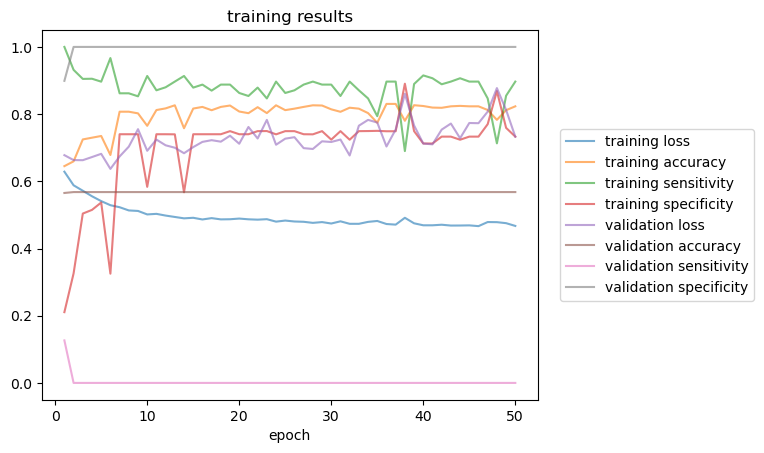

15 1.9813556449343155 7 1 bce
0.8065862655639648
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3997, Training Accuracy: 0.8407, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 1.2269, Validation Accuracy: 0.2867, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.3855, Training Accuracy: 0.8407, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 1.2117, Validation Accuracy: 0.2867, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.3809, Training Accuracy: 0.8407, Training Sensitivity: 0.0000, Training Specificity: 1.0000, Validation Loss: 1.2110, Validation Accuracy: 0.2867, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.3797, Training Accuracy: 0.8407, Training Sensitivity: 0.0000, Training 

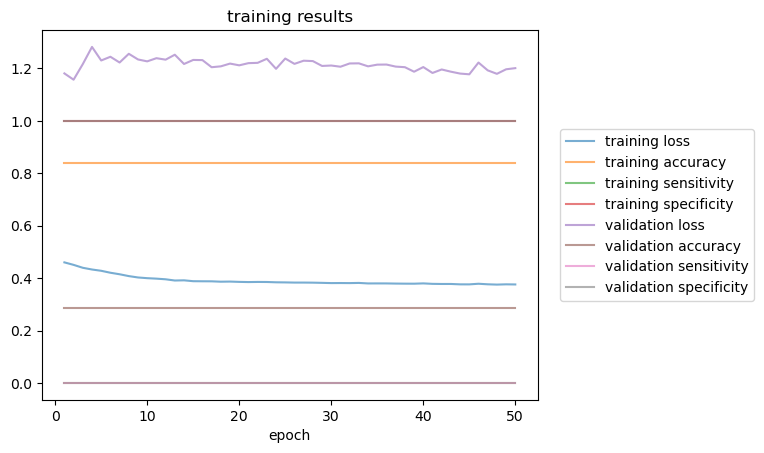

15 2.4720334674014737 7 1 bce
0.7255897521972656
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3706, Training Accuracy: 0.8465, Training Sensitivity: 0.8822, Training Specificity: 0.8196, Validation Loss: 0.7509, Validation Accuracy: 0.6147, Validation Sensitivity: 0.0660, Validation Specificity: 0.9567
Epoch: 020, Training Loss: 0.3434, Training Accuracy: 0.8756, Training Sensitivity: 0.8323, Training Specificity: 0.9083, Validation Loss: 0.8237, Validation Accuracy: 0.6120, Validation Sensitivity: 0.0590, Validation Specificity: 0.9567
Epoch: 030, Training Loss: 0.3342, Training Accuracy: 0.8819, Training Sensitivity: 0.8323, Training Specificity: 0.9193, Validation Loss: 0.8438, Validation Accuracy: 0.6160, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.3254, Training Accuracy: 0.8932, Training Sensitivity: 0.8586, Training 

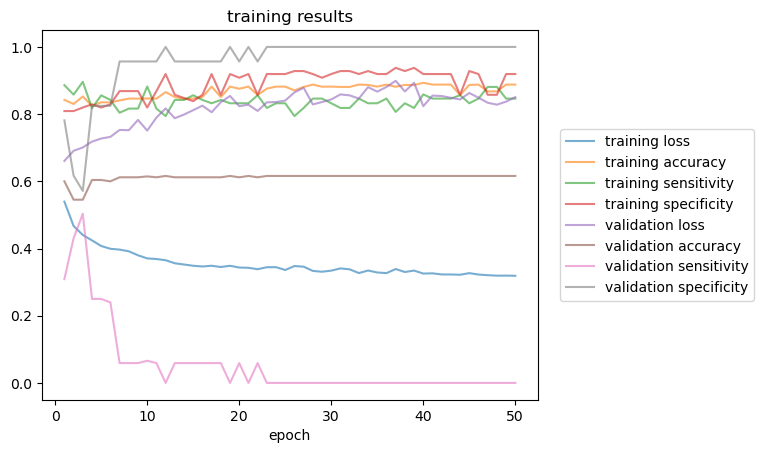

15 2.962711289868631 7 1 bce
1.2547922134399414
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3223, Training Accuracy: 0.8633, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.6327, Validation Accuracy: 0.7173, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3127, Training Accuracy: 0.8633, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.6883, Validation Accuracy: 0.7173, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3107, Training Accuracy: 0.8633, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.7356, Validation Accuracy: 0.7173, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3086, Training Accuracy: 0.8633, Training Sensitivity: 1.0000, Training S

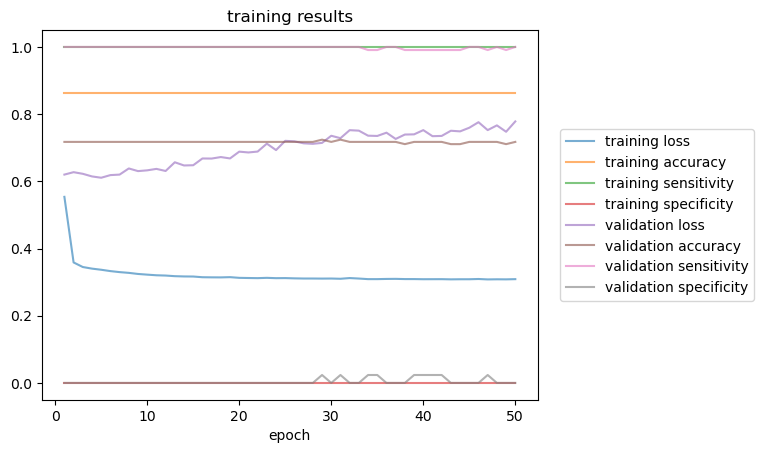

15 3.453389112335789 7 1 bce
1.2388579845428467
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3389, Training Accuracy: 0.8688, Training Sensitivity: 0.9933, Training Specificity: 0.3152, Validation Loss: 0.4693, Validation Accuracy: 0.8293, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3280, Training Accuracy: 0.8947, Training Sensitivity: 0.9933, Training Specificity: 0.4561, Validation Loss: 0.4572, Validation Accuracy: 0.8333, Validation Sensitivity: 1.0000, Validation Specificity: 0.0234
Epoch: 030, Training Loss: 0.3208, Training Accuracy: 0.9204, Training Sensitivity: 0.9873, Training Specificity: 0.6231, Validation Loss: 0.4559, Validation Accuracy: 0.8333, Validation Sensitivity: 1.0000, Validation Specificity: 0.0234
Epoch: 040, Training Loss: 0.3176, Training Accuracy: 0.9236, Training Sensitivity: 0.9873, Training S

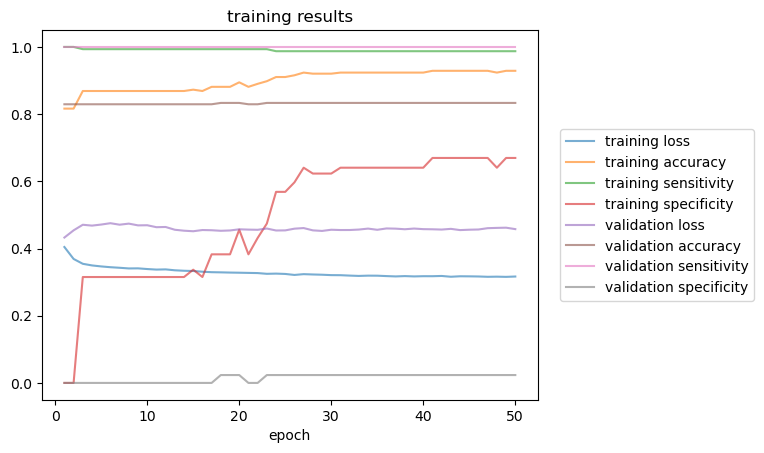

15 3.944066934802947 7 1 bce
1.060011625289917
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.4645, Training Accuracy: 0.8061, Training Sensitivity: 0.9449, Training Specificity: 0.5332, Validation Loss: 0.5777, Validation Accuracy: 0.6627, Validation Sensitivity: 0.7013, Validation Specificity: 0.3247
Epoch: 020, Training Loss: 0.4354, Training Accuracy: 0.8245, Training Sensitivity: 0.9584, Training Specificity: 0.5613, Validation Loss: 0.5606, Validation Accuracy: 0.6907, Validation Sensitivity: 0.7325, Validation Specificity: 0.3247
Epoch: 030, Training Loss: 0.4339, Training Accuracy: 0.8688, Training Sensitivity: 0.9342, Training Specificity: 0.7401, Validation Loss: 0.5917, Validation Accuracy: 0.6733, Validation Sensitivity: 0.7117, Validation Specificity: 0.3377
Epoch: 040, Training Loss: 0.4182, Training Accuracy: 0.8701, Training Sensitivity: 0.9495, Training Sp

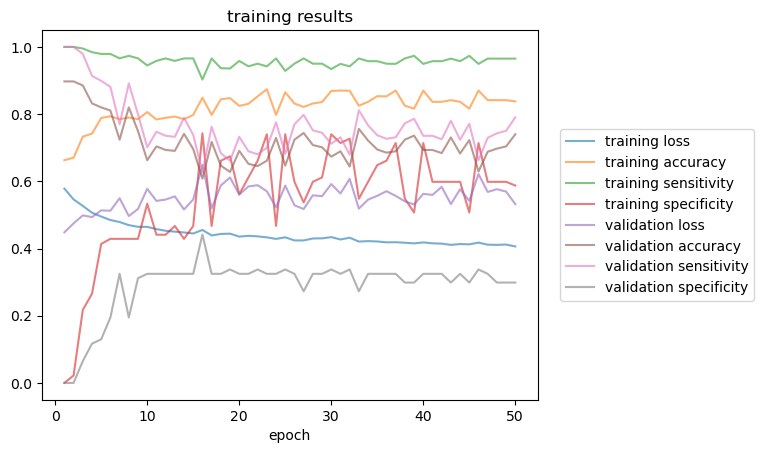

15 4.434744757270105 7 1 bce
1.7207958698272705
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2938, Training Accuracy: 0.9111, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3146, Validation Accuracy: 0.9027, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.2931, Training Accuracy: 0.9111, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3159, Validation Accuracy: 0.9027, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.2931, Training Accuracy: 0.9111, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3163, Validation Accuracy: 0.9027, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.2924, Training Accuracy: 0.9111, Training Sensitivity: 1.0000, Training S

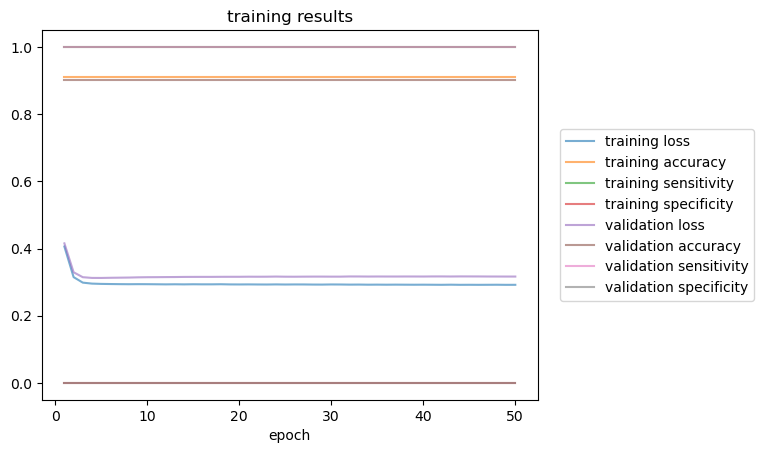

15 4.925422579737262 7 1 bce
1.611635684967041
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3022, Training Accuracy: 0.9188, Training Sensitivity: 0.9940, Training Specificity: 0.4289, Validation Loss: 0.2771, Validation Accuracy: 0.9227, Validation Sensitivity: 1.0000, Validation Specificity: 0.4630
Epoch: 020, Training Loss: 0.2950, Training Accuracy: 0.9188, Training Sensitivity: 0.9940, Training Specificity: 0.4289, Validation Loss: 0.2683, Validation Accuracy: 0.9227, Validation Sensitivity: 1.0000, Validation Specificity: 0.4630
Epoch: 030, Training Loss: 0.2907, Training Accuracy: 0.9232, Training Sensitivity: 0.9940, Training Specificity: 0.4619, Validation Loss: 0.2649, Validation Accuracy: 0.9227, Validation Sensitivity: 1.0000, Validation Specificity: 0.4630
Epoch: 040, Training Loss: 0.2928, Training Accuracy: 0.9232, Training Sensitivity: 0.9940, Training Sp

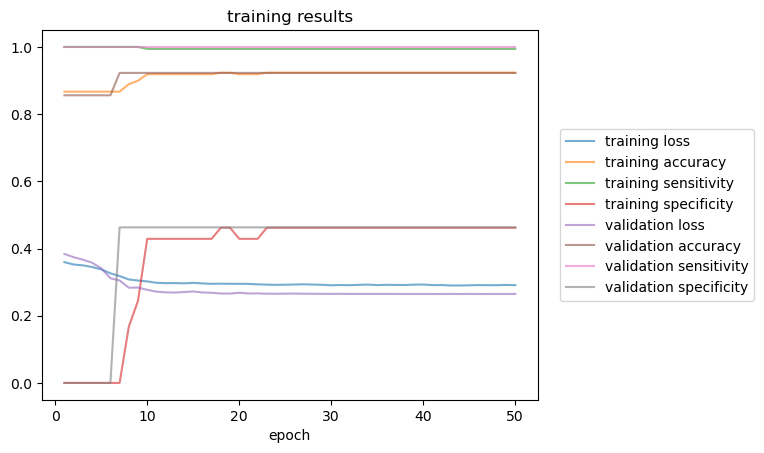

15 5.41610040220442 7 1 bce
1.8522744178771973
GCN(
  (conv1): GCNConv(15, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2985, Training Accuracy: 0.9095, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.2847, Validation Accuracy: 0.9160, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3002, Training Accuracy: 0.9095, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.2879, Validation Accuracy: 0.9160, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.2998, Training Accuracy: 0.9095, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.2874, Validation Accuracy: 0.9160, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.2992, Training Accuracy: 0.9095, Training Sensitivity: 1.0000, Training Sp

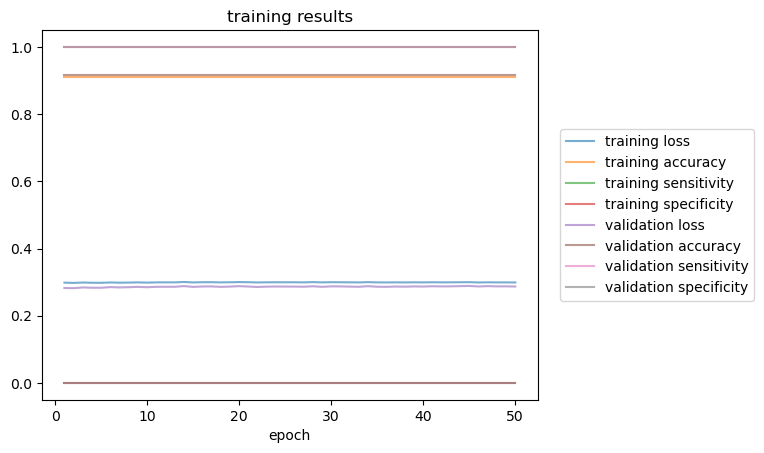

20 1.0 7 1 bce
1.130887746810913
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.1358, Training Accuracy: 0.9251, Training Sensitivity: 1.0000, Training Specificity: 0.9144, Validation Loss: 1.5875, Validation Accuracy: 0.7700, Validation Sensitivity: 0.4460, Validation Specificity: 0.8223
Epoch: 020, Training Loss: 0.1355, Training Accuracy: 0.9251, Training Sensitivity: 1.0000, Training Specificity: 0.9144, Validation Loss: 1.5920, Validation Accuracy: 0.7700, Validation Sensitivity: 0.4460, Validation Specificity: 0.8223
Epoch: 030, Training Loss: 0.1349, Training Accuracy: 0.9251, Training Sensitivity: 1.0000, Training Specificity: 0.9144, Validation Loss: 1.5873, Validation Accuracy: 0.7700, Validation Sensitivity: 0.4460, Validation Specificity: 0.8223
Epoch: 040, Training Loss: 0.1352, Training Accuracy: 0.9251, Training Sensitivity: 1.0000, Training Specificity: 0.9

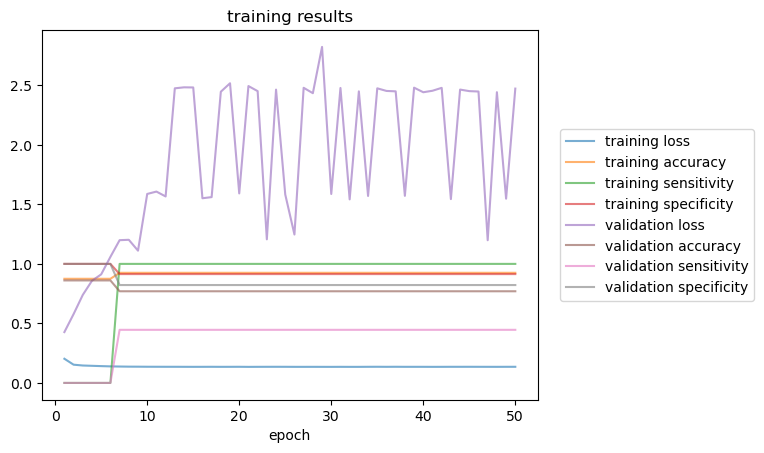

20 1.5546071719008867 7 1 bce
1.6726069450378418
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2843, Training Accuracy: 0.9079, Training Sensitivity: 0.9954, Training Specificity: 0.7558, Validation Loss: 0.5839, Validation Accuracy: 0.6770, Validation Sensitivity: 0.5926, Validation Specificity: 0.7283
Epoch: 020, Training Loss: 0.2592, Training Accuracy: 0.9257, Training Sensitivity: 0.9748, Training Specificity: 0.8404, Validation Loss: 0.6625, Validation Accuracy: 0.6310, Validation Sensitivity: 0.4550, Validation Specificity: 0.7379
Epoch: 030, Training Loss: 0.2439, Training Accuracy: 0.9226, Training Sensitivity: 0.9748, Training Specificity: 0.8319, Validation Loss: 0.6937, Validation Accuracy: 0.6340, Validation Sensitivity: 0.4630, Validation Specificity: 0.7379
Epoch: 040, Training Loss: 0.2414, Training Accuracy: 0.9291, Training Sensitivity: 0.9801, Training 

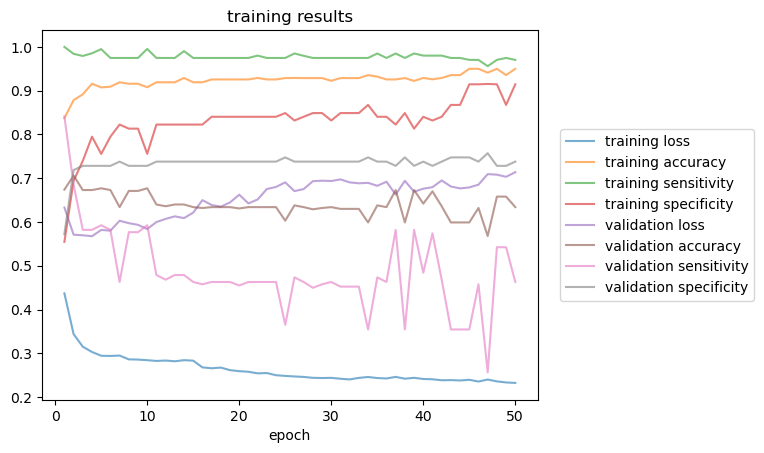

20 2.1092143438017734 7 1 bce
1.6374461650848389
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.2692, Training Accuracy: 0.9508, Training Sensitivity: 0.9509, Training Specificity: 0.9507, Validation Loss: 0.4978, Validation Accuracy: 0.7190, Validation Sensitivity: 0.7117, Validation Specificity: 0.7376
Epoch: 020, Training Loss: 0.2458, Training Accuracy: 0.9597, Training Sensitivity: 0.9658, Training Specificity: 0.9507, Validation Loss: 0.4701, Validation Accuracy: 0.7590, Validation Sensitivity: 0.7716, Validation Specificity: 0.7270
Epoch: 030, Training Loss: 0.2386, Training Accuracy: 0.9659, Training Sensitivity: 0.9763, Training Specificity: 0.9507, Validation Loss: 0.4432, Validation Accuracy: 0.7930, Validation Sensitivity: 0.8217, Validation Specificity: 0.7199
Epoch: 040, Training Loss: 0.2342, Training Accuracy: 0.9625, Training Sensitivity: 0.9705, Training 

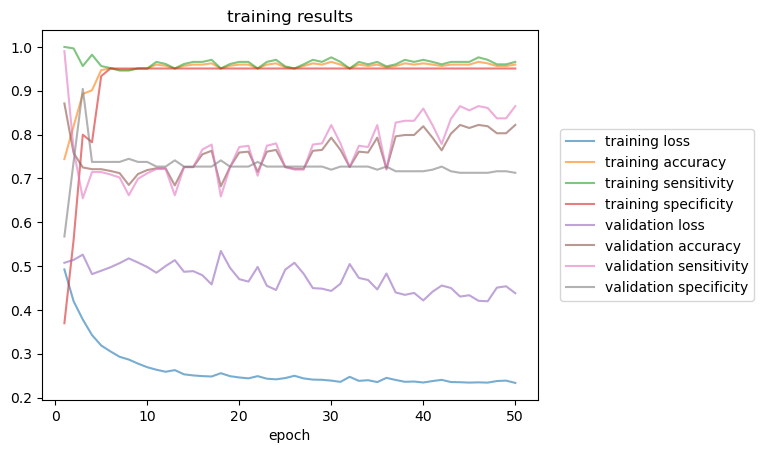

20 2.6638215157026606 7 1 bce
1.5140471458435059
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3639, Training Accuracy: 0.8285, Training Sensitivity: 0.9430, Training Specificity: 0.7098, Validation Loss: 0.9161, Validation Accuracy: 0.4350, Validation Sensitivity: 0.0520, Validation Specificity: 1.0000
Epoch: 020, Training Loss: 0.3478, Training Accuracy: 0.9412, Training Sensitivity: 0.9035, Training Specificity: 0.9802, Validation Loss: 1.0514, Validation Accuracy: 0.4040, Validation Sensitivity: 0.0000, Validation Specificity: 1.0000
Epoch: 030, Training Loss: 0.3326, Training Accuracy: 0.8394, Training Sensitivity: 0.9462, Training Specificity: 0.7288, Validation Loss: 0.9808, Validation Accuracy: 0.4350, Validation Sensitivity: 0.0520, Validation Specificity: 1.0000
Epoch: 040, Training Loss: 0.3331, Training Accuracy: 0.9099, Training Sensitivity: 0.9139, Training 

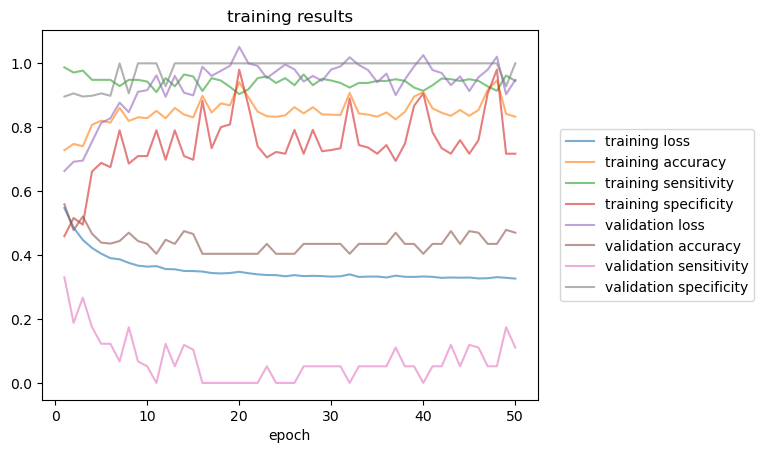

20 3.2184286876035473 7 1 bce
2.357581853866577
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3096, Training Accuracy: 0.9070, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.7343, Validation Accuracy: 0.7150, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3094, Training Accuracy: 0.9070, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.7457, Validation Accuracy: 0.7150, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3093, Training Accuracy: 0.9070, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.7465, Validation Accuracy: 0.7150, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3090, Training Accuracy: 0.9070, Training Sensitivity: 1.0000, Training S

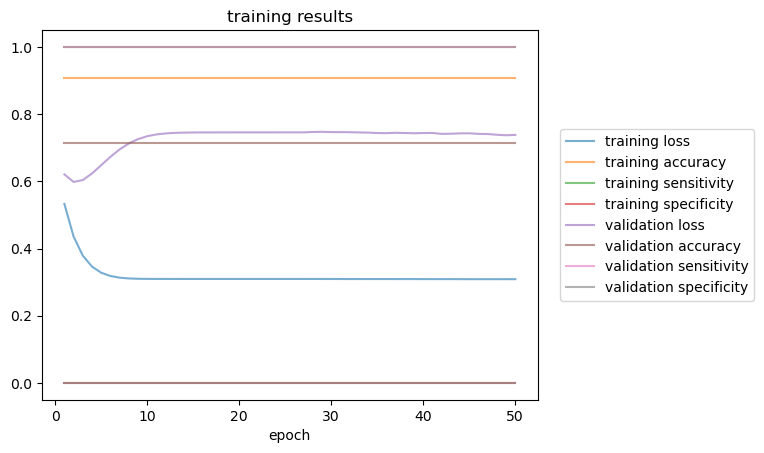

20 3.773035859504434 7 1 bce
2.4374911785125732
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3143, Training Accuracy: 0.8939, Training Sensitivity: 1.0000, Training Specificity: 0.1838, Validation Loss: 0.3818, Validation Accuracy: 0.8680, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3115, Training Accuracy: 0.9065, Training Sensitivity: 0.9968, Training Specificity: 0.3023, Validation Loss: 0.3826, Validation Accuracy: 0.8680, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3110, Training Accuracy: 0.9065, Training Sensitivity: 0.9968, Training Specificity: 0.3023, Validation Loss: 0.3816, Validation Accuracy: 0.8680, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3108, Training Accuracy: 0.9065, Training Sensitivity: 0.9968, Training S

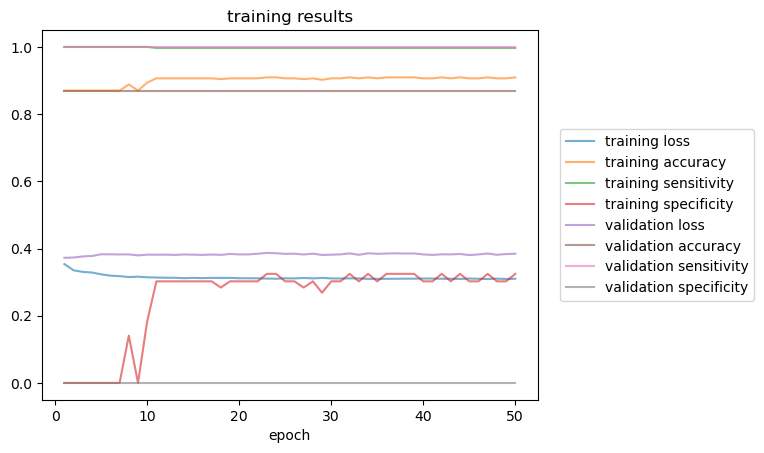

20 4.327643031405321 7 1 bce
2.773629903793335
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3101, Training Accuracy: 0.9042, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4320, Validation Accuracy: 0.8370, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3103, Training Accuracy: 0.9042, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4472, Validation Accuracy: 0.8370, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3104, Training Accuracy: 0.9042, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.4605, Validation Accuracy: 0.8370, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3096, Training Accuracy: 0.9042, Training Sensitivity: 1.0000, Training Sp

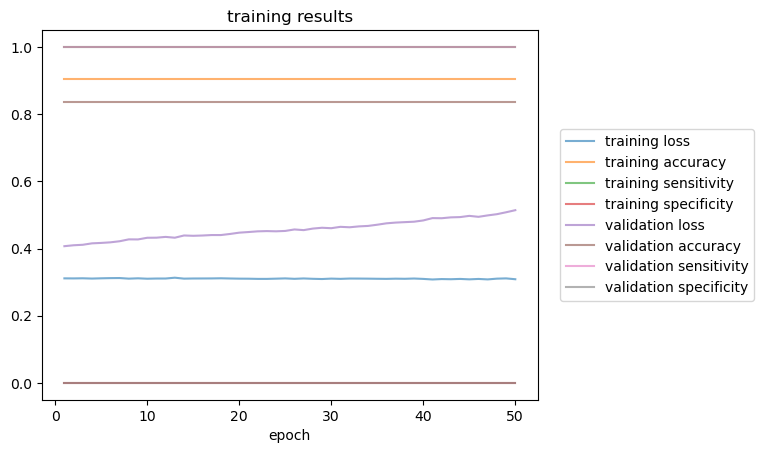

20 4.882250203306208 7 1 bce
2.7451956272125244
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3145, Training Accuracy: 0.9009, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3643, Validation Accuracy: 0.8730, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3135, Training Accuracy: 0.9009, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3684, Validation Accuracy: 0.8730, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 030, Training Loss: 0.3116, Training Accuracy: 0.9009, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3777, Validation Accuracy: 0.8730, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 040, Training Loss: 0.3082, Training Accuracy: 0.9009, Training Sensitivity: 1.0000, Training S

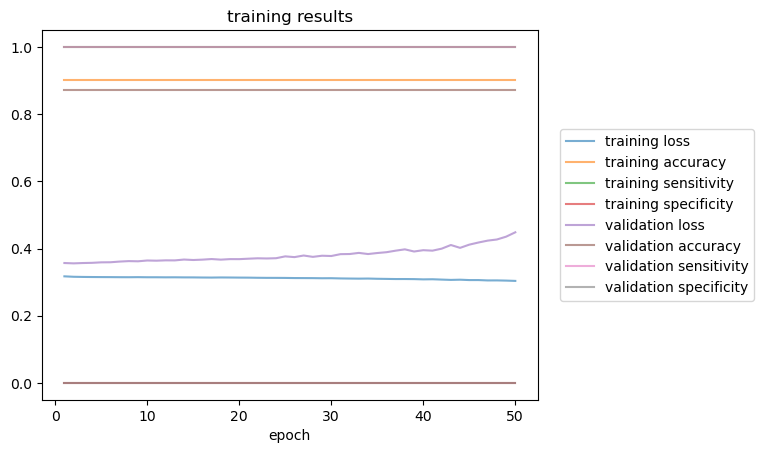

20 5.436857375207095 7 1 bce
2.9903604984283447
GCN(
  (conv1): GCNConv(20, 12)
  (conv2): GCNConv(12, 8)
  (conv3): GCNConv(8, 4)
  (conv4): GCNConv(4, 2)
  (sigmoid): Sigmoid()
)
Epoch: 010, Training Loss: 0.3129, Training Accuracy: 0.9029, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3004, Validation Accuracy: 0.9080, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000
Epoch: 020, Training Loss: 0.3128, Training Accuracy: 0.9029, Training Sensitivity: 1.0000, Training Specificity: 0.0000, Validation Loss: 0.3012, Validation Accuracy: 0.9080, Validation Sensitivity: 1.0000, Validation Specificity: 0.0000


In [ ]:
n_train = 500
n_val = 50
n_test = 50
n_epochs = 50
early_stopping_patience = None
t = 10
for max_n_samples_per_graph in [1]:
    for k in [7,9]:
        for n in [15,20,25,30,35,40,45,50,55,60]:
            results = []
            lamb = np.linspace(1,np.log(n)*2,t)
            for i in range(t):
                print(n,lamb[i],k,max_n_samples_per_graph,'bce')
                t1 = time.time()
                samples = generateSamples_sketch_classification(n_train,n_val,n_test,max_n_samples_per_graph,k,ErdosRenyiGraph,n,lamb[i]/n)
                t2 = time.time()
                print(t2-t1)
                outputs = run(samples,'gcn','bce','adam','cyclic-cosine',n_epochs,early_stopping_patience)
                results.append(outputs[1:])
            with open('ERresults_sketch_n'+str(n)+'_k'+str(k)+'_'+str(max_n_samples_per_graph)+'.pkl', 'wb') as file:
                pickle.dump(np.array(results), file)

In [ ]:
n_train = 500
n_val = 50
n_test = 50
n_epochs = 50
early_stopping_patience = None
t = 10
for max_n_samples_per_graph in [3,5]:
    for k in [1,5,7,9]:
        for n in [15,20,25,30,35,40,45,50,55,60]:
            results = []
            lamb = np.linspace(1,np.log(n)*2,t)
            for i in range(t):
                print(n,lamb[i],k,max_n_samples_per_graph,'bce')
                t1 = time.time()
                samples = generateSamples_sketch_classification(n_train,n_val,n_test,max_n_samples_per_graph,k,ErdosRenyiGraph,n,lamb[i]/n)
                t2 = time.time()
                print(t2-t1)
                outputs = run(samples,'gcn','bce','adam','cyclic-cosine',n_epochs,early_stopping_patience)
                results.append(outputs[1:])
            with open('ERresults_sketch_n'+str(n)+'_k'+str(k)+'_'+str(max_n_samples_per_graph)+'.pkl', 'wb') as file:
                pickle.dump(np.array(results), file)

In [ ]:
#with open('ERresults_sketch_n'+str(15)+'_k'+str(k)+'_'+str(n_samples)+'.pkl', 'rb') as file:
    #results = pickle.load(file)
#results

array([[GCN(
          (conv1): GCNConv(15, 12)
          (conv2): GCNConv(12, 8)
          (conv3): GCNConv(8, 4)
          (conv4): GCNConv(4, 2)
          (sigmoid): Sigmoid()
        )                         , 0.9448, 1.0, 0.928509756518736,
        0.784, 0.44, 0.8369230769230769, 0.9333333333333333, 0.5, 1.0],
       [GCN(
          (conv1): GCNConv(15, 12)
          (conv2): GCNConv(12, 8)
          (conv3): GCNConv(8, 4)
          (conv4): GCNConv(4, 2)
          (sigmoid): Sigmoid()
        )                         , 0.9112, 1.0, 0.0, 0.9066666666666666,
        1.0, 0.0, 0.908, 1.0, 0.0]], dtype=object)